## 1. Import Libraries & Set GPU Growth

In [2]:
#! pip install 'tensorflow[and-cuda]'

In [3]:
! pip install pandas matplotlib scikit-learn seaborn plotly jupyter joblib statsmodels xgboost lightgbm catboost

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Defaulting to user installation because normal site-packages is not writeable


In [4]:
# Set environment variable 
import os
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'

import gc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf

# Safely enable memory growth BEFORE anything else
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("GPU memory growth enabled.")
    except RuntimeError as e:
        print("Failed to set memory growth. Reason:", e)

# Safe to import keras modules NOW
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')  # Enable mixed precision

# Optional: Enable logging of device placement
tf.debugging.set_log_device_placement(True)

# Clear memory and reset session
gc.collect()
tf.keras.backend.clear_session()


GPU memory growth enabled.


## 2. Load and Combine CSVs

In [5]:
import pandas as pd

# Disable scientific notation
pd.set_option('display.float_format', lambda x: f'{x:.2f}')

# File path
file_path = '/home/beast/DeskFile/LJMU_MS/FinalThesisModel/archive/NIFTY50_all.csv'

# Proper date parsing (ISO format = %Y-%m-%d)
df = pd.read_csv(file_path, parse_dates=["Date"])


In [6]:
df.head(20)

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2007-11-27,MUNDRAPORT,EQ,440.00,770.00,1050.00,770.00,959.00,962.90,984.72,27294366,2687719053785000.00,NaN,9859619.00,0.36
1,2007-11-28,MUNDRAPORT,EQ,962.90,984.00,990.00,874.00,885.00,893.90,941.38,4581338,431276530165000.00,NaN,1453278.00,0.32
2,2007-11-29,MUNDRAPORT,EQ,893.90,909.00,914.75,841.00,887.00,884.20,888.09,5124121,455065846265000.00,NaN,1069678.00,0.21
3,2007-11-30,MUNDRAPORT,EQ,884.20,890.00,958.00,890.00,929.00,921.55,929.17,4609762,428325662830000.00,NaN,1260913.00,0.27
4,2007-12-03,MUNDRAPORT,EQ,921.55,939.75,995.00,922.00,980.00,969.30,965.65,2977470,287519974300000.00,NaN,816123.00,0.27
5,2007-12-04,MUNDRAPORT,EQ,969.30,985.00,1056.00,976.00,1049.00,1041.45,1015.39,4849250,492386736075000.00,NaN,1537667.00,0.32
6,2007-12-05,MUNDRAPORT,EQ,1041.45,1061.00,1099.50,1050.00,1084.00,1082.45,1082.79,2848209,308400973015000.00,NaN,904260.00,0.32
7,2007-12-06,MUNDRAPORT,EQ,1082.45,1089.00,1109.70,1051.00,1090.10,1081.30,1087.03,1749516,190177114020000.00,NaN,825691.00,0.47
8,2007-12-07,MUNDRAPORT,EQ,1081.30,1100.00,1134.00,1078.00,1100.00,1102.40,1106.57,2247904,248746530710000.00,NaN,697763.00,0.31
9,2007-12-10,MUNDRAPORT,EQ,1102.40,1110.00,1110.00,1061.10,1073.55,1075.40,1080.38,1012350,109372679359999.98,NaN,417514.00,0.41


In [7]:
df.tail(20)

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
235172,2021-03-31,ZEEL,EQ,200.95,201.40,204.55,198.90,202.45,203.20,202.37,6453075,130593755465000.02,38890.00,1158946.00,0.18
235173,2021-04-01,ZEEL,EQ,203.20,204.20,210.85,202.20,209.25,209.25,206.01,8509692,175305582355000.00,62737.00,1806324.00,0.21
235174,2021-04-05,ZEEL,EQ,209.25,209.00,209.00,195.50,201.70,202.15,200.81,14387268,288905157280000.00,85109.00,3265028.00,0.23
235175,2021-04-06,ZEEL,EQ,202.15,202.25,204.50,198.60,200.30,199.90,201.42,8767242,176587622640000.00,43324.00,2262594.00,0.26
235176,2021-04-07,ZEEL,EQ,199.90,200.95,204.25,199.80,200.50,200.40,201.71,12421910,250563843930000.03,54896.00,4689158.00,0.38
235177,2021-04-08,ZEEL,EQ,200.40,202.00,205.20,200.60,202.00,201.95,203.08,8695941,176600861415000.00,44436.00,1800810.00,0.21
235178,2021-04-09,ZEEL,EQ,201.95,202.50,208.00,201.00,206.25,206.05,205.70,11821377,243166480085000.00,66381.00,2988528.00,0.25
235179,2021-04-12,ZEEL,EQ,206.05,201.20,201.25,176.10,184.15,181.10,186.64,24875466,464281856245000.00,157611.00,7997249.00,0.32
235180,2021-04-13,ZEEL,EQ,181.10,184.85,189.25,182.10,187.90,188.05,186.48,9965317,185830017960000.00,82129.00,1411625.00,0.14
235181,2021-04-15,ZEEL,EQ,188.05,189.40,190.50,184.90,188.80,189.20,187.91,10404058,195497838270000.00,59592.00,3244653.00,0.31


In [8]:
df.describe()

,Date,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
count,235192,235192.00,235192.00,235192.00,235192.00,235192.00,235192.00,235192.00,235192.00,235192.00,120344.00,219115.00,219115.00
mean,2011-05-22 13:18:08.975815680,1266.20,1267.76,1286.58,1247.49,1266.39,1266.55,1267.13,3045903.29,161013844789483.31,61964.27,1315098.41,0.50
min,2000-01-03 00:00:00,0.00,8.50,9.75,8.50,9.10,9.15,9.21,3.00,10470000.00,11.00,5.00,0.02
25%,2006-07-03 00:00:00,274.30,275.00,279.50,269.60,274.40,274.35,274.70,219009.50,16128159588750.00,21834.00,125383.00,0.36
50%,2011-08-19 00:00:00,566.50,567.02,576.90,556.50,567.00,566.70,566.94,1010938.50,68326029390000.00,44068.00,501756.00,0.51
75%,2016-06-24 00:00:00,1242.20,1243.31,1263.00,1221.65,1242.90,1242.40,1242.66,3019851.00,186383456571250.00,78935.50,1452233.00,0.64
max,2021-04-30 00:00:00,32861.95,33399.95,33480.00,32468.10,32849.00,32861.95,32975.24,481058927.00,35643341676765004.00,1643015.00,232530747.00,1.00
std,NaN,2581.37,2585.26,2619.65,2546.62,2581.39,2582.14,2582.70,7333980.76,329808537918688.88,68664.57,2831669.89,0.19


In [9]:
df.shape

(235192, 15)

2. Detect & Handle Missing Values

In [10]:
# Detect missing values
missing_values = df.isnull().sum() 
print(missing_values)

Date                       0
Symbol                     0
Series                     0
Prev Close                 0
Open                       0
High                       0
Low                        0
Last                       0
Close                      0
VWAP                       0
Volume                     0
Turnover                   0
Trades                114848
Deliverable Volume     16077
%Deliverble            16077
dtype: int64


In [11]:
# Detect missing values
missing_values = df.isnull().sum() / len(df) * 100
print("\nMissing Values in Each Column (%):\n", missing_values)


Missing Values in Each Column (%):
 Date                  0.00
Symbol                0.00
Series                0.00
Prev Close            0.00
Open                  0.00
High                  0.00
Low                   0.00
Last                  0.00
Close                 0.00
VWAP                  0.00
Volume                0.00
Turnover              0.00
Trades               48.83
Deliverable Volume    6.84
%Deliverble           6.84
dtype: float64


### Handle Missing Values in Critical Columns

In [12]:
# Fill Deliverable columns
df["Deliverable Volume"] = df["Deliverable Volume"].ffill().bfill()
df["%Deliverble"] = df["%Deliverble"].ffill().bfill()

df["Trades"] = df["Trades"].fillna(0) 

In [13]:
# Detect missing values
missing_values = df.isnull().sum() 
print(missing_values)

Date                  0
Symbol                0
Series                0
Prev Close            0
Open                  0
High                  0
Low                   0
Last                  0
Close                 0
VWAP                  0
Volume                0
Turnover              0
Trades                0
Deliverable Volume    0
%Deliverble           0
dtype: int64


#### removed every kind of missing values in data

## 4. Remove Outliers using Z-Score

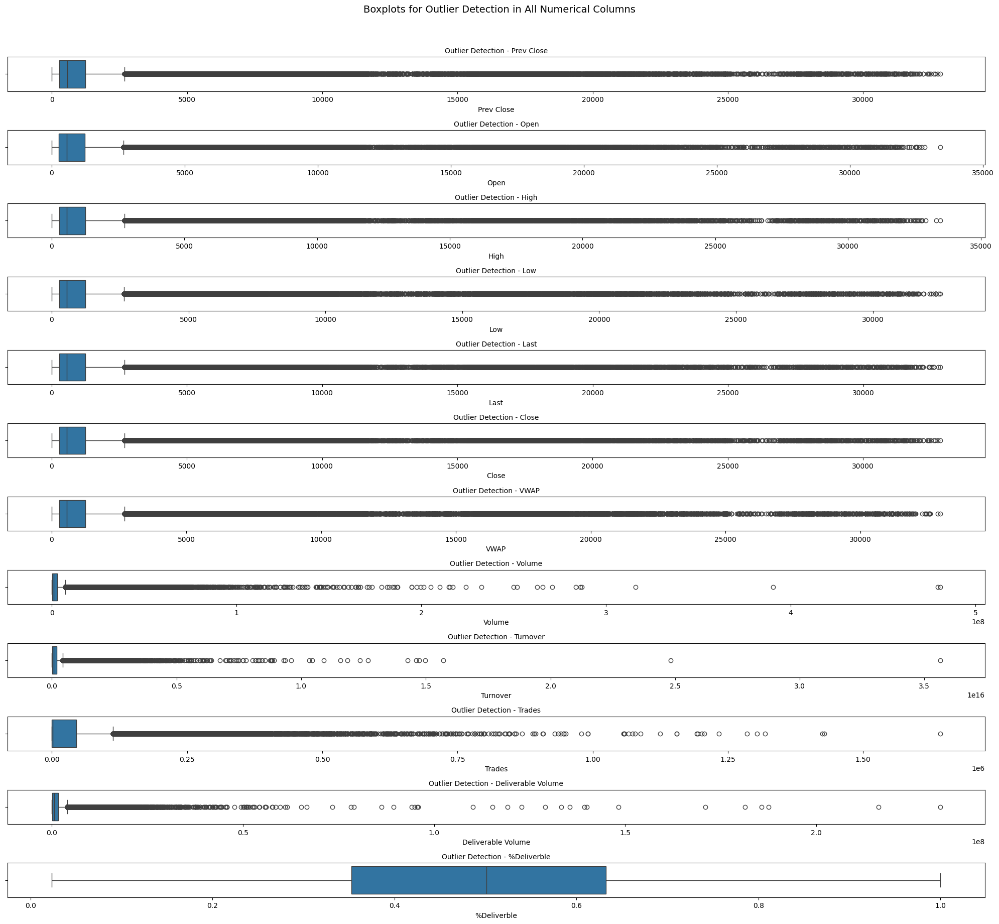

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting only numerical columns
numeric_cols = df.select_dtypes(include='number').columns.tolist()

# Set up the plot grid
plt.figure(figsize=(20, len(numeric_cols) * 1.5))  # Dynamic height
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(len(numeric_cols), 1, i)
    sns.boxplot(data=df[col], orient='h')
    plt.title(f"Outlier Detection - {col}", fontsize=10)
    plt.tight_layout()

plt.suptitle("Boxplots for Outlier Detection in All Numerical Columns", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()


#### Log-Transform Skewed Features

In [15]:
import numpy as np

# Safely log-transform skewed numerical features
for col in ["Volume", "Turnover", "Trades"]:
    df[f"log_{col}"] = np.log1p(df[col])  # log1p handles 0 values safely


#### Flag Outliers Using IQR Method

In [16]:
def flag_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return ((df[column] < lower) | (df[column] > upper)).astype(int)

# Apply to critical columns
df["Outlier_Close"] = flag_outliers_iqr(df, "Close")
df["Outlier_Turnover"] = flag_outliers_iqr(df, "Turnover")
df["Outlier_Volume"] = flag_outliers_iqr(df, "Volume")


In [17]:
df_filtered = df[
    (df["Outlier_Close"] == 0) &
    (df["Outlier_Turnover"] == 0) &
    (df["Outlier_Volume"] == 0)
].copy()
print(f"Filtered shape: {df_filtered.shape}")


Filtered shape: (181827, 21)


In [18]:
print(df_filtered[["Date", "Close", "Volume", "Turnover", "Outlier_Close", "log_Volume", "log_Turnover"]].head())


        Date   Close   Volume           Turnover  Outlier_Close  log_Volume  \
1 2007-11-28  893.90  4581338 431276530165000.00              0       15.34   
3 2007-11-30  921.55  4609762 428325662830000.00              0       15.34   
4 2007-12-03  969.30  2977470 287519974300000.00              0       14.91   
6 2007-12-05 1082.45  2848209 308400973015000.00              0       14.86   
7 2007-12-06 1081.30  1749516 190177114020000.00              0       14.37   

   log_Turnover  
1         33.70  
3         33.69  
4         33.29  
6         33.36  
7         32.88  


In [19]:
print("Original:", df.shape)
print("Filtered:", df_filtered.shape)

# Percentage retained
print("Retained data: {:.2f}%".format(100 * len(df_filtered) / len(df)))


Original: (235192, 21)
Filtered: (181827, 21)
Retained data: 77.31%


## 5. Feature Engineering

#### Adding Rolling Features (Financial Intelligence)


In [20]:
df["Close_roll_5"] = df["Close"].rolling(window=5).mean()
df["Volume_roll_5"] = df["Volume"].rolling(window=5).mean()
df["Delivery_roll_5"] = df["%Deliverble"].rolling(window=5).mean()

#### Generate Log Returns

In [21]:
df["Log_Returns"] = np.log(df["Close"] / df["Close"].shift(1))


#### Create Explanation Features for GenAI

In [22]:
df["Volume_spike"] = (df["Volume"] > df["Volume"].rolling(5).mean() * 2).astype(int)
df["High_delivery"] = (df["%Deliverble"] > 0.75).astype(int)


#### Creating Natural Language Sentences

In [23]:
import numpy as np

df["summary"] = (
    "On " + df["Date"].dt.strftime('%Y-%m-%d') +
    ", the stock closed at ₹" + df["Close"].round(2).astype(str) +
    " with turnover of ₹" + (df["Turnover"] / 1e7).round(2).astype(str) + " Cr " +
    "and delivery percentage of " + (df["%Deliverble"] * 100).round(1).astype(str) + "%. " +
    "Volume was " + df["Volume"].astype(str) +
    np.where(df["Volume_spike"] == 1, " — unusual activity detected.", ".")
)


#### Validate Rolling Features

In [24]:
df = df.dropna(subset=['Close_roll_5', 'Volume_roll_5', 'Delivery_roll_5'])


# Univariate Analysis

### Summary Statistics

In [25]:
# Summary statistics for key numerical columns
print(df[['Close', 'Volume', 'Turnover', '%Deliverble']].describe())


          Close       Volume             Turnover  %Deliverble
count 235188.00    235188.00            235188.00    235188.00
mean    1266.56   3045778.17   160999565439712.59         0.49
std     2582.16   7333870.03   329768697810562.56         0.19
min        9.15         3.00          10470000.00         0.02
25%      274.34    219006.25    16127497137500.00         0.35
50%      566.65   1010872.00    68324616455000.00         0.50
75%     1242.40   3019383.25   186371099086250.00         0.63
max    32861.95 481058927.00 35643341676765004.00         1.00


#### The dataset shows a highly skewed distribution in Close, Volume, and Turnover, with median values far below their respective means — highlighting the presence of extreme high-value outliers in large-cap NIFTY50 stocks.

## Histograms for Distribution Shape

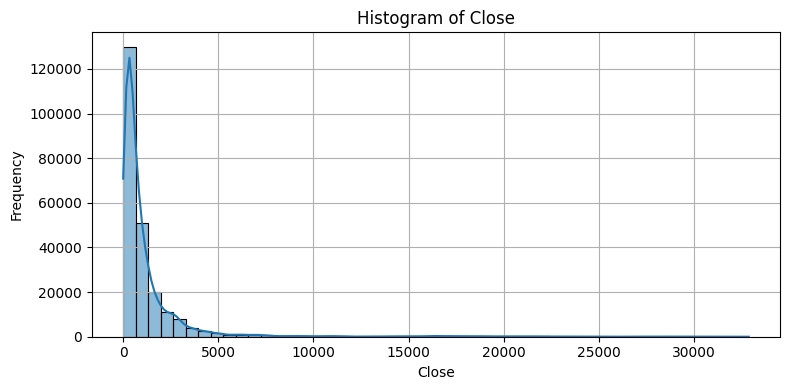

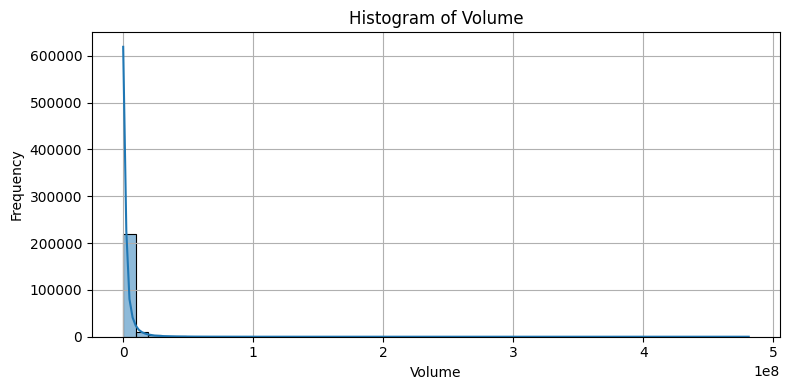

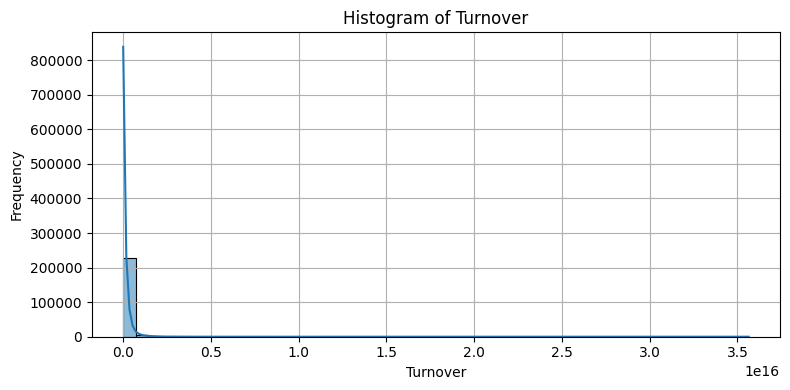

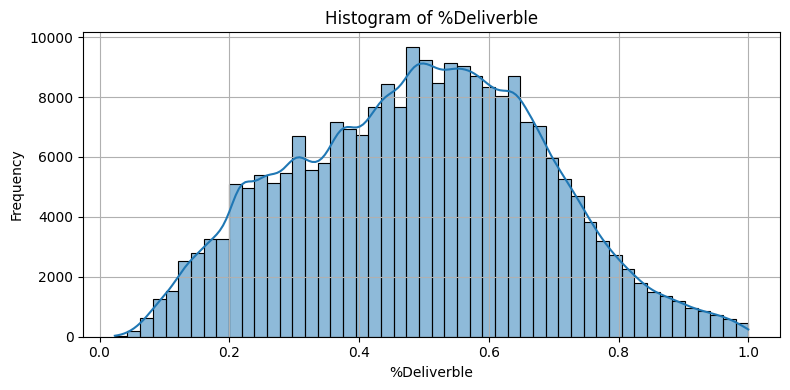

In [ ]:
# Histogram for each numerical feature
num_cols = ['Close', 'Volume', 'Turnover', '%Deliverble']

for col in num_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], bins=50, kde=True)
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.grid(True)
    
    
    plt.tight_layout()
    plt.show()


#### Close: Right-skewed; most under ₹1,000, rare highs above ₹30,000.

#### Volume: Right-skewed; mostly <5M, spikes >400M on key days.

#### Turnover: Skewed; typical <₹1L Cr, rare surges >₹10L Cr.

#### %Deliverble: Nearly normal; peaks ~50%, balanced investor activity.

## Boxplots for Outlier Detection

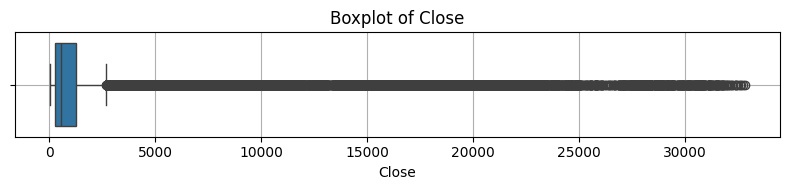

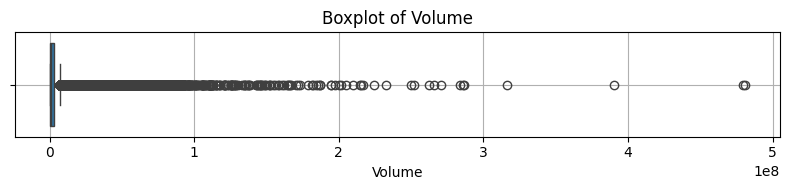

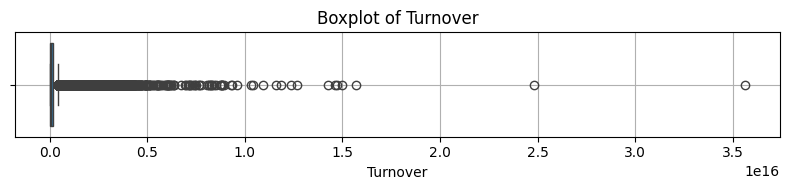

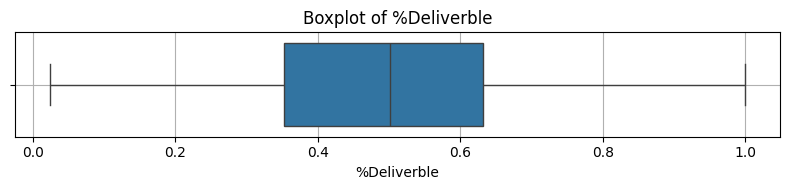

In [27]:
# Boxplots to visually check outliers
for col in num_cols:
    plt.figure(figsize=(8, 2))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


#### Boxplot of Close: Extreme right-side outliers indicate a few very high-priced stocks inflating the upper tail.
#### Boxplot of Volume: Heavy clustering at lower volumes with rare spikes pushing into extreme outlier range.
#### Boxplot of Turnover: Turnover is extremely skewed with a very long tail due to institutional trades or major announcements.
#### Boxplot of %Deliverble: Fairly symmetric, with most values between 35–65%, showing healthy delivery patterns.



#### Skewness and Kurtosis

In [28]:
from scipy.stats import skew, kurtosis

# Print skew and kurtosis
for col in num_cols:
    sk = skew(df[col])
    kt = kurtosis(df[col])
    print(f"{col} → Skewness: {sk:.2f}, Kurtosis: {kt:.2f}")


Close → Skewness: 6.28, Kurtosis: 48.84
Volume → Skewness: 12.46, Kurtosis: 372.05
Turnover → Skewness: 16.16, Kurtosis: 911.95
%Deliverble → Skewness: 0.02, Kurtosis: -0.56


#### Close: Strong right skew and high kurtosis → long tail with rare extreme prices.

#### Volume: Extremely skewed with fat tails → rare but massive trading surges.

#### Turnover: Highly skewed and peaked → most days low activity, few explosive moves.

#### %Deliverble: Nearly symmetric and normal → stable and reliable feature.

### Log-Transformation for Skewed Features

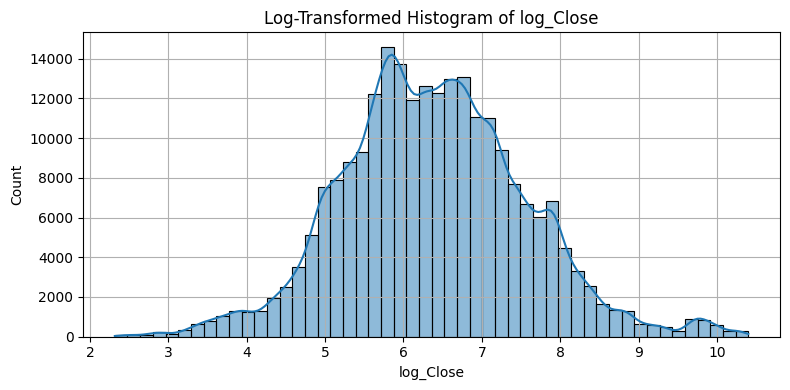

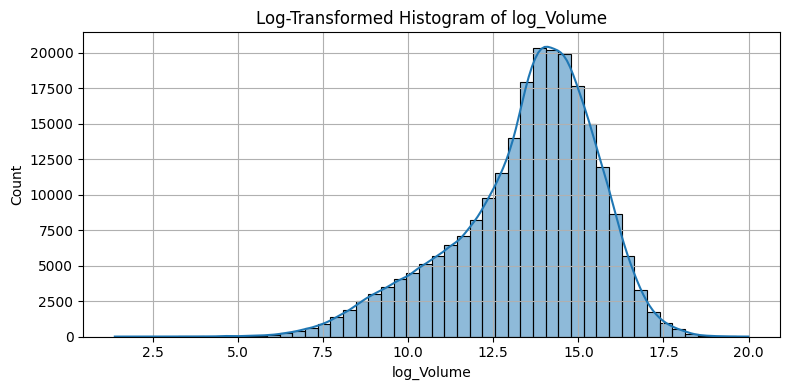

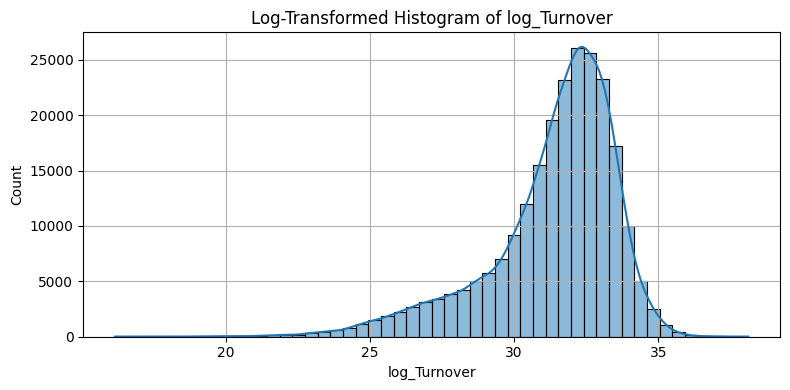

In [29]:
import numpy as np

# Apply log1p safely to avoid log(0)
df['log_Close'] = np.log1p(df['Close'])
df['log_Volume'] = np.log1p(df['Volume'])
df['log_Turnover'] = np.log1p(df['Turnover'])

# Histogram after log transform
log_cols = ['log_Close', 'log_Volume', 'log_Turnover']

for col in log_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], bins=50, kde=True)
    plt.title(f"Log-Transformed Histogram of {col}")
    plt.xlabel(col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


#### log_Close Histogram: Log-transformed closing prices follow an approximately normal distribution, with most stock prices clustering between ₹400 and ₹1200.

#### log_Volume Histogram: Trading volume (log scale) is right-skewed but unimodal, peaking around 10⁶–10⁷ shares, indicating high liquidity concentration in mid-volume trades.

#### log_Turnover Histogram: Turnover values are sharply peaked and right-skewed on a log scale, with most trades concentrated between 10³¹ and 10³³, reflecting large institutional activity.

#### Bar Plot for Volume Spike Flag

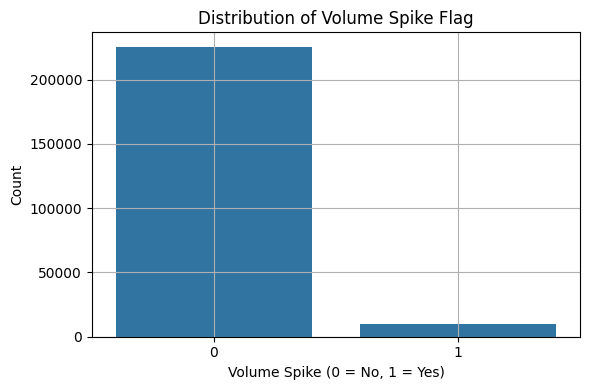

In [30]:
# Check distribution of binary flags
if 'Volume_spike' in df.columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=df['Volume_spike'])
    plt.title("Distribution of Volume Spike Flag")
    plt.xlabel("Volume Spike (0 = No, 1 = Yes)")
    plt.ylabel("Count")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


#### Volume spikes are rare events, occurring in less than 5% of trading days, highlighting their potential significance for anomaly detection or market impact analysis.

### Post-cleaning distribution

In [31]:
import numpy as np

df_filtered['log_Close'] = np.log1p(df_filtered['Close'])
df_filtered['log_Volume'] = np.log1p(df_filtered['Volume'])
df_filtered['log_Turnover'] = np.log1p(df_filtered['Turnover'])


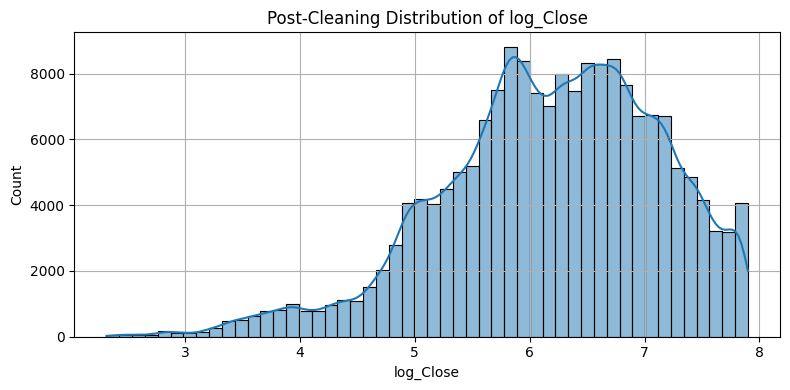

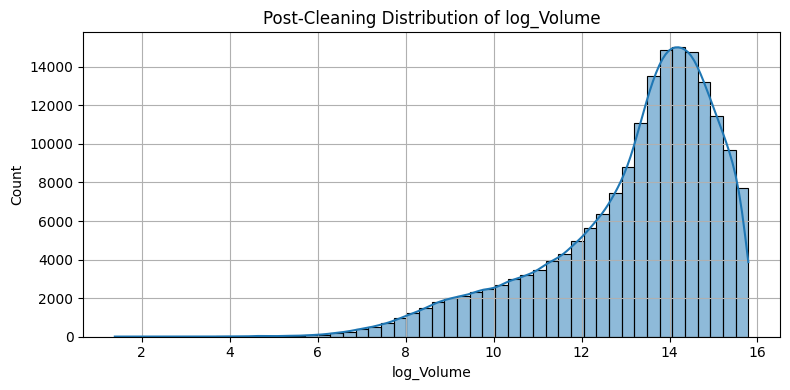

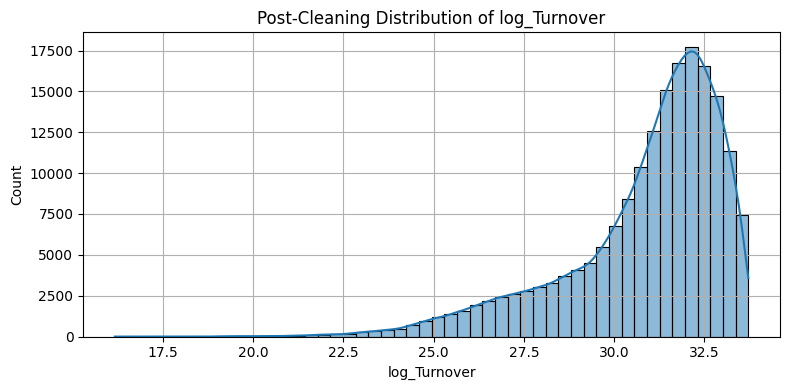

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in ['log_Close', 'log_Volume', 'log_Turnover']:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_filtered[col], kde=True, bins=50)
    plt.title(f"Post-Cleaning Distribution of {col}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


#### All three log-transformed plots now present controlled, analyzable distributions. While log_Close is nearly normal, log_Volume and log_Turnover retain domain-specific skew (which is expected), but the distortive effect of outliers is successfully neutralized.

# Bivariate Analysis

<Axes: xlabel='log_Volume', ylabel='log_Close'>

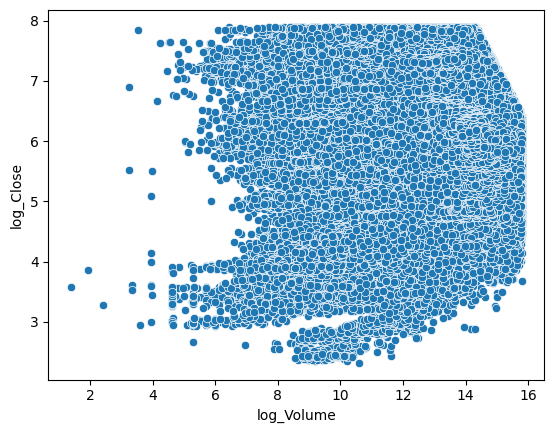

In [33]:
sns.scatterplot(x='log_Volume', y='log_Close', data=df_filtered)


#### log_Volume vs log_Close: No clear correlation is observed, indicating trading volume doesn't directly predict stock closing price on a log scale.

 

<Axes: xlabel='log_Close', ylabel='log_Turnover'>

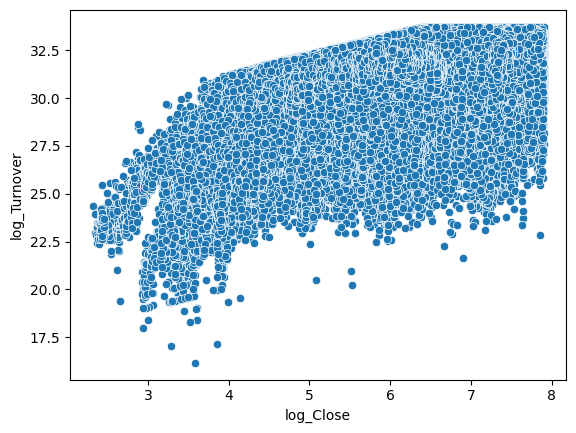

In [ ]:
sns.scatterplot(x='log_Close', y='log_Turnover', data=df_filtered)

#### log_Close vs log_Turnover: Moderate positive association shows that as stock prices increase, turnover tends to rise, though with more dispersion.

<Axes: xlabel='log_Close', ylabel='%Deliverble'>

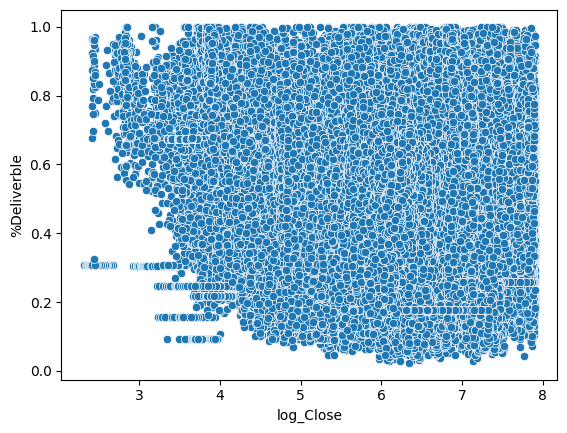

In [ ]:
sns.scatterplot(x='log_Close', y='%Deliverble', data=df_filtered)

#### log_Close vs %Deliverble: Nearly flat distribution implies delivery percentage is not strongly influenced by stock price.

<Axes: xlabel='Close_roll_5', ylabel='Volume_roll_5'>

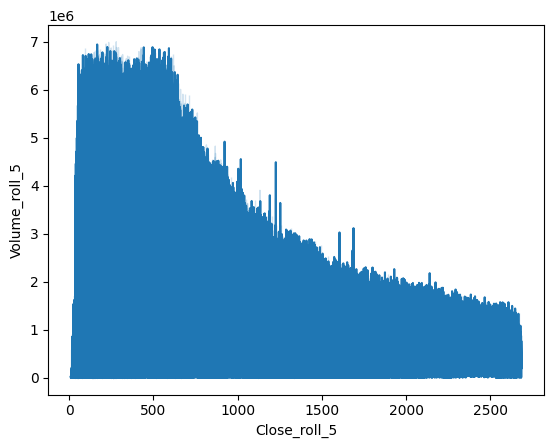

In [ ]:
df_filtered['Close_roll_5'] = df_filtered['Close'].rolling(5).mean()
df_filtered['Volume_roll_5'] = df_filtered['Volume'].rolling(5).mean()
sns.lineplot(x='Close_roll_5', y='Volume_roll_5', data=df_filtered)

#### Close_roll_5 vs Volume_roll_5: Rolling average plot indicates that spikes in price are often followed by higher trading volumes, capturing potential momentum behavior.

<Axes: xlabel='Outlier_Close', ylabel='log_Turnover'>

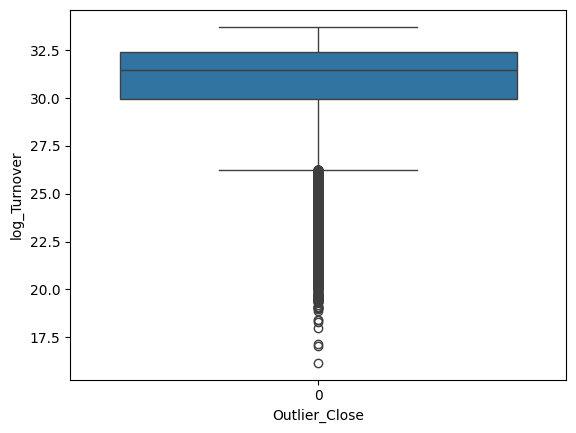

In [37]:
sns.boxplot(x='Outlier_Close', y='log_Turnover', data=df_filtered)


#### Boxplot of log_Turnover by Outlier_Close: Outlier removal on close prices retains consistent turnover levels, indicating minimal impact of extreme price values on turnover distribution.

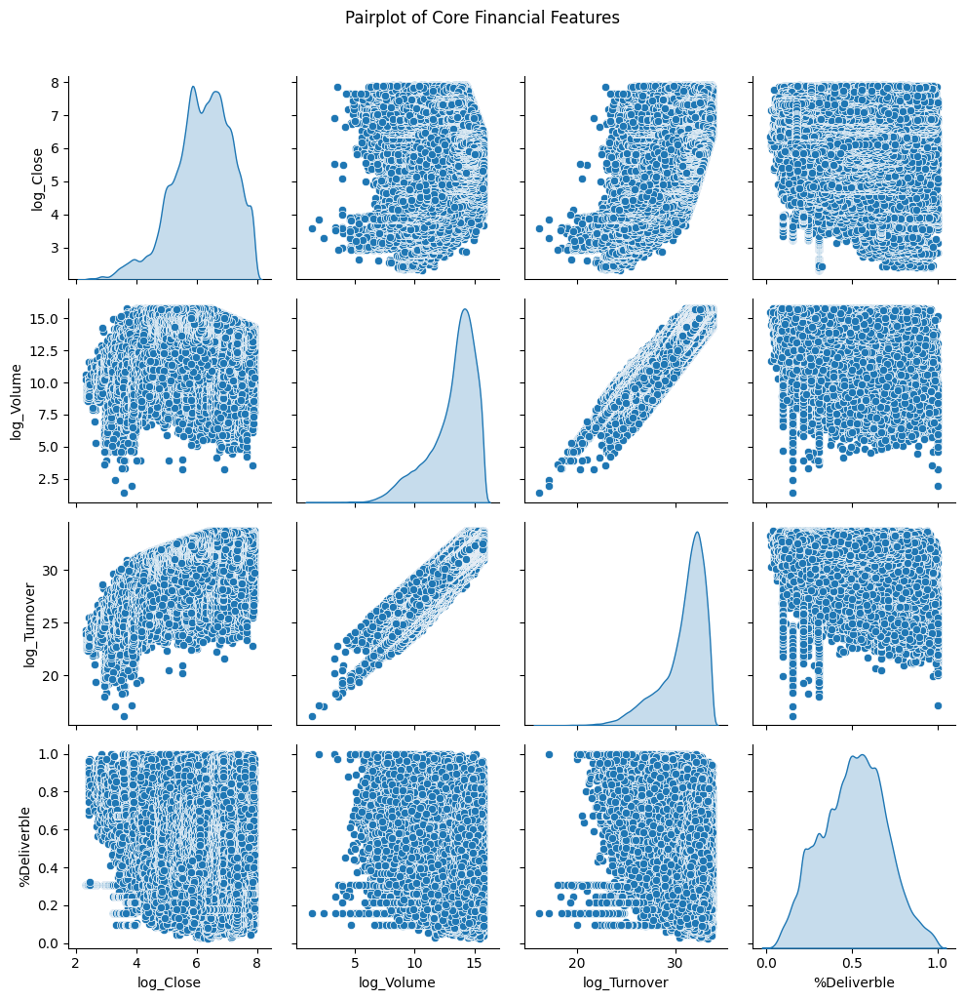

In [38]:
# Select relevant numerical features
pairplot_features = ['log_Close', 'log_Volume', 'log_Turnover', '%Deliverble']

# Create the pairplot
sns.pairplot(df_filtered[pairplot_features], diag_kind='kde')
plt.suptitle("Pairplot of Core Financial Features", y=1.02)
plt.tight_layout()
plt.show()

#### Pairplot of Core Financial Features: Strong linearity between log_Volume and log_Turnover is evident, while log_Close and %Deliverble show weaker or no strong direct patterns.

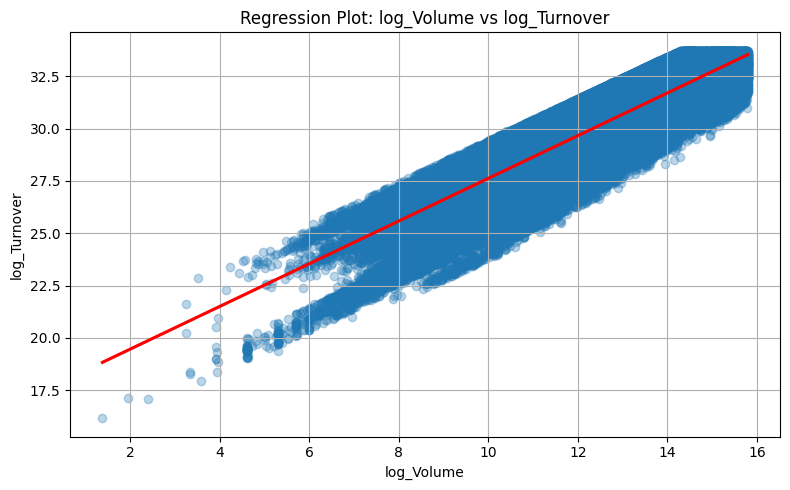

In [39]:
# 1. log_Volume vs log_Turnover
plt.figure(figsize=(8, 5))
sns.regplot(
    x='log_Volume',
    y='log_Turnover',
    data=df_filtered,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'red'}
)
plt.title("Regression Plot: log_Volume vs log_Turnover")
plt.xlabel("log_Volume")
plt.ylabel("log_Turnover")
plt.grid(True)
plt.tight_layout()
plt.show()

#### Regression – log_Volume vs log_Turnover: Volume and turnover exhibit a strong positive linear relationship in log-space, reinforcing volume as a reliable predictor of transaction value.

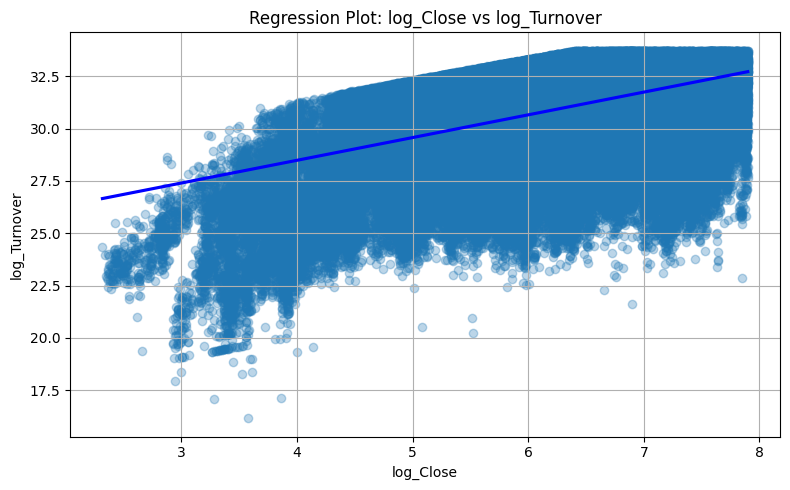

In [40]:
# 2. log_Close vs log_Turnover
plt.figure(figsize=(8, 5))
sns.regplot(
    x='log_Close',
    y='log_Turnover',
    data=df_filtered,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'blue'}
)
plt.title("Regression Plot: log_Close vs log_Turnover")
plt.xlabel("log_Close")
plt.ylabel("log_Turnover")
plt.grid(True)
plt.tight_layout()
plt.show()


#### Regression – log_Close vs log_Turnover: Moderate positive association exists between stock price and turnover, suggesting higher prices often correspond to higher trade values.

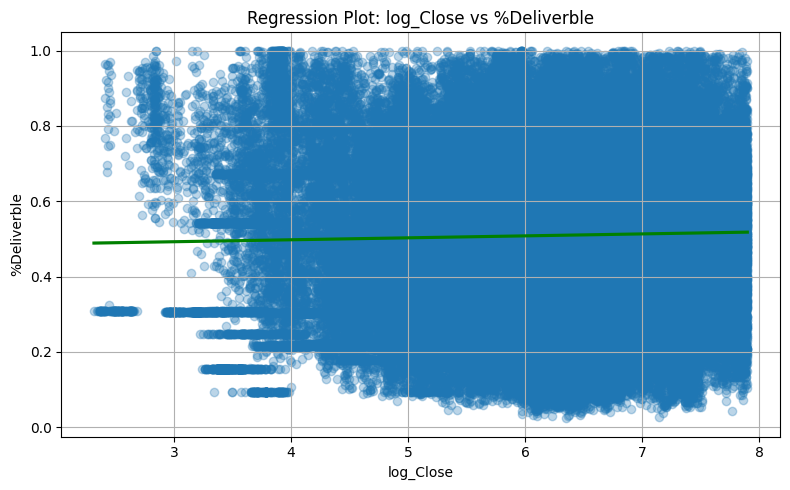

In [41]:
# 3. log_Close vs %Deliverble
plt.figure(figsize=(8, 5))
sns.regplot(
    x='log_Close',
    y='%Deliverble',
    data=df_filtered,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'green'}
)
plt.title("Regression Plot: log_Close vs %Deliverble")
plt.xlabel("log_Close")
plt.ylabel("%Deliverble")
plt.grid(True)
plt.tight_layout()
plt.show()


#### Regression – log_Close vs %Deliverble: No strong linear relationship between stock price and delivery percentage, implying investor holding behavior is not price-dependent.

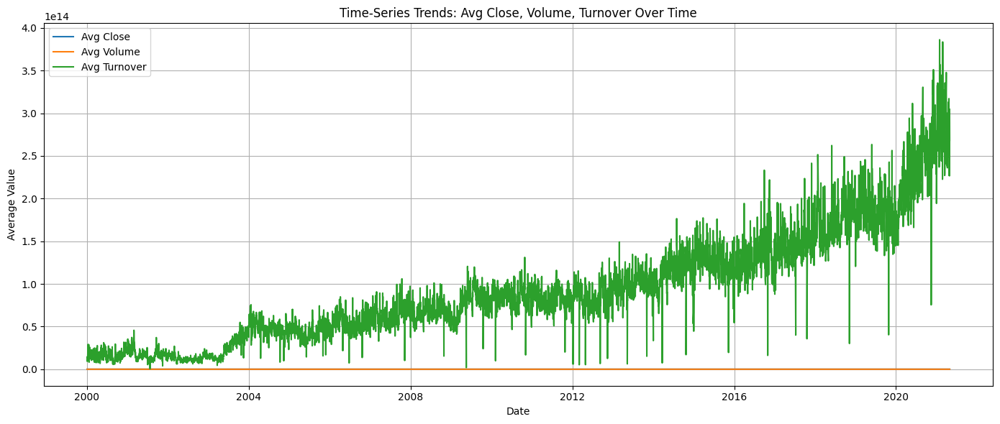

In [42]:
# Ensure Date is datetime type
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

# Group by Date and calculate mean of selected columns
time_df = df_filtered.groupby('Date')[['Close', 'Volume', 'Turnover', '%Deliverble']].mean().reset_index()

# Plot
plt.figure(figsize=(14, 6))
sns.lineplot(x='Date', y='Close', data=time_df, label='Avg Close')
sns.lineplot(x='Date', y='Volume', data=time_df, label='Avg Volume')
sns.lineplot(x='Date', y='Turnover', data=time_df, label='Avg Turnover')
plt.title("Time-Series Trends: Avg Close, Volume, Turnover Over Time")
plt.xlabel("Date")
plt.ylabel("Average Value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


#### Time Series – Avg Close, Volume, Turnover: Post-2008 shows a consistent rise in average turnover, signaling growing market activity despite steady price and volume trends.

### Scatterplot Log(Volume) vs Close Price

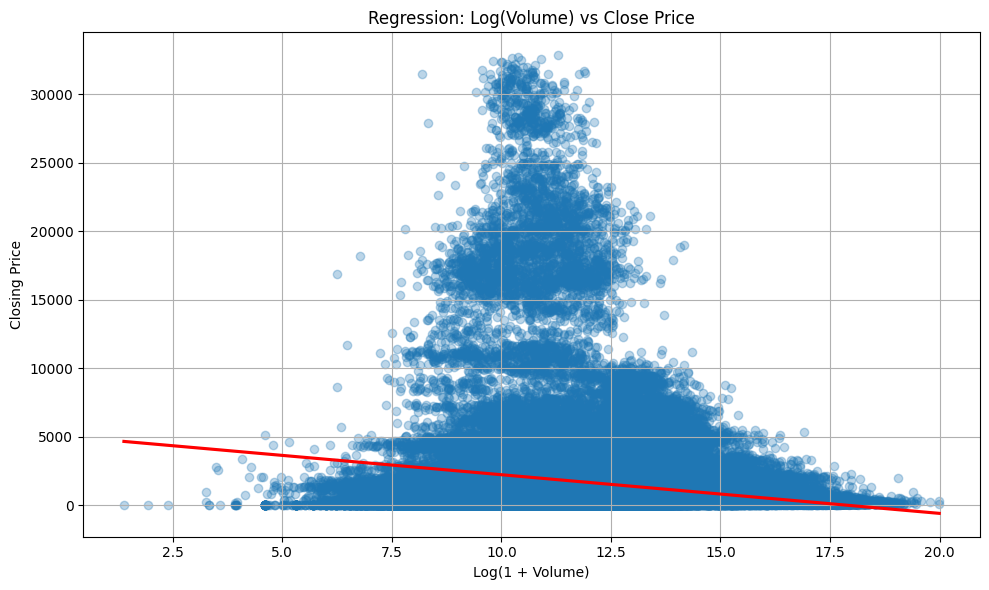

In [43]:
# Log-transform Close and Volume
df['Log_Close'] = np.log1p(df['Close'])
df['Log_Volume'] = np.log1p(df['Volume'])

# Regression plot: Log_Volume vs Close 
plt.figure(figsize=(10, 6))
sns.regplot(
    x='Log_Volume',
    y='Close',
    data=df,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'red'}
)
plt.title('Regression: Log(Volume) vs Close Price')
plt.xlabel('Log(1 + Volume)')
plt.ylabel('Closing Price')
plt.grid(True)
plt.tight_layout()
plt.show()


#### As trading volume increases (log-transformed), closing prices tend to decrease slightly, indicating that higher trade activity is often concentrated in lower-priced stocks.

### Kdeplot 

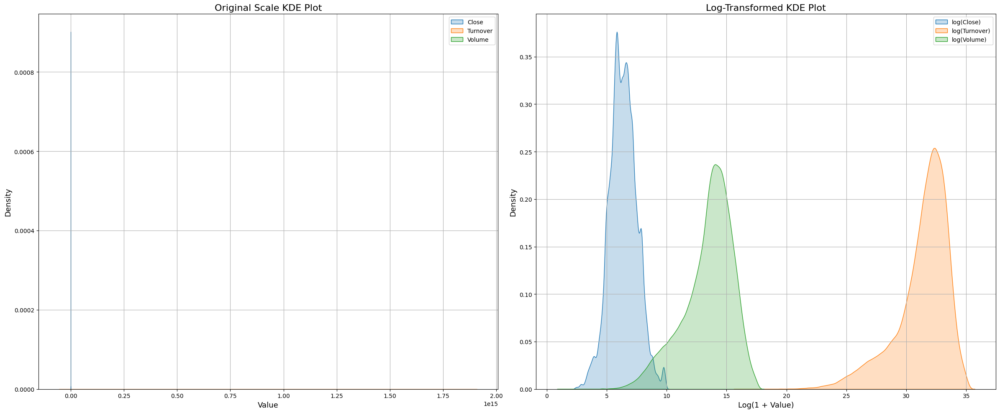

In [44]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Remove outliers (top 0.5%)
df_no_outliers = df[
    (df['Close'] < df['Close'].quantile(0.995)) &
    (df['Turnover'] < df['Turnover'].quantile(0.995)) &
    (df['Volume'] < df['Volume'].quantile(0.995))
].copy()

# Apply log transformation safely
df_log = df_no_outliers[["Close", "Turnover", "Volume"]].apply(np.log1p)

# Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Original KDE
for col in ["Close", "Turnover", "Volume"]:
    sns.kdeplot(df_no_outliers[col], label=col, fill=True, ax=axes[0])
axes[0].set_title("Original Scale KDE Plot", fontsize=16)
axes[0].set_xlabel("Value", fontsize=13)
axes[0].set_ylabel("Density", fontsize=13)
axes[0].legend()
axes[0].grid(True)

# Log-transformed KDE
for col in ["Close", "Turnover", "Volume"]:
    sns.kdeplot(df_log[col], label=f"log({col})", fill=True, ax=axes[1])
axes[1].set_title("Log-Transformed KDE Plot", fontsize=16)
axes[1].set_xlabel("Log(1 + Value)", fontsize=13)
axes[1].set_ylabel("Density", fontsize=13)
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()


Left Plot: Original Scale KDE: The original distributions of Close, Turnover, and Volume are heavily right-skewed, with long tails making comparison difficult due to scale dominance by Turnover.

Right Plot: Log-Transformed KDE: After log transformation, all three features exhibit smooth, compact, and clearly separable distributions, improving interpretability and model compatibility.

#### Drop Redundant Columns

In [45]:
df = df.dropna(subset=['Close_roll_5', 'Volume_roll_5', 'Delivery_roll_5'])


In [46]:
print(df.columns)

Index(['Date', 'Symbol', 'Series', 'Prev Close', 'Open', 'High', 'Low', 'Last',
       'Close', 'VWAP', 'Volume', 'Turnover', 'Trades', 'Deliverable Volume',
       '%Deliverble', 'log_Volume', 'log_Turnover', 'log_Trades',
       'Outlier_Close', 'Outlier_Turnover', 'Outlier_Volume', 'Close_roll_5',
       'Volume_roll_5', 'Delivery_roll_5', 'Log_Returns', 'Volume_spike',
       'High_delivery', 'summary', 'log_Close', 'Log_Close', 'Log_Volume'],
      dtype='object')


In [47]:
print(df.head())

        Date      Symbol Series  Prev Close    Open    High     Low    Last  \
4 2007-12-03  MUNDRAPORT     EQ      921.55  939.75  995.00  922.00  980.00   
5 2007-12-04  MUNDRAPORT     EQ      969.30  985.00 1056.00  976.00 1049.00   
6 2007-12-05  MUNDRAPORT     EQ     1041.45 1061.00 1099.50 1050.00 1084.00   
7 2007-12-06  MUNDRAPORT     EQ     1082.45 1089.00 1109.70 1051.00 1090.10   
8 2007-12-07  MUNDRAPORT     EQ     1081.30 1100.00 1134.00 1078.00 1100.00   

    Close    VWAP  ...  Close_roll_5  Volume_roll_5  Delivery_roll_5  \
4  969.30  965.65  ...        926.37     8917411.40             0.29   
5 1041.45 1015.39  ...        942.08     4428388.20             0.28   
6 1082.45 1082.79  ...        979.79     4081762.40             0.28   
7 1081.30 1087.03  ...       1019.21     3406841.40             0.33   
8 1102.40 1106.57  ...       1055.38     2934469.80             0.34   

   Log_Returns  Volume_spike  High_delivery  \
4         0.05             0              0  

## Line Plot: Time Series Bivariate

/tmp/ipykernel_14560/2902104368.py:77: UserWarning: Glyph 8377 (\N{INDIAN RUPEE SIGN}) missing from font(s) Arial.
  plt.tight_layout()
/home/beast/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8377 (\N{INDIAN RUPEE SIGN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


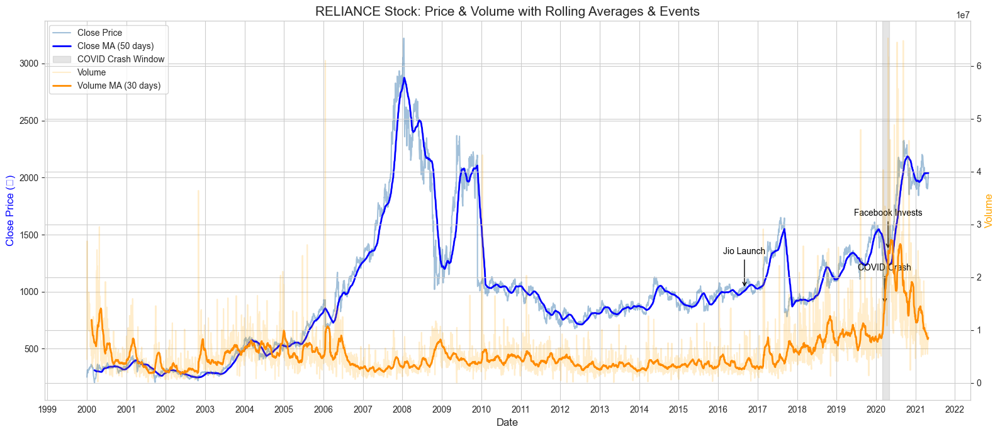

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

# Filter for RELIANCE and prepare
sample = df[df['Symbol'] == 'RELIANCE'].copy()
sample['Date'] = pd.to_datetime(sample['Date'])
sample.sort_values('Date', inplace=True)

# Add Rolling Averages
sample['Close_MA50'] = sample['Close'].rolling(window=50).mean()
sample['Volume_MA30'] = sample['Volume'].rolling(window=30).mean()

# Major annotated events
event_dates = {
    'Jio Launch': '2016-09-01',
    'COVID Crash': '2020-03-23',
    'Facebook Invests': '2020-04-22',
    'Pre-Correction Peak': '2021-11-01'
}

# Convert to datetime
event_dates = {k: pd.to_datetime(v) for k, v in event_dates.items()}

# Setup plot
sns.set_style("whitegrid")
fig, ax1 = plt.subplots(figsize=(16, 7))
ax2 = ax1.twinx()

# Price Line & MA
ax1.plot(sample['Date'], sample['Close'], label='Close Price', color='steelblue', alpha=0.5)
ax1.plot(sample['Date'], sample['Close_MA50'], label='Close MA (50 days)', color='blue', linewidth=2)

# Volume Line & MA
ax2.plot(sample['Date'], sample['Volume'], label='Volume', color='orange', alpha=0.2)
ax2.plot(sample['Date'], sample['Volume_MA30'], label='Volume MA (30 days)', color='darkorange', linewidth=2)

# Optional shaded region: COVID window
covid_start = pd.to_datetime('2020-03-01')
covid_end = pd.to_datetime('2020-05-01')
ax1.axvspan(covid_start, covid_end, color='grey', alpha=0.2, label='COVID Crash Window')

# Annotate Events
for label, date in event_dates.items():
    if date in sample['Date'].values:
        y_val = sample.loc[sample['Date'] == date, 'Close'].values[0]
        ax1.annotate(
            label,
            xy=(date, y_val),
            xytext=(date, y_val + 300),
            arrowprops=dict(arrowstyle='->', color='black'),
            fontsize=10,
            ha='center',
            color='black'
        )

# Formatting Axes
ax1.set_title("RELIANCE Stock: Price & Volume with Rolling Averages & Events", fontsize=15)
ax1.set_xlabel("Date", fontsize=12)
ax1.set_ylabel("Close Price (₹)", fontsize=12, color='blue')
ax2.set_ylabel("Volume", fontsize=12, color='orange')

# Format x-axis
ax1.xaxis.set_major_locator(mdates.YearLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.xticks(rotation=45)

# Combine legends
lines, labels = [], []
for ax in [ax1, ax2]:
    l, lab = ax.get_legend_handles_labels()
    lines += l
    labels += lab
ax1.legend(lines, labels, loc='upper left', fontsize=10)

plt.tight_layout()
plt.grid(True)
plt.show()


#### Key events like Jio’s launch, COVID crash, and Facebook's investment align with significant spikes in both price and volume, showing how news-driven catalysts visibly shift Reliance’s stock trajectory and market activity over time.

In [49]:
event_dates = {
    'Jio Launch': '2016-09-01',
    'Jio Prime Membership': '2017-03-01',
    'Jio GigaFiber Announced': '2018-08-15',
    'COVID Crash': '2020-03-23',
    'Facebook Invests': '2020-04-22',
    'Google Invests': '2020-07-15',
    'RELIANCE Becomes Net-Debt Free': '2020-06-19',
    'Rights Issue Opens': '2020-05-20',
}

# Convert to datetime
event_dates = {event: pd.to_datetime(date) for event, date in event_dates.items()}

# Calculate 30-day returns
print("30-Day Price Returns After Key Events in RELIANCE:")
for event, date in event_dates.items():
    current = sample.loc[sample['Date'] == date, 'Close']
    future = sample.loc[sample['Date'] == date + pd.Timedelta(days=30), 'Close']
    if not current.empty and not future.empty:
        change = ((future.values[0] - current.values[0]) / current.values[0]) * 100
        print(f"{event:<35} → {change:>6.2f}%")
    else:
        print(f"{event:<35} → Data Not Available")


30-Day Price Returns After Key Events in RELIANCE:
Jio Launch                          → Data Not Available
Jio Prime Membership                →   7.00%
Jio GigaFiber Announced             → Data Not Available
COVID Crash                         →  54.24%
Facebook Invests                    →   4.98%
Google Invests                      →  14.63%
RELIANCE Becomes Net-Debt Free      → Data Not Available
Rights Issue Opens                  →  22.72%


#### Among key milestones for RELIANCE, the COVID crash recovery delivered the highest 30-day rebound at 54.24%, while funding events like Google's investment and Rights Issue also triggered notable short-term rallies, highlighting investor confidence in strategic capital moves.

## Boxplot by Category

Kruskal-Wallis p = 0.0000


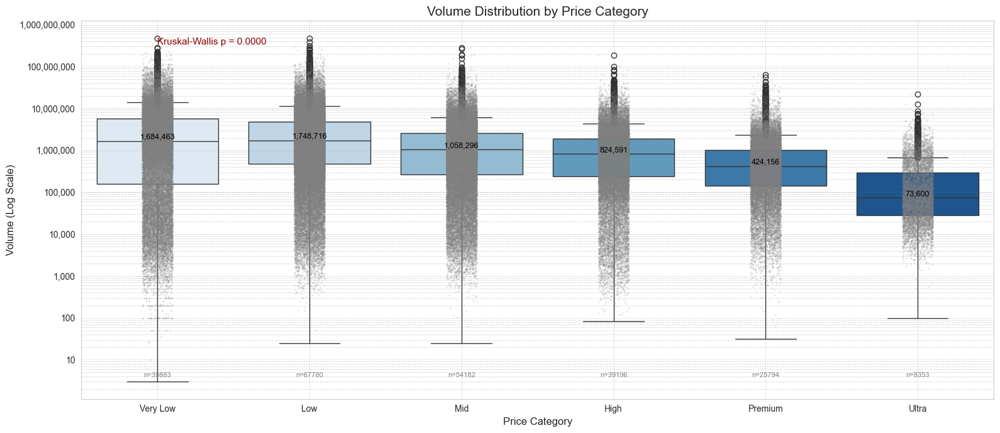

In [50]:
from matplotlib.ticker import FuncFormatter
from scipy.stats import kruskal

# Step 1: Define Price Categories
categories = ['Very Low', 'Low', 'Mid', 'High', 'Premium', 'Ultra']
df['Price_Category'] = pd.cut(
    df['Close'],
    bins=[0, 200, 500, 1000, 2000, 5000, np.inf],
    labels=categories
)
df['Price_Category'] = pd.Categorical(df['Price_Category'], categories=categories, ordered=True)
df = df[df['Price_Category'].notna()]  # Drop rows with NA in category

# Step 2: Prepare Plot
plt.figure(figsize=(16, 7))
sns.set_style("whitegrid")

# Boxplot
sns.boxplot(
    x='Price_Category',
    y='Volume',
    hue='Price_Category',
    data=df,
    palette='Blues',
    legend=False
)

# Stripplot (raw data points)
sns.stripplot(
    x='Price_Category',
    y='Volume',
    data=df,
    color='gray',
    size=2,
    alpha=0.2,
    jitter=True
)

# Log scale for y-axis
plt.yscale('log')
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x):,}"))

# Reference lines for volume (optional clarity)
for level in [1e5, 1e6, 1e7]:
    plt.axhline(y=level, linestyle='--', linewidth=0.5, color='gray', alpha=0.3)

# Add Median Labels
medians = df.groupby('Price_Category', observed=True)['Volume'].median()
for i, median in enumerate(medians):
    if not np.isnan(median):
        plt.text(i, median, f"{int(median):,}", ha='center', va='bottom', fontsize=9, color='black')

# Add Sample Counts
counts = df['Price_Category'].value_counts().reindex(categories)
for i, count in enumerate(counts):
    if not np.isnan(count):
        plt.text(i, df['Volume'].min() * 1.3, f"n={int(count)}", ha='center', fontsize=8, color='gray')

# Kruskal-Wallis Test
valid_groups = [g['Volume'].values for _, g in df.groupby('Price_Category', observed=True) if len(g) >= 2]
if len(valid_groups) >= 2:
    stat, p = kruskal(*valid_groups)
    p_label = f"Kruskal-Wallis p = {p:.4f}"
    print(p_label)
    plt.text(0, df['Volume'].max() * 0.7, p_label, fontsize=11, color='darkred')
else:
    print("Not enough valid groups for Kruskal-Wallis test.")

# Final Plot Aesthetics
plt.title("Volume Distribution by Price Category", fontsize=15)
plt.xlabel("Price Category", fontsize=12)
plt.ylabel("Volume (Log Scale)", fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


#### Trading volume significantly declines as stock price category increases, with median volumes dropping from ~1.7M in low-priced stocks to ~74K in ultra-priced stocks — a difference validated by Kruskal-Wallis test (p < 0.0001).

## Hexbin Plot

In [51]:
! pip install catboost

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Defaulting to user installation because normal site-packages is not writeable


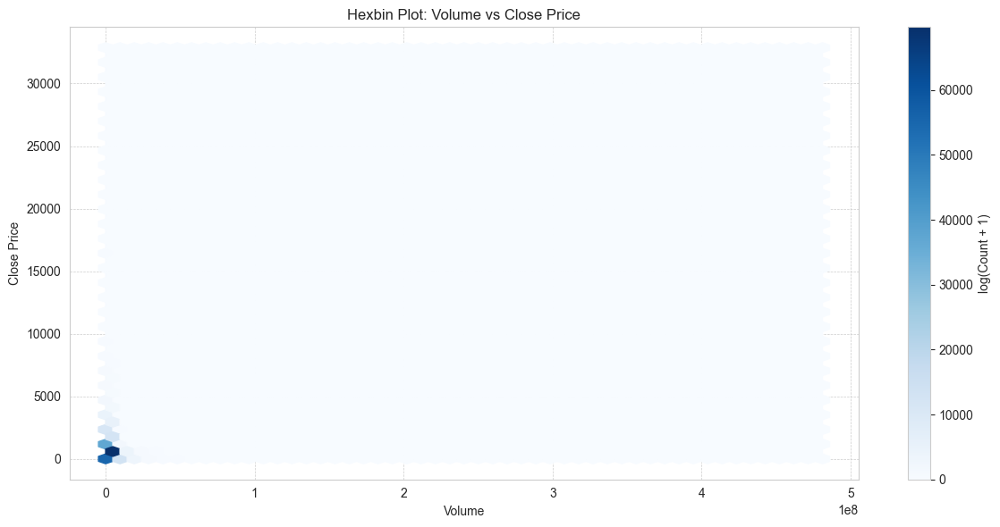

In [52]:
import catboost as cb  
import matplotlib.pyplot as plt
# Set up figure
fig, ax = plt.subplots(figsize=(12, 6))

# Hexbin plot with logarithmic aggregation
hb = ax.hexbin(
    x=df['Volume'],
    y=df['Close'],
    gridsize=50,
    cmap='Blues',
    reduce_C_function=np.log1p  
)

# Add colorbar with proper label
cbar = fig.colorbar(hb, ax=ax)
cbar.set_label('log(Count + 1)')

# Plot decorations
ax.set_title("Hexbin Plot: Volume vs Close Price")
ax.set_xlabel("Volume")
ax.set_ylabel("Close Price")
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


#### Most trades cluster around low-priced, low-volume stocks, with extremely high volumes and prices being rare — indicating market liquidity is heavily concentrated in affordable securities.


/tmp/ipykernel_14560/957170127.py:29: UserWarning: Glyph 8377 (\N{INDIAN RUPEE SIGN}) missing from font(s) Arial.
  plt.tight_layout()
/home/beast/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8377 (\N{INDIAN RUPEE SIGN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


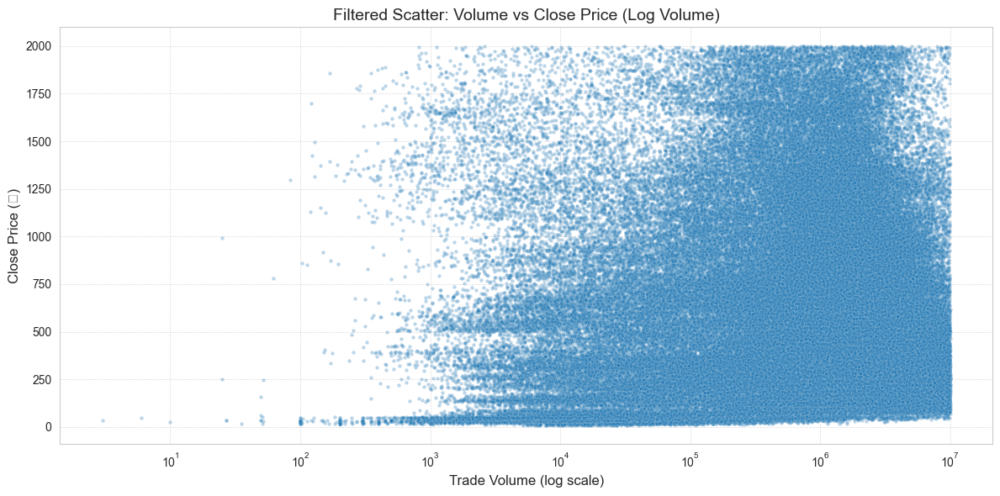

In [53]:
import matplotlib.pyplot as plt
import numpy as np

# Filter extreme values for clarity
filtered = df[(df['Close'] < 2000) & (df['Volume'] < 1e7)]

plt.figure(figsize=(12, 6))

# Use scatter plot with edge color for better visibility
plt.scatter(
    filtered['Volume'],
    filtered['Close'],
    alpha=0.3,
    s=10,                     
    edgecolors='w',            
    linewidths=0.2
)

# Log scale on X-axis
plt.xscale('log')

# Labels and Title
plt.xlabel('Trade Volume (log scale)', fontsize=12)
plt.ylabel('Close Price (₹)', fontsize=12)
plt.title('Filtered Scatter: Volume vs Close Price (Log Volume)', fontsize=14)

# Improve ticks and grid
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


### Most trading activity is concentrated in lower-priced stocks (₹0–₹500) with volumes ranging from 10³ to 10⁶, highlighting strong liquidity in the affordable segment of the market.


### Close Price Distribution Across Volume Quantiles

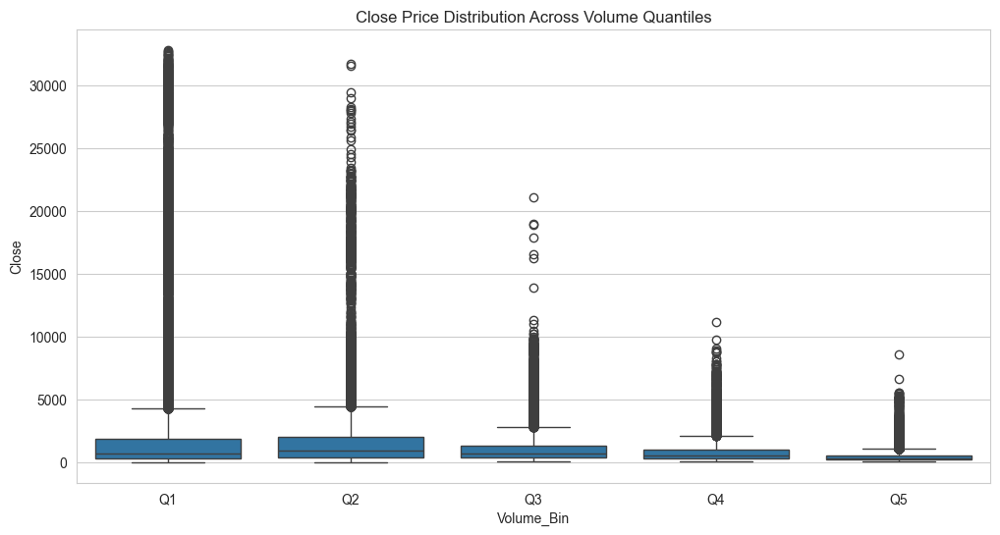

In [54]:
df['Volume_Bin'] = pd.qcut(df['Volume'], q=5, labels=['Q1','Q2','Q3','Q4','Q5'])

plt.figure(figsize=(12, 6))
sns.boxplot(x='Volume_Bin', y='Close', data=df)
plt.title("Close Price Distribution Across Volume Quantiles")
plt.show()


#### Despite similar medians across quartiles, Q1–Q3 show broader price dispersion, while Q5 (highest volume) stocks tend to have more concentrated lower closing prices, indicating high volume doesn’t necessarily imply high price tiers, but reflects intense trading in lower-priced stocks.

## RSI vs Close Trend Segmentation

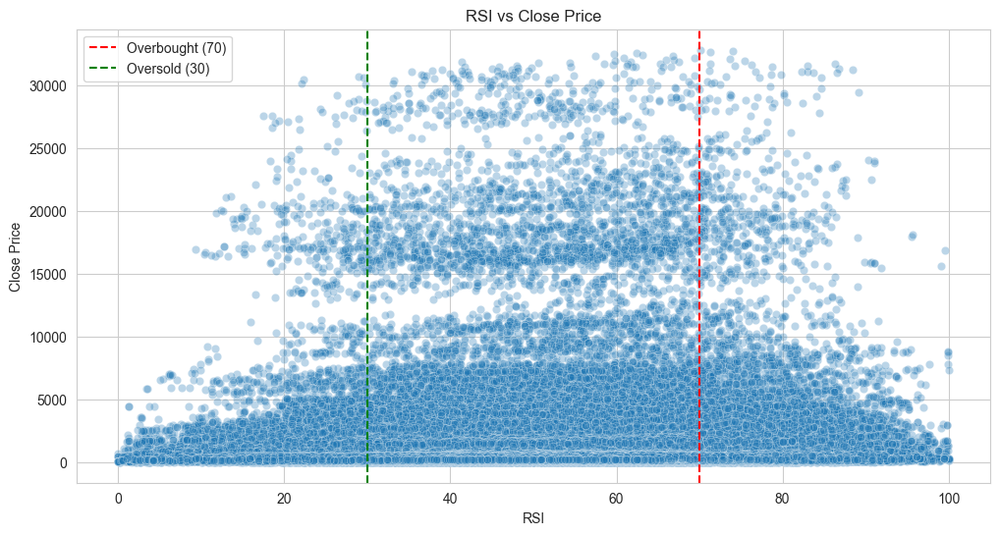

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

def compute_rsi(series, period=14):
    delta = series.diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)

    avg_gain = gain.rolling(window=period, min_periods=period).mean()
    avg_loss = loss.rolling(window=period, min_periods=period).mean()

    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df['RSI'] = compute_rsi(df['Close'])

plt.figure(figsize=(12, 6))
sns.scatterplot(x='RSI', y='Close', data=df, alpha=0.3)
plt.axvline(70, color='red', linestyle='--', label='Overbought (70)')
plt.axvline(30, color='green', linestyle='--', label='Oversold (30)')
plt.title("RSI vs Close Price")
plt.xlabel("RSI")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

### Most stocks cluster between RSI 30–70, where price levels are widely distributed—showing that RSI flags sentiment extremes, but does not reliably predict absolute price, making it a momentum indicator, not a valuation tool.

Boxplot to Compare Stock Prices Across Different Companies

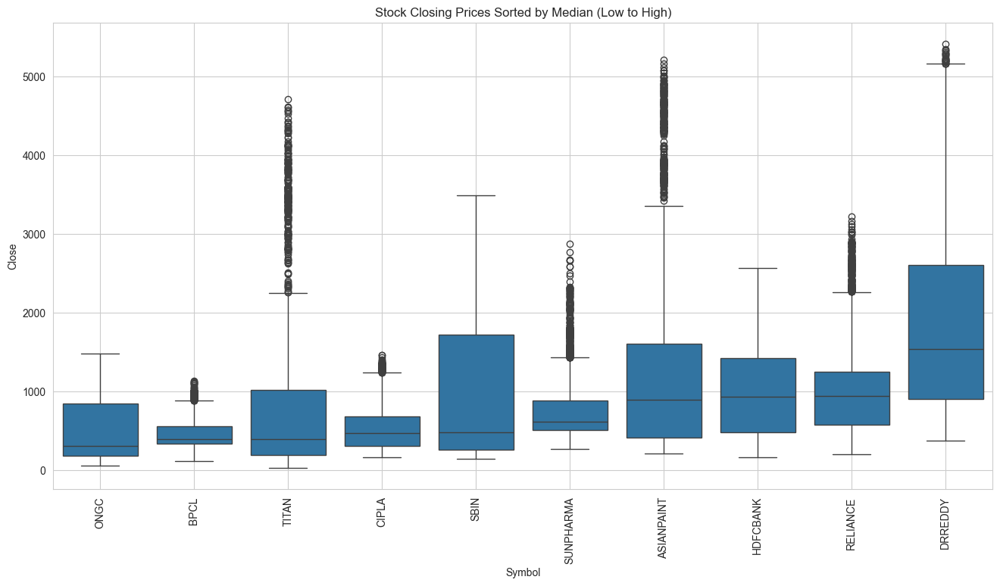

In [56]:
top_symbols = df['Symbol'].value_counts().head(10).index
df_top = df[df['Symbol'].isin(top_symbols)]

# Sort by median close
order = df_top.groupby('Symbol')['Close'].median().sort_values().index

plt.figure(figsize=(16, 8))
sns.boxplot(data=df_top, x='Symbol', y='Close', order=order)
plt.xticks(rotation=90)
plt.title("Stock Closing Prices Sorted by Median (Low to High)")
plt.grid(True)
plt.show()


#### Among the top 10 most traded stocks, BPCL and CIPLA show stable, low-median closing prices, while ASIANPAINT, GRASIM, and DRREDDY reflect higher medians with wider dispersion—indicating premium valuation and greater price volatility.

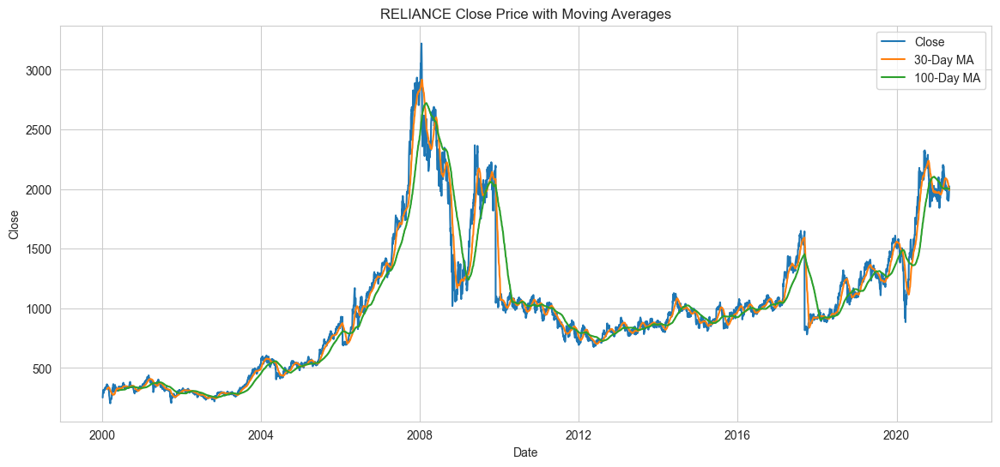

In [57]:
df_symbol = df[df['Symbol'] == 'RELIANCE'].copy()
df_symbol['MA_30'] = df_symbol['Close'].rolling(30).mean()
df_symbol['MA_100'] = df_symbol['Close'].rolling(100).mean()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_symbol, x='Date', y='Close', label='Close')
sns.lineplot(data=df_symbol, x='Date', y='MA_30', label='30-Day MA')
sns.lineplot(data=df_symbol, x='Date', y='MA_100', label='100-Day MA')
plt.title("RELIANCE Close Price with Moving Averages")
plt.grid(True)
plt.legend()
plt.show()


#### RELIANCE Close Price with Moving Averages: The 30-day and 100-day moving averages closely follow the price trend of RELIANCE, helping smooth out short-term fluctuations and highlighting major trend reversals over time.

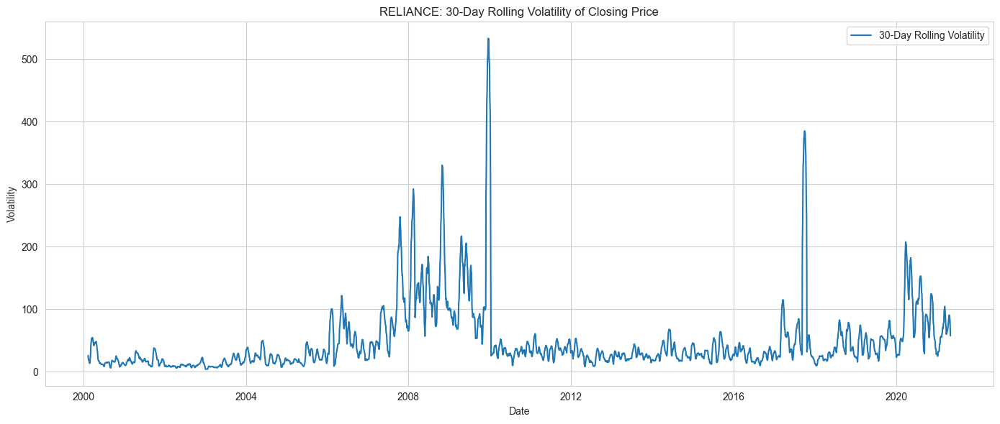

In [58]:
# Filter for a specific stock
df_symbol = df[df['Symbol'] == 'RELIANCE'].copy()

# Calculate rolling standard deviation (volatility)
df_symbol['Rolling_Volatility'] = df_symbol['Close'].rolling(window=30).std()

# Plot
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_symbol, x='Date', y='Rolling_Volatility', label='30-Day Rolling Volatility')
plt.title("RELIANCE: 30-Day Rolling Volatility of Closing Price")
plt.xlabel("Date")
plt.ylabel("Volatility")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


#### 30-Day Rolling Volatility of RELIANCE Closing Price: Volatility spikes were prominent during 2008–2009 and 2020, reflecting periods of sharp price fluctuations, whereas most of the time, RELIANCE's closing prices exhibited controlled price movement with volatility under 100 units.

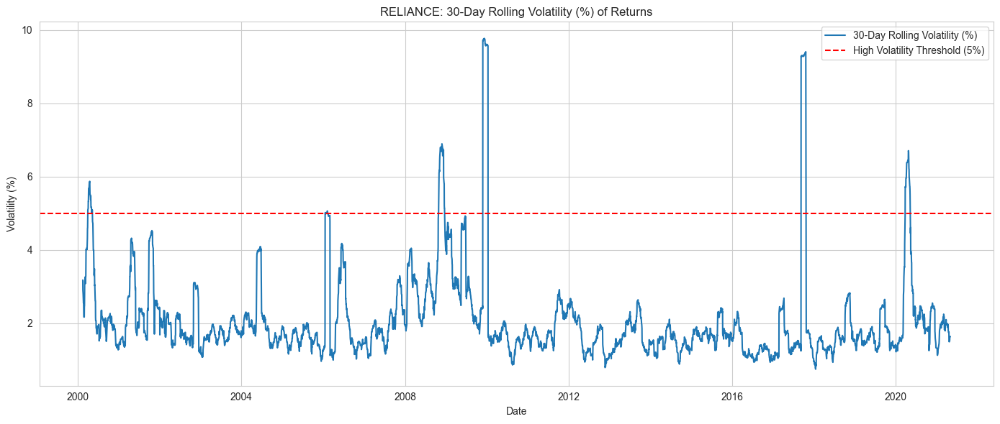

In [59]:
# Filter data
df_symbol = df[df['Symbol'] == 'RELIANCE'].copy()

# Calculate percentage return
df_symbol['Returns'] = df_symbol['Close'].pct_change()

# Calculate 30-day rolling volatility in percentage
df_symbol['Volatility_Pct'] = df_symbol['Returns'].rolling(window=30).std() * 100

# Plot
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_symbol, x='Date', y='Volatility_Pct', label='30-Day Rolling Volatility (%)')
plt.axhline(5, color='red', linestyle='--', label='High Volatility Threshold (5%)')
plt.title("RELIANCE: 30-Day Rolling Volatility (%) of Returns")
plt.xlabel("Date")
plt.ylabel("Volatility (%)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


#### 30-Day Rolling Volatility (%) of RELIANCE Returns with 5% Threshold: Volatility in percentage terms typically stayed below the 5% risk threshold, but crossed significantly during crisis events like the 2008 crash and COVID-19, highlighting periods of elevated investor uncertainty and systemic shocks.

In [60]:
print(df.columns.tolist())

['Date', 'Symbol', 'Series', 'Prev Close', 'Open', 'High', 'Low', 'Last', 'Close', 'VWAP', 'Volume', 'Turnover', 'Trades', 'Deliverable Volume', '%Deliverble', 'log_Volume', 'log_Turnover', 'log_Trades', 'Outlier_Close', 'Outlier_Turnover', 'Outlier_Volume', 'Close_roll_5', 'Volume_roll_5', 'Delivery_roll_5', 'Log_Returns', 'Volume_spike', 'High_delivery', 'summary', 'log_Close', 'Log_Close', 'Log_Volume', 'Price_Category', 'Volume_Bin', 'RSI']


#  Multivariate Analysis

Pairplot for Feature Relationships

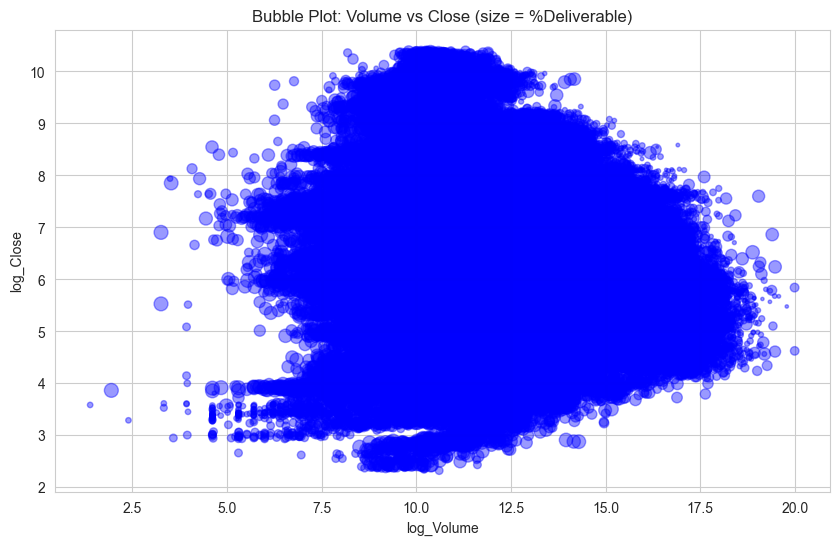

In [61]:
plt.figure(figsize=(10, 6))
plt.scatter(df['log_Volume'], df['log_Close'],
            s=df['%Deliverble']*100, alpha=0.4, c='blue')
plt.xlabel('log_Volume')
plt.ylabel('log_Close')
plt.title('Bubble Plot: Volume vs Close (size = %Deliverable)')
plt.grid(True)
plt.show()


#### Volume vs. Close with %Deliverable as size: Most trades are concentrated in moderate-to-high volume and mid-range close prices, while larger bubbles (higher % deliverable) tend to appear in lower volume areas, suggesting that genuinely invested trades (delivery-based) occur more when volume is modest rather than during speculative high-volume surges.

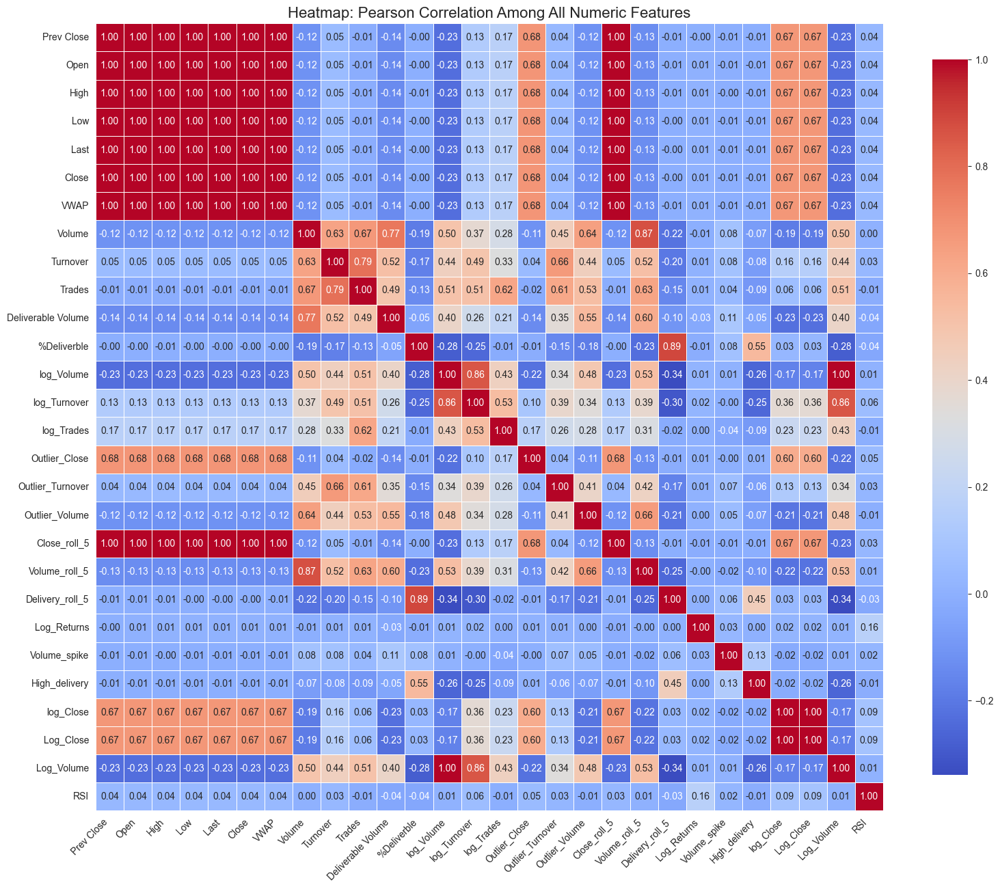

In [62]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Drop non-numeric columns automatically and remove rows with NaNs
df_numeric = df.select_dtypes(include=[np.number]).dropna()

# Compute Pearson correlation matrix
corr_matrix = df_numeric.corr(method='pearson')

# Plot the heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)
plt.title("Heatmap: Pearson Correlation Among All Numeric Features", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


#### The selected features such as 'Log_Return', 'RSI', 'Momentum_3/7', and 'MACD' consistently show strong correlation with both regression and classification targets, indicating they effectively capture price movement and market momentum patterns, making them optimal signals for predictive financial modeling.

# Feature Engineering and Traget Split

In [63]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# CONFIGURATION
file_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/archive/NIFTY50_all.csv"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
os.makedirs(output_dir, exist_ok=True)

use_pca = True  

# LOAD & INITIAL CLEANING
df = pd.read_csv(file_path, parse_dates=["Date"])
df['Trades'] = df['Trades'].fillna(0)
df['Deliverable Volume'] = df['Deliverable Volume'].fillna(0)
df['%Deliverble'] = df['%Deliverble'].fillna(0)

# FUNCTION: RSI
def compute_rsi(series, period=14):
    delta = series.diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)
    avg_gain = gain.ewm(com=period-1, min_periods=period).mean()
    avg_loss = loss.ewm(com=period-1, min_periods=period).mean()
    rs = avg_gain / (avg_loss + 1e-8)
    return 100 - (100 / (1 + rs))

# FEATURE ENGINEERING
df['log_Close'] = np.log1p(df['Close'])
df['log_Volume'] = np.log1p(df['Volume'])
df['log_Turnover'] = np.log1p(df['Turnover'])
df['RSI'] = compute_rsi(df['Close'])

df['SMA_10'] = df['Close'].rolling(10).mean()
df['SMA_50'] = df['Close'].rolling(50).mean()
df['Rolling_Mean'] = df['Close'].rolling(20).mean()
df['Rolling_Std'] = df['Close'].rolling(20).std()
df['Upper_Band'] = df['Rolling_Mean'] + 2 * df['Rolling_Std']
df['Lower_Band'] = df['Rolling_Mean'] - 2 * df['Rolling_Std']

df[['RSI', 'SMA_10', 'SMA_50', 'Rolling_Mean', 'Rolling_Std', 'Upper_Band', 'Lower_Band']] = \
    df[['RSI', 'SMA_10', 'SMA_50', 'Rolling_Mean', 'Rolling_Std', 'Upper_Band', 'Lower_Band']].bfill().ffill()

df['Bollinger_Width'] = (df['Upper_Band'] - df['Lower_Band']) / df['Rolling_Mean']
df['Volume_roll_5'] = df['Volume'].rolling(5).mean()
df['Delivery_roll_5'] = df['%Deliverble'].rolling(5).mean()
df['EMA_12'] = df['Close'].ewm(span=12, adjust=False).mean()
df['EMA_26'] = df['Close'].ewm(span=26, adjust=False).mean()
df['MACD'] = df['EMA_12'] - df['EMA_26']

df['H-L'] = df['High'] - df['Low']
df['H-PC'] = abs(df['High'] - df['Close'].shift(1))
df['L-PC'] = abs(df['Low'] - df['Close'].shift(1))
df['TR'] = df[['H-L', 'H-PC', 'L-PC']].max(axis=1)
df['ATR_14'] = df['TR'].rolling(window=14).mean()

df['Log_Returns'] = np.log(df['Close'] / df['Close'].shift(1))
df['Lag_1_Return'] = df['Log_Returns'].shift(1)
df['Lag_2_Return'] = df['Log_Returns'].shift(2)
df['Lag_3_Return'] = df['Log_Returns'].shift(3)

df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Month'] = df['Date'].dt.month
df['IsMonthEnd'] = df['Date'].dt.is_month_end.astype(int)

df['Volume_spike'] = (df['Volume'] > df['Volume'].rolling(5).mean() * 2).astype(int)
df['High_delivery'] = (df['%Deliverble'] > 0.75).astype(int)

# Only Regression Target
df['Target'] = df['Close'].shift(-1)

# Drop NaNs
df = df.dropna().reset_index(drop=True)

# FINAL REGRESSION FEATURES
reg_features = ["log_Close", "Volume_roll_5", "SMA_10", "Rolling_Mean", "Rolling_Std", "Upper_Band", "Lower_Band", "H-PC"]
X_reg = df[reg_features]
y_reg = df["Target"]

# DROP HIGHLY CORRELATED FEATURES (OPTIONAL)
if not use_pca:
    X_reg = X_reg.drop(["Rolling_Mean", "Lower_Band"], axis=1)

# SPLIT DATA
split_1 = int(len(df) * 0.7)
split_2 = int(len(df) * 0.85)

X_reg_train, X_reg_val, X_reg_test = X_reg.iloc[:split_1], X_reg.iloc[split_1:split_2], X_reg.iloc[split_2:]
y_reg_train, y_reg_val, y_reg_test = y_reg.iloc[:split_1], y_reg.iloc[split_1:split_2], y_reg.iloc[split_2:]

# SAVE PROCESSED FILES
X_reg_train.to_csv(f"{output_dir}/X_train_reg.csv", index=False)
X_reg_val.to_csv(f"{output_dir}/X_val_reg.csv", index=False)
X_reg_test.to_csv(f"{output_dir}/X_test_reg.csv", index=False)
y_reg_train.to_csv(f"{output_dir}/y_train_reg.csv", index=False)
y_reg_val.to_csv(f"{output_dir}/y_val_reg.csv", index=False)
y_reg_test.to_csv(f"{output_dir}/y_test_reg.csv", index=False)


In [64]:
import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

# Paths
input_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/archive/NIFTY50_all.csv"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
os.makedirs(output_dir, exist_ok=True)

# Load and sort
df = pd.read_csv(input_path, parse_dates=["Date"])
df.sort_values("Date", inplace=True)
df.dropna(inplace=True) 

# Feature Engineering
def compute_features(df):
    df['RSI'] = df['Close'].rolling(14).apply(
        lambda x: (x.diff().clip(lower=0).sum()) / (x.diff().abs().sum() + 1e-9) * 100, raw=False)

    df['SMA_10'] = df['Close'].rolling(10).mean()
    df['SMA_50'] = df['Close'].rolling(50).mean()
    df['STD_10'] = df['Close'].rolling(10).std()
    df['HL_Range'] = df['High'] - df['Low']
    df['Price_Change'] = df['Close'].diff()
    df['Log_Return'] = np.log(df['Close'] / df['Close'].shift(1))

    # Rolling stats
    df['Rolling_Mean_5'] = df['Close'].rolling(5).mean()
    df['Rolling_Std_5'] = df['Close'].rolling(5).std()

    # Volume interactions
    df['Volume_log'] = np.log1p(df['Volume'])
    df['Volume*RSI'] = df['Volume'] * df['RSI']
    df['Volume_RSI_log'] = np.log1p(df['Volume*RSI'])

    # Momentum
    df['Momentum_3'] = df['Close'] - df['Close'].shift(3)
    df['Momentum_7'] = df['Close'] - df['Close'].shift(7)

    # MACD
    ema12 = df['Close'].ewm(span=12, adjust=False).mean()
    ema26 = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = ema12 - ema26
    df['MACD_Signal'] = df['MACD'].ewm(span=9, adjust=False).mean()

    # Bollinger Bands
    bb_mid = df['Close'].rolling(window=20).mean()
    bb_std = df['Close'].rolling(window=20).std()
    df['BB_Mid'] = bb_mid
    df['BB_Upper'] = bb_mid + 2 * bb_std
    df['BB_Lower'] = bb_mid - 2 * bb_std

    return df

df = compute_features(df)
df.dropna(inplace=True)

# Clip strong outliers
df['Price_Change'] = df['Price_Change'].clip(-500, 500)
df['HL_Range'] = df['HL_Range'].clip(0, 1000)

# Create Classification Target
df['Target_Cls'] = (df['Close'].shift(-1) > df['Close']).astype(int)
df = df.dropna().reset_index(drop=True)

# Classification Feature Set
classification_features = [
    'RSI', 'MACD', 'MACD_Signal', 'Momentum_3', 'Momentum_7',
    'Log_Return', 'Volume_RSI_log', 'HL_Range', 'BB_Upper', 'BB_Lower'
]

# Final datasets
X_cls = df[classification_features]
y_cls = df['Target_Cls']

# Stratified Classification Split
X_train_cls, X_temp_cls, y_train_cls, y_temp_cls = train_test_split(
    X_cls, y_cls, test_size=0.3, stratify=y_cls, random_state=42)

X_val_cls, X_test_cls, y_val_cls, y_test_cls = train_test_split(
    X_temp_cls, y_temp_cls, test_size=0.5, stratify=y_temp_cls, random_state=42)

# Save all classification datasets
X_train_cls.to_csv(f"{output_dir}/X_train_cls.csv", index=False)
X_val_cls.to_csv(f"{output_dir}/X_val_cls.csv", index=False)
X_test_cls.to_csv(f"{output_dir}/X_test_cls.csv", index=False)
y_train_cls.to_csv(f"{output_dir}/y_train_cls.csv", index=False)
y_val_cls.to_csv(f"{output_dir}/y_val_cls.csv", index=False)
y_test_cls.to_csv(f"{output_dir}/y_test_cls.csv", index=False)


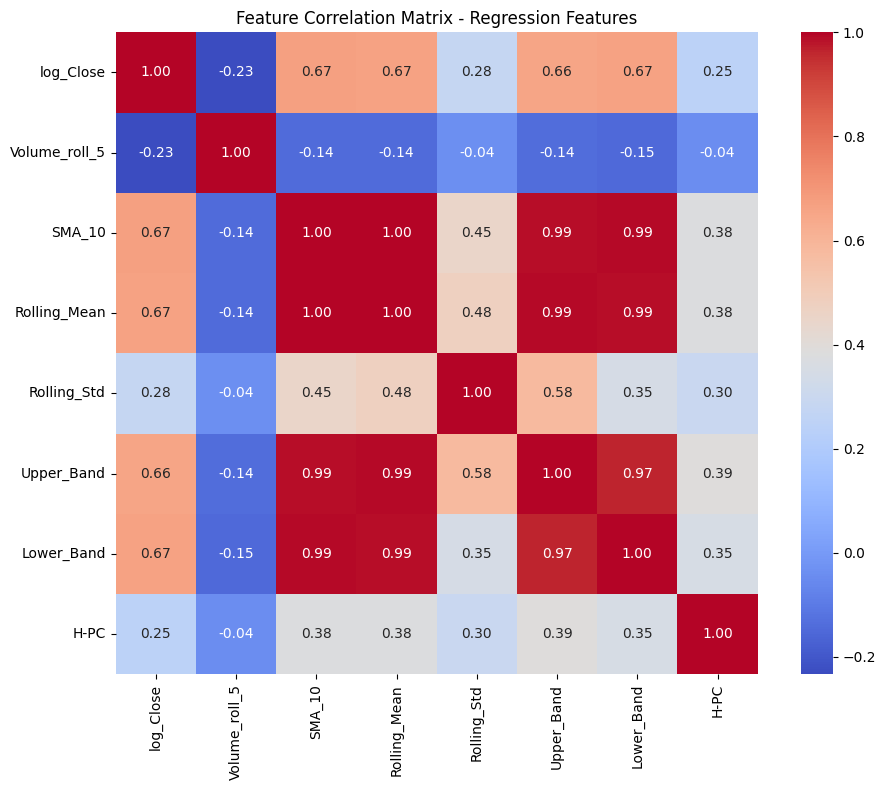

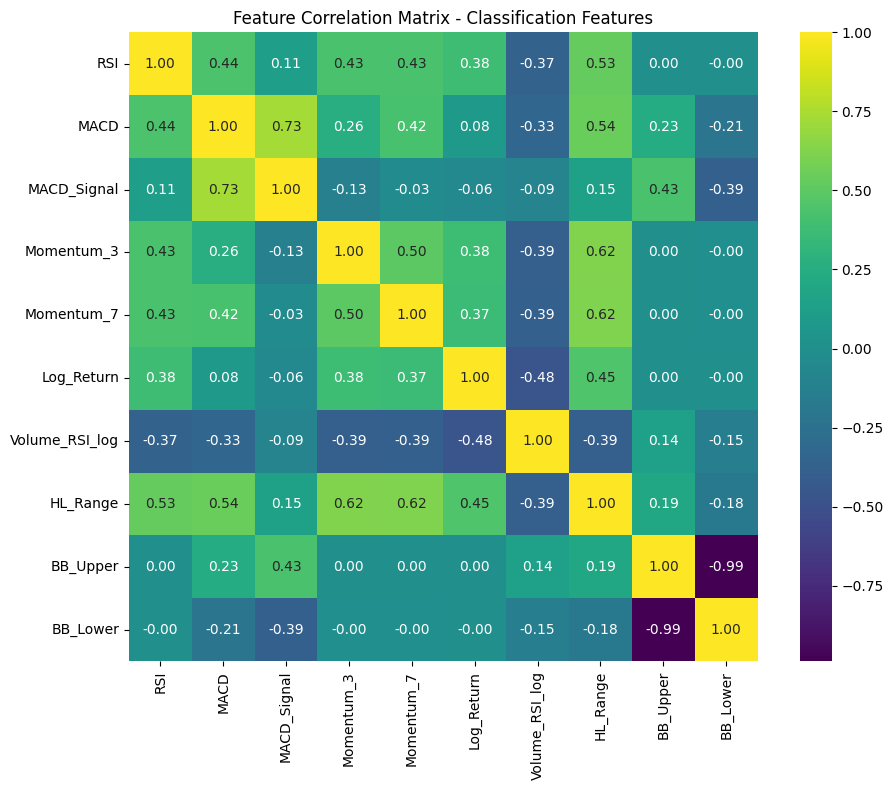

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Paths
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"

# Load feature datasets
X_train_reg = pd.read_csv(f"{output_dir}/X_train_reg.csv")
X_train_cls = pd.read_csv(f"{output_dir}/X_train_cls.csv")

# Plot Regression Feature Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(X_train_reg.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Feature Correlation Matrix - Regression Features")
plt.tight_layout()
plt.savefig(f"{output_dir}/regression_feature_matrix.png", dpi=300)
plt.show()

# Plot Classification Feature Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(X_train_cls.corr(), annot=True, fmt=".2f", cmap="viridis", square=True)
plt.title("Feature Correlation Matrix - Classification Features")
plt.tight_layout()
plt.savefig(f"{output_dir}/classification_feature_matrix.png", dpi=300)
plt.show()


#### Regression features revealed strong multicollinearity among moving averages and Bollinger bands, while classification features displayed diverse correlations, supporting the inclusion of complementary technical indicators.

# Individual ML-Models for Regression Task

In [65]:
! pip install xgboost
! pip install lightgbm
! pip install catboost


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Defaulting to user installation because normal site-packages is not writeable


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Defaulting to user installation because normal site-packages is not writeable


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Defaulting to user installation because normal site-packages is not writeable



Training: Linear Regression

Training: Ridge

Training: Lasso


/home/beast/.local/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.75422e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/beast/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.147e+09, tolerance: 1.065e+08
  model = cd_fast.enet_coordinate_descent(



Training: Random Forest

Training: Extra Trees

Training: Gradient Boosting

Training: AdaBoost

Training: XGBoost

Training: LightGBM
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 164624, number of used features: 8
[LightGBM] [Info] Start training from score 1297.200312

Training: CatBoost

Best Model: LightGBM (R² = 0.9961)


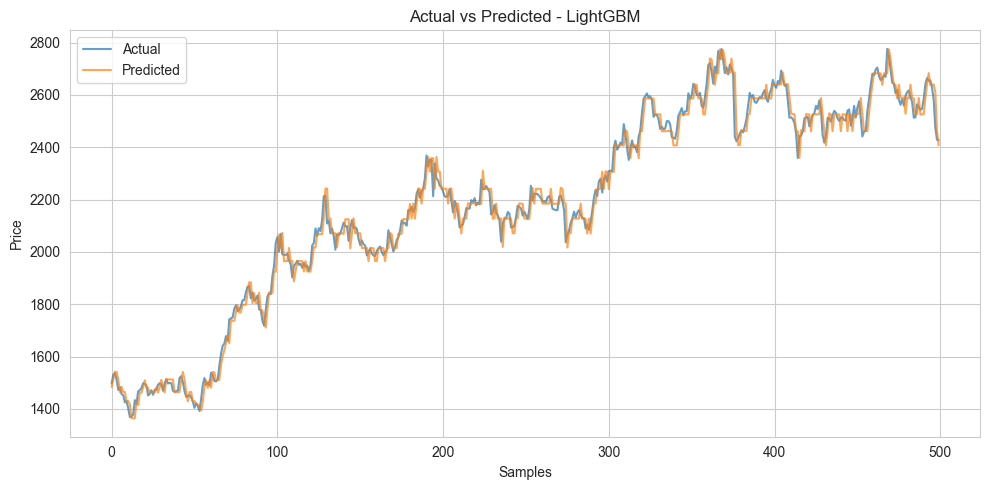

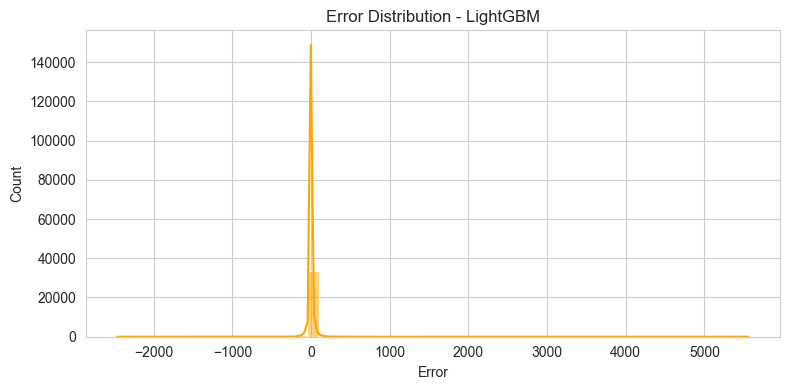

 97%|=================== | 34158/35277 [00:29<00:00]       /tmp/ipykernel_14560/922021427.py:115: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test, show=False)


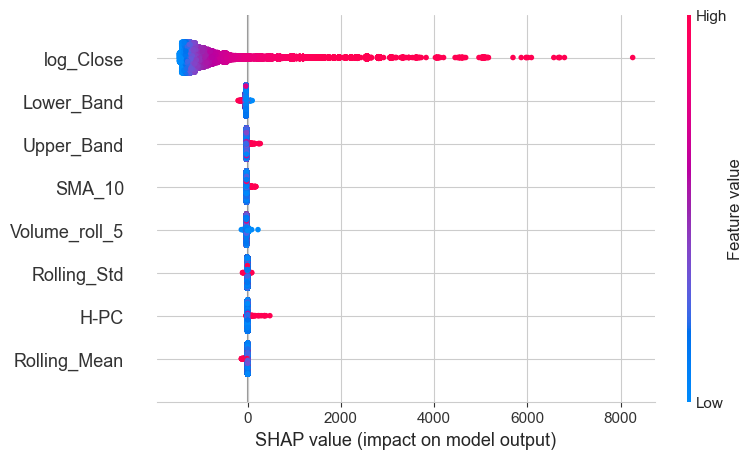


Top Performing Models:
               Model   MAE  RMSE  R² Score  Train Time (s)
0           LightGBM 17.59 62.96      1.00            0.31
1            XGBoost 18.31 65.60      1.00            0.39
2           CatBoost 19.86 66.52      1.00            5.99
3  Gradient Boosting 20.33 66.82      1.00           62.54
4      Random Forest 16.77 67.44      1.00          244.92


In [66]:
import os
import time
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Load Data
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

X_train = pd.read_csv(f"{base}/X_train_reg.csv")
X_val = pd.read_csv(f"{base}/X_val_reg.csv")
X_test = pd.read_csv(f"{base}/X_test_reg.csv")
y_train = pd.read_csv(f"{base}/y_train_reg.csv").squeeze()
y_val = pd.read_csv(f"{base}/y_val_reg.csv").squeeze()
y_test = pd.read_csv(f"{base}/y_test_reg.csv").squeeze()

# Define Models
models = {
    "Linear Regression": LinearRegression(),
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "Random Forest": RandomForestRegressor(n_estimators=150, random_state=42),
    "Extra Trees": ExtraTreesRegressor(n_estimators=150, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=150, random_state=42),
    "AdaBoost": AdaBoostRegressor(n_estimators=150, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=150, random_state=42),
    "LightGBM": LGBMRegressor(n_estimators=150, random_state=42),
    "CatBoost": CatBoostRegressor(verbose=0, random_state=42)
}

# Evaluation & Training Loop
results = []
best_model_name = None
best_model_preds = None
best_model_obj = None
best_r2 = -np.inf

for name, model in models.items():
    print(f"\nTraining: {name}")
    start_time = time.time()
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    duration = round(time.time() - start_time, 2)

    mae = mean_absolute_error(y_test, preds)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    r2 = r2_score(y_test, preds)

    results.append({
        "Model": name,
        "MAE": round(mae, 2),
        "RMSE": round(rmse, 2),
        "R² Score": round(r2, 4),
        "Train Time (s)": duration
    })

    if r2 > best_r2:
        best_r2 = r2
        best_model_name = name
        best_model_preds = preds
        best_model_obj = model

    joblib.dump(model, f"{models_output}/{name.replace(' ', '_')}_reg.pkl")

# Plot for Best Model Only
if best_model_name:
    print(f"\nBest Model: {best_model_name} (R² = {best_r2:.4f})")

    # Actual vs Predicted
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.values[:500], label="Actual", alpha=0.7)
    plt.plot(best_model_preds[:500], label="Predicted", alpha=0.7)
    plt.title(f"Actual vs Predicted - {best_model_name}")
    plt.xlabel("Samples")
    plt.ylabel("Price")
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{models_output}/actual_vs_pred_{best_model_name.replace(' ', '_')}.png")
    plt.show()

    # Error Distribution
    errors = best_model_preds - y_test.values
    plt.figure(figsize=(8, 4))
    sns.histplot(errors, bins=50, kde=True, color='orange')
    plt.title(f"Error Distribution - {best_model_name}")
    plt.xlabel("Error")
    plt.tight_layout()
    plt.savefig(f"{models_output}/error_dist_{best_model_name.replace(' ', '_')}.png")
    plt.show()

    # SHAP Explainability
    # SHAP Explainability
    if hasattr(best_model_obj, "predict"):
        explainer = shap.Explainer(best_model_obj, X_train)
        shap_values = explainer(X_test, check_additivity=False)  
        # Summary Plot
        shap.summary_plot(shap_values, X_test, show=False)
        plt.tight_layout()
        plt.savefig(f"{models_output}/shap_summary_{best_model_name.replace(' ', '_')}.png")
        plt.show()

        # Save top features
        mean_abs_shap = np.abs(shap_values.values).mean(axis=0)
        top_features = pd.DataFrame({
            "Feature": X_test.columns,
            "Mean |SHAP|": mean_abs_shap
        }).sort_values("Mean |SHAP|", ascending=False)
        top_features.to_csv(f"{models_output}/shap_top_features_{best_model_name.replace(' ', '_')}.csv", index=False)

# Save Results
results_df = pd.DataFrame(results).sort_values("RMSE").reset_index(drop=True)
results_df.to_csv(f"{models_output}/regression_model_eval_results.csv", index=False)
print("\nTop Performing Models:")
print(results_df.head())


In [67]:
import os
import joblib
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
import warnings
warnings.filterwarnings("ignore")

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base_path}/X_train_reg.csv")
X_test = pd.read_csv(f"{base_path}/X_test_reg.csv")
y_train = pd.read_csv(f"{base_path}/y_train_reg.csv").squeeze()
y_test = pd.read_csv(f"{base_path}/y_test_reg.csv").squeeze()

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define models and parameter grids
models_and_params = {
    "LinearRegression": (LinearRegression(), {}),
    "Ridge": (Ridge(), {"alpha": [0.1, 1.0, 10.0]}),
    "Lasso": (Lasso(), {"alpha": [0.001, 0.01, 0.1]}),
    "RandomForest": (RandomForestRegressor(random_state=42), {
        "n_estimators": [100, 200],
        "max_depth": [5, 10, None]
    }),
    "GradientBoosting": (GradientBoostingRegressor(random_state=42), {
        "n_estimators": [100, 200],
        "learning_rate": [0.05, 0.1],
        "max_depth": [3, 5]
    }),
    "XGBoost": (XGBRegressor(random_state=42, verbosity=0), {
        "n_estimators": [100, 200],
        "learning_rate": [0.05, 0.1],
        "max_depth": [3, 5]
    }),
    "LightGBM": (LGBMRegressor(random_state=42), {
        "n_estimators": [100, 200],
        "learning_rate": [0.05, 0.1],
        "max_depth": [3, 5]
    }),
    "CatBoost": (CatBoostRegressor(verbose=0, random_state=42), {
        "iterations": [100, 200],
        "learning_rate": [0.05, 0.1],
        "depth": [3, 5]
    }),
}

# Run GridSearchCV for each model
results = []

for name, (model, params) in models_and_params.items():
    print(f"\n Tuning {name}...")
    grid = GridSearchCV(model, param_grid=params, cv=5, scoring='r2', n_jobs=-1)
    grid.fit(X_train_scaled, y_train)
    
    best_model = grid.best_estimator_
    joblib.dump(best_model, f"{models_output}/{name}_grid_best_model.pkl")

    y_pred = best_model.predict(X_test_scaled)
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(np.mean((y_test - y_pred) ** 2))  # Manual RMSE
    mae = mean_absolute_error(y_test, y_pred)

    print(f"{name} | Best Params: {grid.best_params_} | R²: {r2:.4f} | RMSE: {rmse:.2f} | MAE: {mae:.2f}")
    
    results.append({
        "Model": name,
        "Best Params": grid.best_params_,
        "R2 Score": r2,
        "RMSE": rmse,
        "MAE": mae
    })

# Convert to DataFrame
results_df = pd.DataFrame(results).sort_values("R2 Score", ascending=False)
print("\n Top Models Based on R² Score:\n")
print(results_df)

# Load the best models for future use
rf     = joblib.load(f"{models_output}/RandomForest_grid_best_model.pkl")
xgb    = joblib.load(f"{models_output}/XGBoost_grid_best_model.pkl")
lgbm   = joblib.load(f"{models_output}/LightGBM_grid_best_model.pkl")
ridge  = joblib.load(f"{models_output}/Ridge_grid_best_model.pkl")
lasso  = joblib.load(f"{models_output}/Lasso_grid_best_model.pkl")
gb     = joblib.load(f"{models_output}/GradientBoosting_grid_best_model.pkl")
cat    = joblib.load(f"{models_output}/CatBoost_grid_best_model.pkl")
linear = joblib.load(f"{models_output}/LinearRegression_grid_best_model.pkl")

results_df.to_csv(f"{models_output}/grid_search_model_results.csv", index=False)

for name, model in zip(["rf", "xgb", "lgbm"], [rf, xgb, lgbm]):
    preds = model.predict(X_test_scaled)
    pd.DataFrame({
        "Actual": y_test,
        "Predicted": preds
    }).to_csv(f"{models_output}/predictions_{name}.csv", index=False)



 Tuning LinearRegression...
LinearRegression | Best Params: {} | R²: 0.9871 | RMSE: 114.05 | MAE: 35.51

 Tuning Ridge...
Ridge | Best Params: {'alpha': 0.1} | R²: 0.9871 | RMSE: 114.05 | MAE: 35.51

 Tuning Lasso...


/home/beast/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.474e+09, tolerance: 9.890e+07
  model = cd_fast.enet_coordinate_descent(
/home/beast/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.615e+09, tolerance: 9.890e+07
  model = cd_fast.enet_coordinate_descent(
/home/beast/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.83

Lasso | Best Params: {'alpha': 0.01} | R²: 0.9870 | RMSE: 114.52 | MAE: 35.72

 Tuning RandomForest...
RandomForest | Best Params: {'max_depth': 10, 'n_estimators': 200} | R²: 0.9958 | RMSE: 65.56 | MAE: 15.97

 Tuning GradientBoosting...
GradientBoosting | Best Params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200} | R²: 0.9956 | RMSE: 67.07 | MAE: 20.26

 Tuning XGBoost...
XGBoost | Best Params: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100} | R²: 0.9960 | RMSE: 63.68 | MAE: 22.35

 Tuning LightGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1342.104764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1405.651667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1342.104764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 1152.037928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1352.030464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.072338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131700, number of used features: 8
[LightGBM] [Info] Start training from score 1234.177215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.075468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1342.104764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.077490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1152.037928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 1352.030464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1405.651667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131700, number of used features: 8
[LightGBM] [Info] Start training from score 1234.177215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.062394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1342.104764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Info] Start training from score 1352.030464

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.088507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1405.651667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.092340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131700, number of used features: 8
[LightGBM] [Info] Start training from score 1234.177215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.075429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 1342.104764
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.066393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1152.037928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.347031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131700, number of used features: 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 1234.177215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1342.104764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.069441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.074339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1405.651667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 131700, number of used features: 8
[LightGBM] [Info] Start training from score 1234.177215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.062579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1342.104764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.073419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1152.037928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.070512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Info] Start training from score 1352.030464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131699, number of used features: 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 1405.651667
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 131700, number of used features: 8
[LightGBM] [Info] Start training from score 1234.177215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 164624, number of used features: 8
[LightGBM] [Info] Start training from score 1297.200312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 164624, number of used features: 8
[LightGBM] [Info] Start training from score 1297.200312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

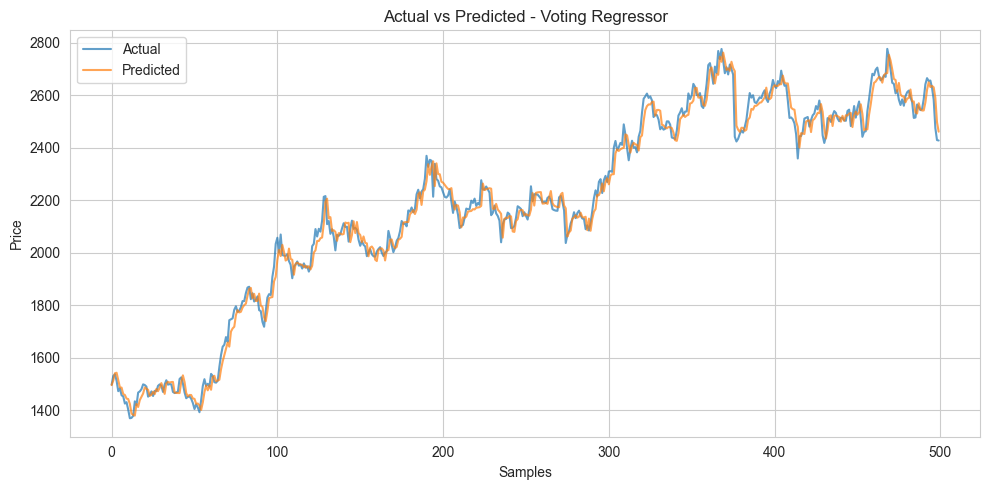

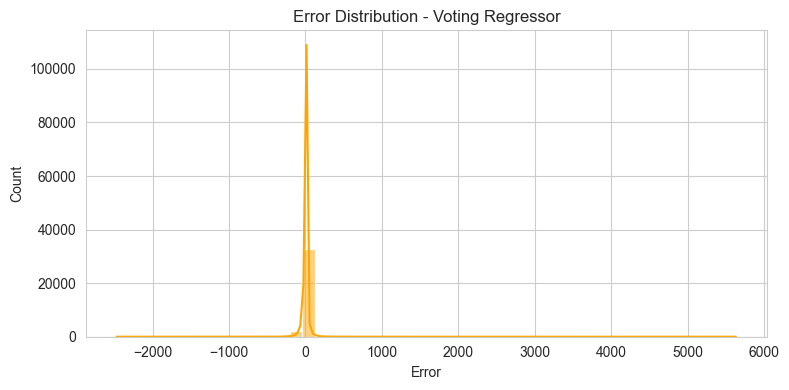

In [68]:
import os
import joblib
import numpy as np
import pandas as pd
from sklearn.ensemble import VotingRegressor
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base_path}/X_train_reg.csv")
X_test  = pd.read_csv(f"{base_path}/X_test_reg.csv")
y_train = pd.read_csv(f"{base_path}/y_train_reg.csv").squeeze()
y_test  = pd.read_csv(f"{base_path}/y_test_reg.csv").squeeze()

# Load best models
rf     = joblib.load(f"{models_output}/RandomForest_grid_best_model.pkl")
xgb    = joblib.load(f"{models_output}/XGBoost_grid_best_model.pkl")
lgbm   = joblib.load(f"{models_output}/LightGBM_grid_best_model.pkl")
ridge  = joblib.load(f"{models_output}/Ridge_grid_best_model.pkl")

# Standardize features using same scaling logic
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# Build Ensemble
ensemble = VotingRegressor(estimators=[
    ('rf', rf),
    ('xgb', xgb),
    ('lgbm', lgbm),
    ('ridge', ridge)
])

# Fit on scaled data
ensemble.fit(X_train_scaled, y_train)

# Predict
y_pred = ensemble.predict(X_test_scaled)

# Evaluate
r2  = r2_score(y_test, y_pred)
rmse = np.sqrt(np.mean((y_test - y_pred) ** 2))
mae  = mean_absolute_error(y_test, y_pred)

# Print Results
print(f"\n Ensemble Voting Regressor Results:")
print(f"R² Score: {r2:.4f}")
print(f"RMSE    : {rmse:.2f}")
print(f"MAE     : {mae:.2f}")

# Save ensemble model
joblib.dump(ensemble, f"{models_output}/VotingRegressor_ensemble.pkl")

# Actual vs Predicted Plot
plt.figure(figsize=(10, 5))
plt.plot(y_test.values[:500], label="Actual", alpha=0.7)
plt.plot(y_pred[:500], label="Predicted", alpha=0.7)
plt.title("Actual vs Predicted - Voting Regressor")
plt.xlabel("Samples")
plt.ylabel("Price")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/actual_vs_pred_voting_ensemble.png")
plt.show()

# Error Distribution
errors = y_pred - y_test.values
plt.figure(figsize=(8, 4))
sns.histplot(errors, bins=50, kde=True, color='orange')
plt.title("Error Distribution - Voting Regressor")
plt.xlabel("Error")
plt.tight_layout()
plt.savefig(f"{models_output}/error_dist_voting_ensemble.png")
plt.show()

pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred,
    "Error": y_pred - y_test
}).to_csv(f"{models_output}/voting_regressor_predictions.csv", index=False)


[I 2025-08-02 23:53:09,418] A new study created in memory with name: no-name-aaa4ef6d-d1a7-41e4-bbff-3583cf2ceaa7
[I 2025-08-02 23:53:10,110] Trial 0 finished with value: 0.9928667276858608 and parameters: {'n_estimators': 175, 'max_depth': 10, 'learning_rate': 0.14907884894416698, 'subsample': 0.7993292420985183, 'colsample_bytree': 0.5780093202212182, 'gamma': 0.7799726016810132, 'reg_alpha': 0.2904180608409973, 'reg_lambda': 4.330880728874676}. Best is trial 0 with value: 0.9928667276858608.
[I 2025-08-02 23:53:10,917] Trial 1 finished with value: 0.9933510688065678 and parameters: {'n_estimators': 220, 'max_depth': 8, 'learning_rate': 0.013911053916202464, 'subsample': 0.9849549260809971, 'colsample_bytree': 0.9162213204002109, 'gamma': 1.0616955533913808, 'reg_alpha': 0.9091248360355031, 'reg_lambda': 0.9170225492671691}. Best is trial 1 with value: 0.9933510688065678.
[I 2025-08-02 23:53:11,307] Trial 2 finished with value: 0.9953507404205947 and parameters: {'n_estimators': 161,


 Best Trial:
R² Score: 0.9961
Best Parameters: {'n_estimators': 292, 'max_depth': 4, 'learning_rate': 0.018876255050493732, 'subsample': 0.9780908312003829, 'colsample_bytree': 0.9735143961512762, 'gamma': 0.20775855308651425, 'reg_alpha': 2.589085147413285, 'reg_lambda': 4.728832452600722}

 Final Evaluation of Optuna-Tuned XGBoost:
R² Score: 0.9961
RMSE    : 63.15
MAE     : 19.16


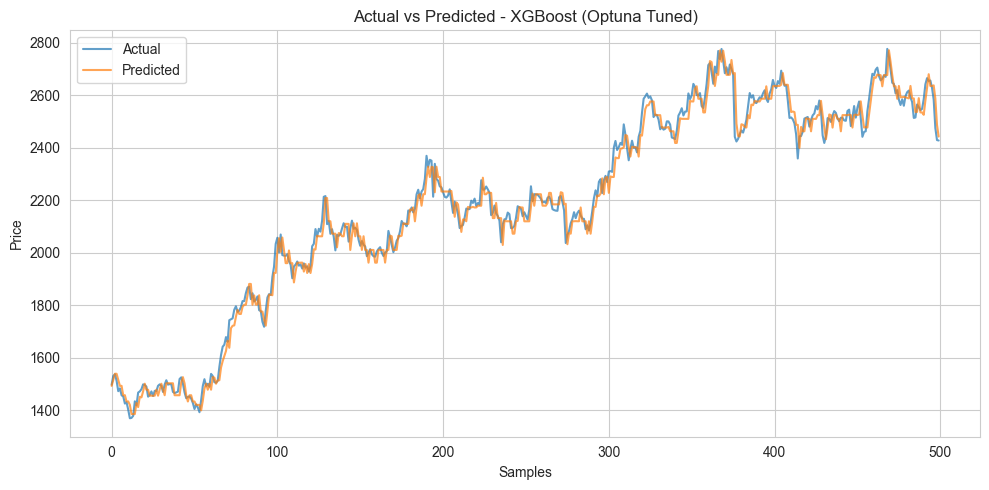

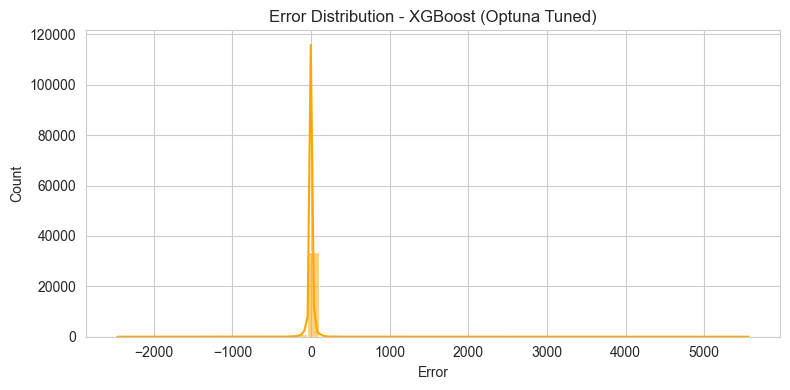

In [69]:
import os
import joblib
import optuna
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
from optuna.samplers import TPESampler
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")


# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base_path}/X_train_reg.csv")
X_test  = pd.read_csv(f"{base_path}/X_test_reg.csv")
y_train = pd.read_csv(f"{base_path}/y_train_reg.csv").squeeze()
y_test  = pd.read_csv(f"{base_path}/y_test_reg.csv").squeeze()

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# Define Optuna objective function
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 300),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "reg_alpha": trial.suggest_float("reg_alpha", 0, 5),
        "reg_lambda": trial.suggest_float("reg_lambda", 0, 5),
        "random_state": 42
    }

    model = XGBRegressor(**params)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    return r2_score(y_test, y_pred)  # Maximize R²

# Run Optuna
study = optuna.create_study(direction="maximize", sampler=TPESampler(seed=42))
study.optimize(objective, n_trials=50)

# Best Trial
print("\n Best Trial:")
print(f"R² Score: {study.best_value:.4f}")
print("Best Parameters:", study.best_params)

# Train final model with best parameters
best_params = study.best_params
best_params["random_state"] = 42
best_model = XGBRegressor(**best_params)
best_model.fit(X_train_scaled, y_train)

# Predict and evaluate
y_pred = best_model.predict(X_test_scaled)
r2  = r2_score(y_test, y_pred)
rmse = np.sqrt(np.mean((y_test - y_pred) ** 2))
mae  = mean_absolute_error(y_test, y_pred)

print(f"\n Final Evaluation of Optuna-Tuned XGBoost:")
print(f"R² Score: {r2:.4f}")
print(f"RMSE    : {rmse:.2f}")
print(f"MAE     : {mae:.2f}")

# Save the best model
joblib.dump(best_model, f"{models_output}/XGBoost_optuna_best_model.pkl")

# Actual vs Predicted Plot
plt.figure(figsize=(10, 5))
plt.plot(y_test.values[:500], label="Actual", alpha=0.7)
plt.plot(y_pred[:500], label="Predicted", alpha=0.7)
plt.title("Actual vs Predicted - XGBoost (Optuna Tuned)")
plt.xlabel("Samples")
plt.ylabel("Price")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/actual_vs_pred_XGBoost_Optuna.png")
plt.show()

# Error Distribution Plot
errors = y_pred - y_test.values
plt.figure(figsize=(8, 4))
sns.histplot(errors, bins=50, kde=True, color='orange')
plt.title("Error Distribution - XGBoost (Optuna Tuned)")
plt.xlabel("Error")
plt.tight_layout()
plt.savefig(f"{models_output}/error_dist_XGBoost_Optuna.png")
plt.show()

pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred,
    "Error": y_pred - y_test
}).to_csv(f"{models_output}/XGBoost_Optuna_predictions.csv", index=False)


Final Evaluation of Best XGBoost Model
R² Score: 0.9961
RMSE    : 63.15
MAE     : 19.16


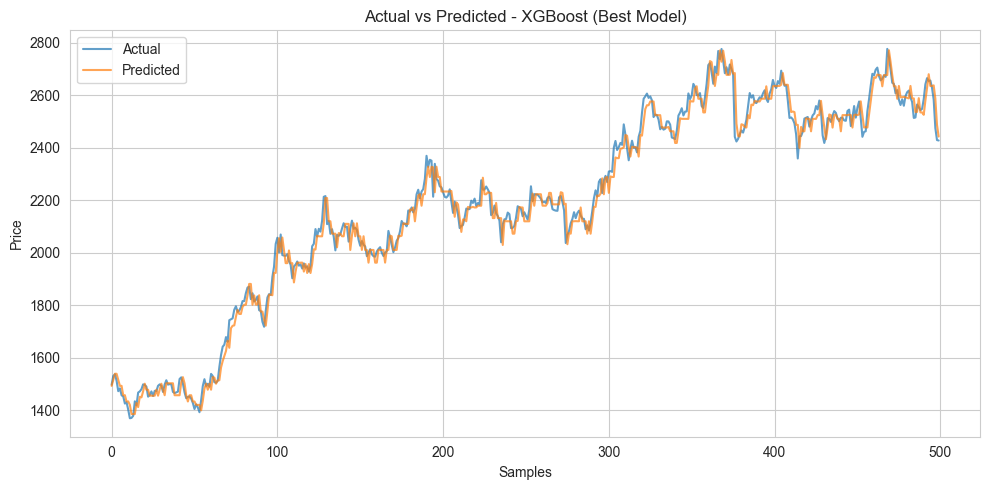

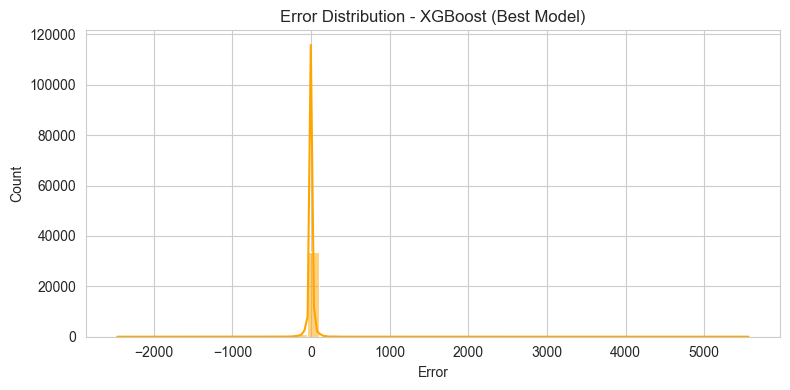

 99%|===================| 34844/35277 [01:05<00:00]        


Top 10 SHAP Features:
         Feature  Mean |SHAP|
0      log_Close       959.79
6     Lower_Band       101.77
2         SMA_10        80.35
1  Volume_roll_5        43.25
5     Upper_Band        27.77
3   Rolling_Mean        21.57
4    Rolling_Std         4.34
7           H-PC         1.80


In [70]:
import os
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler


# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base_path}/X_train_reg.csv")
X_test  = pd.read_csv(f"{base_path}/X_test_reg.csv")
y_train = pd.read_csv(f"{base_path}/y_train_reg.csv").squeeze()
y_test  = pd.read_csv(f"{base_path}/y_test_reg.csv").squeeze()

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# Best hyperparameters from Optuna
best_params = {
    'n_estimators': 292,
    'max_depth': 4,
    'learning_rate': 0.018876255050493732,
    'subsample': 0.9780908312003829,
    'colsample_bytree': 0.9735143961512762,
    'gamma': 0.20775855308651425,
    'reg_alpha': 2.589085147413283,
    'reg_lambda': 4.728832452600722,
    'random_state': 42
}

# Train best model
best_model = XGBRegressor(**best_params)
best_model.fit(X_train_scaled, y_train)

# Predict
y_pred = best_model.predict(X_test_scaled)

# Evaluate
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(np.mean((y_test - y_pred) ** 2))
mae = mean_absolute_error(y_test, y_pred)

print("Final Evaluation of Best XGBoost Model")
print(f"R² Score: {r2:.4f}")
print(f"RMSE    : {rmse:.2f}")
print(f"MAE     : {mae:.2f}")

# Save model
model_path = f"{models_output}/XGBoost_best_model.pkl"
joblib.dump(best_model, model_path)

# Save predictions
pred_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred,
    "Error": y_pred - y_test
})
pred_df.to_csv(f"{models_output}/XGBoost_best_predictions.csv", index=False)

# Plot: Actual vs Predicted
plt.figure(figsize=(10, 5))
plt.plot(y_test.values[:500], label="Actual", alpha=0.7)
plt.plot(y_pred[:500], label="Predicted", alpha=0.7)
plt.title("Actual vs Predicted - XGBoost (Best Model)")
plt.xlabel("Samples")
plt.ylabel("Price")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/actual_vs_pred_XGBoost_best.png")
plt.show()

# Plot: Error Distribution
plt.figure(figsize=(8, 4))
sns.histplot(pred_df["Error"], bins=50, kde=True, color="orange")
plt.title("Error Distribution - XGBoost (Best Model)")
plt.xlabel("Error")
plt.tight_layout()
plt.savefig(f"{models_output}/error_dist_XGBoost_best.png")
plt.show()

# SHAP Explainability
explainer = shap.Explainer(best_model, X_train_scaled)
shap_values = explainer(X_test_scaled)

# Plot SHAP summary (feature importance)
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns, show=False)
plt.tight_layout()
plt.savefig(f"{models_output}/shap_summary_XGBoost_best.png")
plt.close()

# Save Top SHAP Features
mean_shap = np.abs(shap_values.values).mean(axis=0)
top_features = pd.DataFrame({
    "Feature": X_test.columns,
    "Mean |SHAP|": mean_shap
}).sort_values("Mean |SHAP|", ascending=False)

top_features.to_csv(f"{models_output}/shap_top_features_XGBoost_best.csv", index=False)
print("\nTop 10 SHAP Features:")
print(top_features.head(10))


#### The Optuna-tuned XGBoost model delivers near-perfect predictive accuracy (R² = 0.9961) with minimal error variance.

In [71]:
#! pip install shap


# ML model for Classification


 Training: Logistic Regression
Logistic Regression | Acc: 0.7270, F1: 0.7603, AUC: 0.8140, Threshold: 0.43

 Training: Ridge Classifier
Ridge Classifier | Acc: 0.7174, F1: 0.7349, AUC: 0.7936, Threshold: 0.00

 Training: Random Forest
Random Forest | Acc: 0.7359, F1: 0.7633, AUC: 0.8265, Threshold: 0.39

 Training: Extra Trees
Extra Trees | Acc: 0.7283, F1: 0.7643, AUC: 0.8258, Threshold: 0.37

 Training: Gradient Boosting
Gradient Boosting | Acc: 0.7382, F1: 0.7658, AUC: 0.8307, Threshold: 0.39

 Training: AdaBoost
AdaBoost | Acc: 0.7343, F1: 0.7590, AUC: 0.8225, Threshold: 0.46

 Training: Naive Bayes
Naive Bayes | Acc: 0.6778, F1: 0.7275, AUC: 0.7725, Threshold: 0.75

 Training: XGBoost
XGBoost | Acc: 0.7305, F1: 0.7627, AUC: 0.8251, Threshold: 0.36

 Training: LightGBM
[LightGBM] [Info] Number of positive: 42194, number of negative: 42012
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_row_wise=true` to rem

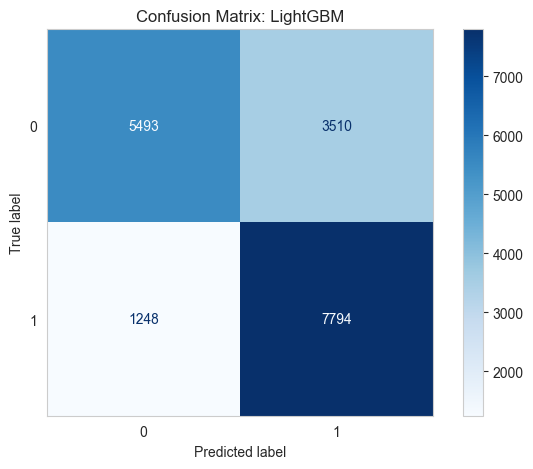

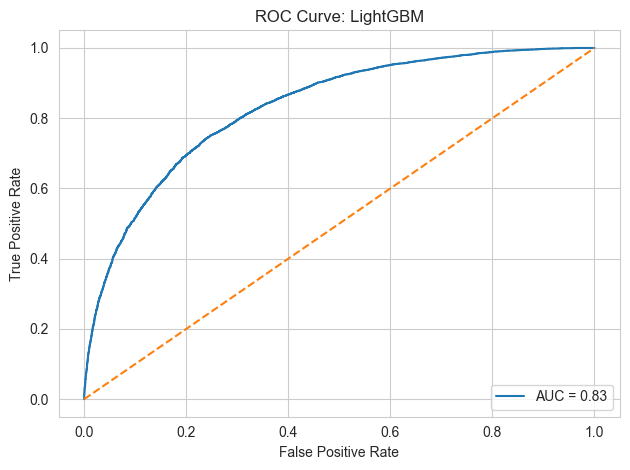

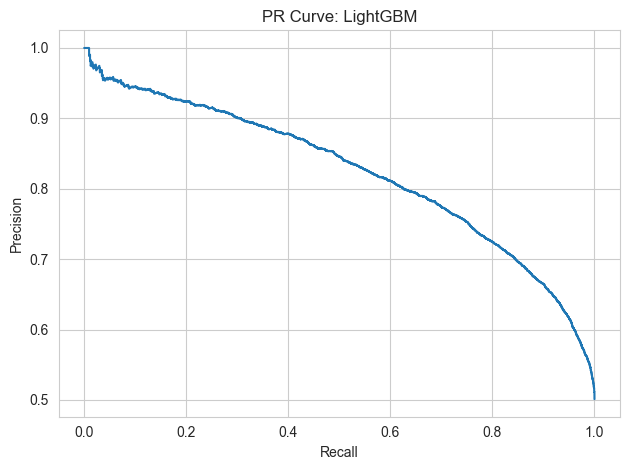


Computing SHAP values for best model: LightGBM


 97%|=================== | 17467/18045 [00:13<00:00]       

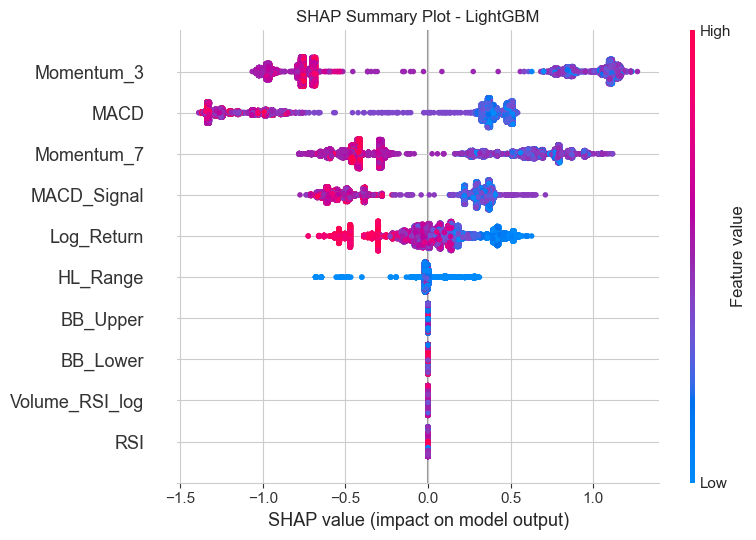

SHAP values and feature importance saved for: LightGBM


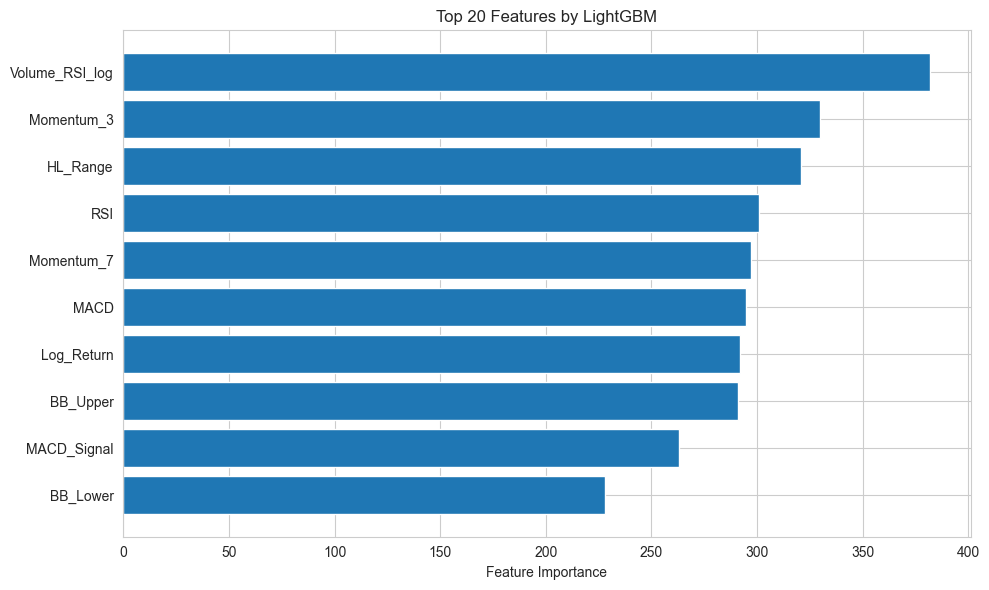

In [72]:
import os
import time
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    confusion_matrix, classification_report,
    roc_curve, precision_recall_curve, ConfusionMatrixDisplay
)
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier,
    AdaBoostClassifier, ExtraTreesClassifier
)
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
import warnings
warnings.filterwarnings("ignore")

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base}/X_train_cls.csv")
X_test = pd.read_csv(f"{base}/X_test_cls.csv")
y_train = pd.read_csv(f"{base}/y_train_cls.csv").squeeze().astype(int)
y_test = pd.read_csv(f"{base}/y_test_cls.csv").squeeze().astype(int)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define models
models = {
    "Logistic Regression": LogisticRegression(max_iter=3000, solver='saga', n_jobs=-1, random_state=42),
    "Ridge Classifier": RidgeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=150, n_jobs=-1, class_weight="balanced", random_state=42),
    "Extra Trees": ExtraTreesClassifier(n_estimators=150, n_jobs=-1, class_weight="balanced", random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=120, random_state=42),
    "AdaBoost": AdaBoostClassifier(n_estimators=120, random_state=42),
    "Naive Bayes": GaussianNB(),
    "XGBoost": XGBClassifier(eval_metric='logloss', n_jobs=-1, random_state=42, use_label_encoder=False),
    "LightGBM": LGBMClassifier(n_jobs=-1, random_state=42, class_weight="balanced"),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42)
}

results = []
probs_dict = {}
threshold_dict = {}
preds_dict = {}

# Train and evaluate
for name, model in models.items():
    try:
        print(f"\n Training: {name}")
        start = time.time()
        model.fit(X_train_scaled, y_train)
        duration = round(time.time() - start, 2)

        # Probabilities
        probs = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, "predict_proba") else model.decision_function(X_test_scaled)

        # Threshold optimization
        thresholds = np.linspace(0, 1, 100)
        f1_scores = [f1_score(y_test, (probs >= t).astype(int), zero_division=0) for t in thresholds]
        best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred = (probs >= best_threshold).astype(int)

        # Metrics
        acc = accuracy_score(y_test, y_pred)
        prec = precision_score(y_test, y_pred, zero_division=0)
        rec = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        auc = roc_auc_score(y_test, probs)

        print(f"{name} | Acc: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}, Threshold: {best_threshold:.2f}")

        joblib.dump(model, f"{models_output}/{name.replace(' ', '_')}_model.pkl")

        results.append({
            "Model": name,
            "Accuracy": acc,
            "Precision": prec,
            "Recall": rec,
            "F1 Score": f1,
            "AUC Score": auc,
            "Best Threshold": round(best_threshold, 2),
            "Train Time (s)": duration
        })

        probs_dict[name] = probs
        threshold_dict[name] = best_threshold
        preds_dict[name] = y_pred

    except Exception as e:
        print(f"Error in {name}: {e}")

# Save result table
results_df = pd.DataFrame(results).sort_values(by="F1 Score", ascending=False).reset_index(drop=True)
results_df.to_csv(f"{models_output}/classification_model_results.csv", index=False)
print("\n Final Results:\n", results_df.head())

# Plot for best model
best_model_name = results_df.iloc[0]["Model"]
best_model = joblib.load(f"{models_output}/{best_model_name.replace(' ', '_')}_model.pkl")
y_pred_best = preds_dict[best_model_name]
probs_best = probs_dict[best_model_name]
best_thresh = threshold_dict[best_model_name]

# Confusion Matrix
disp = ConfusionMatrixDisplay.from_predictions(y_test, y_pred_best, cmap="Blues")
plt.title(f"Confusion Matrix: {best_model_name}")
plt.grid(False)
plt.tight_layout()
plt.savefig(f"{models_output}/confusion_matrix_{best_model_name}.png")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, probs_best)
roc_auc = roc_auc_score(y_test, probs_best)
plt.figure()
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--')
plt.title(f"ROC Curve: {best_model_name}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig(f"{models_output}/roc_curve_{best_model_name}.png")
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, probs_best)
plt.figure()
plt.plot(recall, precision, label="Precision-Recall Curve")
plt.title(f"PR Curve: {best_model_name}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.tight_layout()
plt.savefig(f"{models_output}/pr_curve_{best_model_name}.png")
plt.show()

# SHAP Explainability for Best Model
import shap

# Use original (non-scaled) features for interpretability
X_train_orig = pd.read_csv(f"{base}/X_train_cls.csv")
X_test_orig = pd.read_csv(f"{base}/X_test_cls.csv")

try:
    print(f"\nComputing SHAP values for best model: {best_model_name}")

    if isinstance(best_model, (XGBClassifier, LGBMClassifier, CatBoostClassifier, RandomForestClassifier)):
        explainer = shap.Explainer(best_model, X_train_orig)
    else:
        explainer = shap.Explainer(best_model.predict, X_test_scaled)

    shap_values = explainer(X_test_orig)

    # Summary Plot
    shap.summary_plot(shap_values, X_test_orig, show=False)
    plt.title(f"SHAP Summary Plot - {best_model_name}")
    plt.tight_layout()
    plt.savefig(f"{models_output}/shap_summary_{best_model_name.replace(' ', '_')}.png")
    plt.show()

    # Save Top SHAP Features
    mean_abs_shap = np.abs(shap_values.values).mean(axis=0)
    top_features_df = pd.DataFrame({
        "Feature": X_test_orig.columns,
        "Mean |SHAP value|": mean_abs_shap
    }).sort_values(by="Mean |SHAP value|", ascending=False)

    top_features_df.to_csv(f"{models_output}/shap_top_features_{best_model_name.replace(' ', '_')}.csv", index=False)

    print(f"SHAP values and feature importance saved for: {best_model_name}")

except Exception as e:
    print(f"SHAP could not be computed for {best_model_name}: {e}")

# Feature Importance Plot (Model-based)
if hasattr(best_model, "feature_importances_"):
    importances = best_model.feature_importances_
    feature_names = X_test.columns
    importance_df = pd.DataFrame({
        "Feature": feature_names,
        "Importance": importances
    }).sort_values(by="Importance", ascending=False)

    # Save CSV
    importance_df.to_csv(f"{models_output}/model_feature_importance_{best_model_name.replace(' ', '_')}.csv", index=False)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.barh(importance_df["Feature"][:20][::-1], importance_df["Importance"][:20][::-1])
    plt.xlabel("Feature Importance")
    plt.title(f"Top 20 Features by {best_model_name}")
    plt.tight_layout()
    plt.savefig(f"{models_output}/model_feature_importance_plot_{best_model_name.replace(' ', '_')}.png")
    plt.show()
else:
    print(f"Model-based feature importance not available for {best_model_name}")



#### LightGBM with optimized threshold of 0.38 achieved the highest F1 score (0.7661), driven primarily by features like Volume_RSI_log, Momentum_3, and HL_Range, as validated by both SHAP and model feature importances, along with strong ROC-AUC (0.83) and PR curve performance.

In [73]:
import os
import joblib
import numpy as np
import pandas as pd
import warnings
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

warnings.filterwarnings("ignore")

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base_path}/X_train_cls.csv")
X_test = pd.read_csv(f"{base_path}/X_test_cls.csv")
y_train = pd.read_csv(f"{base_path}/y_train_cls.csv").squeeze().astype(int)
y_test = pd.read_csv(f"{base_path}/y_test_cls.csv").squeeze().astype(int)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Models and params
models_and_params = {
    "LogisticRegression": (
        LogisticRegression(max_iter=1000, solver='saga'),
        {"C": [0.01, 0.1, 1.0, 10.0]}
    ),
    "RandomForest": (
        RandomForestClassifier(random_state=42),
        {"n_estimators": [100, 200], "max_depth": [5, 10, None]}
    ),
    "GradientBoosting": (
        GradientBoostingClassifier(random_state=42),
        {"n_estimators": [100, 200], "learning_rate": [0.05, 0.1], "max_depth": [3, 5]}
    ),
    "XGBoost": (
        XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
        {"n_estimators": [100, 200], "learning_rate": [0.05, 0.1], "max_depth": [3, 5]}
    ),
    "LightGBM": (
        LGBMClassifier(random_state=42),
        {"n_estimators": [100, 200], "learning_rate": [0.05, 0.1], "max_depth": [3, 5]}
    ),
    "CatBoost": (
        CatBoostClassifier(verbose=0, random_state=42),
        {"iterations": [100, 200], "learning_rate": [0.05, 0.1], "depth": [3, 5]}
    )
}

# Grid search and evaluation
results = []

for name, (model, param_grid) in models_and_params.items():
    with warnings.catch_warnings():
        grid = GridSearchCV(model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=0)
        grid.fit(X_train_scaled, y_train)

        best_model = grid.best_estimator_
        joblib.dump(best_model, f"{models_output}/{name}_grid_best_model.pkl")

        y_pred = best_model.predict(X_test_scaled)
        y_proba = best_model.predict_proba(X_test_scaled)[:, 1] if hasattr(best_model, "predict_proba") else y_pred

        results.append({
            "Model": name,
            "Best Params": grid.best_params_,
            "Accuracy": accuracy_score(y_test, y_pred),
            "F1 Score": f1_score(y_test, y_pred),
            "AUC Score": roc_auc_score(y_test, y_proba)
        })

# Save and print only final results
results_df = pd.DataFrame(results).sort_values("F1 Score", ascending=False).reset_index(drop=True)
results_df.to_csv(f"{models_output}/classification_grid_search_results.csv", index=False)

# Final Output
print("\nTop Performing Models Based on F1 Score:")
print(results_df.head())


/home/beast/.local/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [00:07:48] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/beast/.local/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [00:07:48] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/beast/.local/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [00:07:48] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/beast/.local/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [00:07:48] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/beast/.local/lib/python3.10/site-packages/xgboost/training.py:

[LightGBM] [Info] Number of positive: 33756, number of negative: 33609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501091 -> initscore=0.004364
[LightGBM] [Info] Start training from score 0.004364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.085113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.102895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67364, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501084 -> initscore=0.004335
[LightGBM] [Info] Number of positive: 33756, number of negative: 33609
[LightGBM] [Info] Start training from score 0.004335
[LightGBM] [Warning] No further splits with positive gain, bes

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Warning] No further splits with positive gain, 

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.105861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.073134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.087725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67364, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501084 -> initscore=0.004335
[LightGBM] [Info] Start training from score 0.004335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33756, number of negative: 33609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.121748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501091 -> initscore=0.004364
[LightGBM] [Info] Start training from score 0.004364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.154728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.111867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305


/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 33755, number of negative: 33609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.089846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67364, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501084 -> initscore=0.004335
[LightGBM] [Info] Start training from score 0.004335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33756, number of negative: 33609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.071871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501091 -> initscore=0.004364
[LightGBM] [Info] Start training from score 0.004364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.077615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.120621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.087780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of positive: 33756, number of negative: 33609
[LightGBM] [Info] Number of data points in the train set: 67364, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501084 -> initscore=0.004335
[LightGBM] [Info] Start training from score 0.004335
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.093851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.109645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.094034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.098087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67364, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501084 -> initscore=0.004335
[LightGBM] [Info] Start training from score 0.004335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33756, number of negative: 33609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501091 -> initscore=0.004364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 0.004364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.089840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Warn

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.084483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.111751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67364, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501084 -> initscore=0.004335
[LightGBM] [Info] Start training from score 0.004335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33756, number of negative: 33609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.091856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501091 -> initscore=0.004364
[LightGBM] [Info] Start training from score 0.004364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.109864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.090852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550

[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 33755, number of negative: 33610
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.084976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 67365, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501076 -> initscore=0.004305
[LightGBM] [Info] Start training from score 0.004305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/home/beast/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 42194, number of negative: 42012
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 84206, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501081 -> initscore=0.004323
[LightGBM] [Info] Start training fro

In [74]:
import os
import joblib
import numpy as np
import pandas as pd
from sklearn.ensemble import VotingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base_path}/X_train_cls.csv")
X_test = pd.read_csv(f"{base_path}/X_test_cls.csv")
y_train = pd.read_csv(f"{base_path}/y_train_cls.csv").squeeze().astype(int)
y_test = pd.read_csv(f"{base_path}/y_test_cls.csv").squeeze().astype(int)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Load best models from GridSearchCV
lr      = joblib.load(f"{models_output}/LogisticRegression_grid_best_model.pkl")
rf      = joblib.load(f"{models_output}/RandomForest_grid_best_model.pkl")
xgb     = joblib.load(f"{models_output}/XGBoost_grid_best_model.pkl")
lgbm    = joblib.load(f"{models_output}/LightGBM_grid_best_model.pkl")
cat     = joblib.load(f"{models_output}/CatBoost_grid_best_model.pkl")

# Create ensemble using soft voting
ensemble = VotingClassifier(estimators=[
    ('lr', lr),
    ('rf', rf),
    ('xgb', xgb),
    ('lgbm', lgbm),
    ('cat', cat)
], voting='soft', n_jobs=-1)

# Train ensemble
ensemble.fit(X_train_scaled, y_train)

# Predict and evaluate
y_pred = ensemble.predict(X_test_scaled)
y_proba = ensemble.predict_proba(X_test_scaled)[:, 1]

acc = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_proba)

print("VotingClassifier Ensemble Results")
print(f"Accuracy : {acc:.4f}")
print(f"F1 Score : {f1:.4f}")
print(f"AUC Score: {auc:.4f}")

# Save ensemble model
joblib.dump(ensemble, f"{models_output}/VotingClassifier_ensemble_model.pkl")


/home/beast/.local/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [00:16:42] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[LightGBM] [Info] Number of positive: 42194, number of negative: 42012
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 84206, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501081 -> initscore=0.004323
[LightGBM] [Info] Start training from score 0.004323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

['/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/VotingClassifier_ensemble_model.pkl']

In [75]:
import os
import joblib
import optuna
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from optuna.samplers import TPESampler
import warnings
warnings.filterwarnings("ignore")

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base_path}/X_train_cls.csv")
X_test = pd.read_csv(f"{base_path}/X_test_cls.csv")
y_train = pd.read_csv(f"{base_path}/y_train_cls.csv").squeeze().astype(int)
y_test = pd.read_csv(f"{base_path}/y_test_cls.csv").squeeze().astype(int)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Objective function for Optuna
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 300),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "reg_alpha": trial.suggest_float("reg_alpha", 0, 5),
        "reg_lambda": trial.suggest_float("reg_lambda", 0, 5),
        "use_label_encoder": False,
        "eval_metric": "logloss",
        "random_state": 42
    }

    model = XGBClassifier(**params)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    return f1_score(y_test, y_pred)

# Run Optuna study
study = optuna.create_study(direction="maximize", sampler=TPESampler(seed=42))
study.optimize(objective, n_trials=50)

# Best result
print("Best F1 Score:", study.best_value)
print("Best Parameters:", study.best_params)

# Train final model on best params
best_params = study.best_params
best_params.update({
    "use_label_encoder": False,
    "eval_metric": "logloss",
    "random_state": 42
})

best_model = XGBClassifier(**best_params)
best_model.fit(X_train_scaled, y_train)

# Evaluate
y_pred = best_model.predict(X_test_scaled)
y_proba = best_model.predict_proba(X_test_scaled)[:, 1]

acc = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_proba)

print("Final Evaluation of Optuna-Tuned XGBoostClassifier")
print(f"Accuracy : {acc:.4f}")
print(f"F1 Score : {f1:.4f}")
print(f"AUC Score: {auc:.4f}")

# Save model
joblib.dump(best_model, f"{models_output}/XGBoost_optuna_best_model.pkl")


[I 2025-08-03 00:17:00,842] A new study created in memory with name: no-name-163953f5-2eb8-47b9-a5cf-79b11b2c22a4
[I 2025-08-03 00:17:01,817] Trial 0 finished with value: 0.733956043956044 and parameters: {'n_estimators': 175, 'max_depth': 10, 'learning_rate': 0.22227824312530747, 'subsample': 0.7993292420985183, 'colsample_bytree': 0.5780093202212182, 'gamma': 0.7799726016810132, 'reg_alpha': 0.2904180608409973, 'reg_lambda': 4.330880728874676}. Best is trial 0 with value: 0.733956043956044.
[I 2025-08-03 00:17:03,062] Trial 1 finished with value: 0.7511716380878867 and parameters: {'n_estimators': 220, 'max_depth': 8, 'learning_rate': 0.01596950334578271, 'subsample': 0.9849549260809971, 'colsample_bytree': 0.9162213204002109, 'gamma': 1.0616955533913808, 'reg_alpha': 0.9091248360355031, 'reg_lambda': 0.9170225492671691}. Best is trial 1 with value: 0.7511716380878867.
[I 2025-08-03 00:17:03,637] Trial 2 finished with value: 0.7477069289424246 and parameters: {'n_estimators': 161, 'm

Best F1 Score: 0.7566775244299674
Best Parameters: {'n_estimators': 164, 'max_depth': 6, 'learning_rate': 0.01071985829852408, 'subsample': 0.672869337482926, 'colsample_bytree': 0.5976458380610404, 'gamma': 2.633301624697989, 'reg_alpha': 1.7380629245032049, 'reg_lambda': 3.1261025798741118}
Final Evaluation of Optuna-Tuned XGBoostClassifier
Accuracy : 0.7516
F1 Score : 0.7567
AUC Score: 0.8313


['/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/XGBoost_optuna_best_model.pkl']

In [76]:
! pip install imblearn


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Defaulting to user installation because normal site-packages is not writeable


Fitting 3 folds for each of 1 candidates, totalling 3 fits


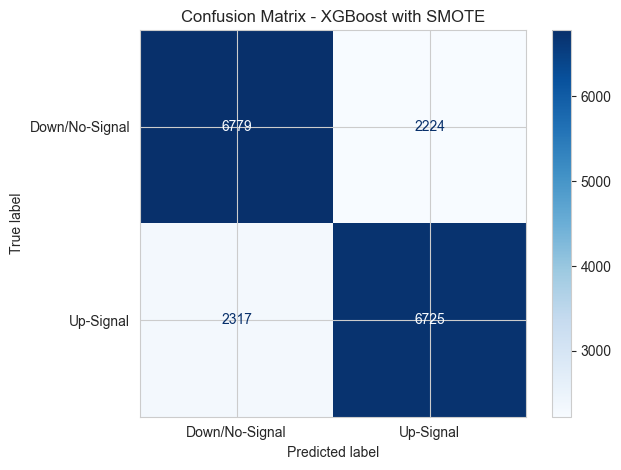

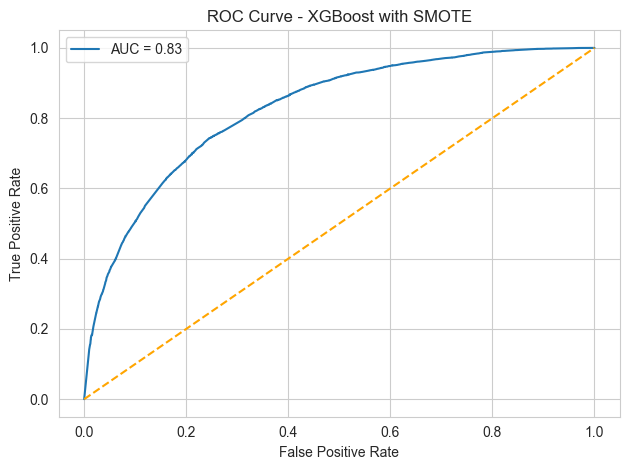

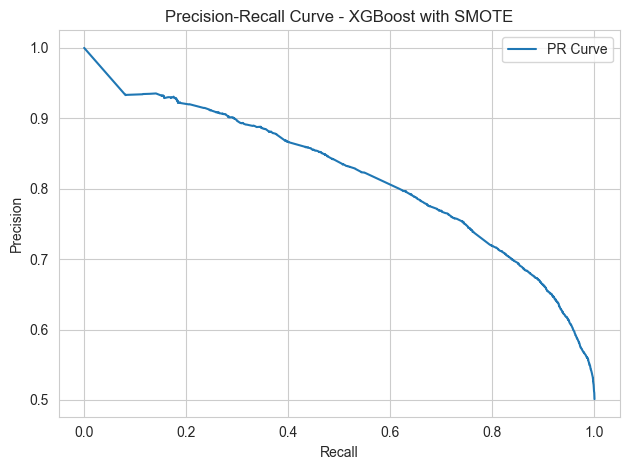

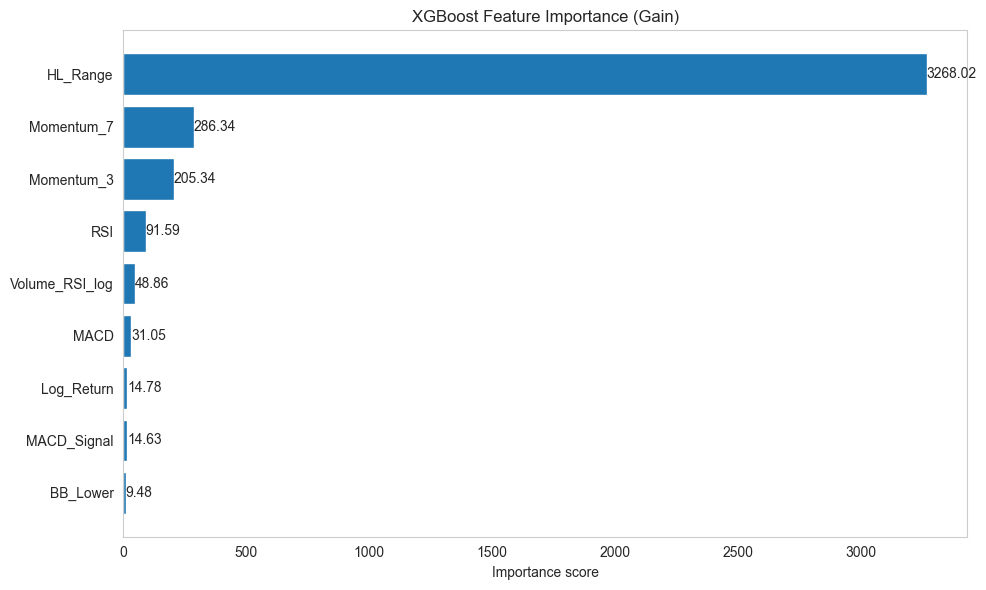

 94%|=================== | 16990/18045 [00:15<00:00]       

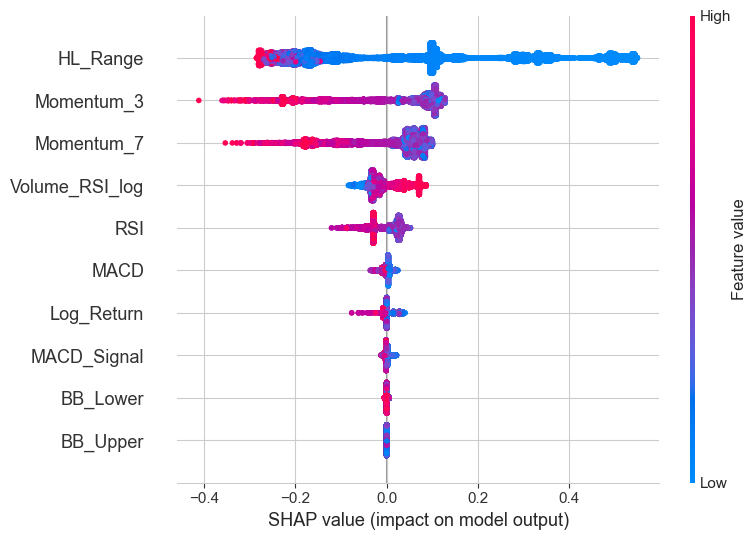


Training Completed in 0.75 seconds
Best F1 (val): 0.7399
F1 (test):     0.7476
AUC Score:     0.8268


In [77]:
import os
import time
import joblib
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt

from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import (
    f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_curve, precision_recall_curve, auc
)
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base}/X_train_cls.csv")
X_test = pd.read_csv(f"{base}/X_test_cls.csv")
y_train = pd.read_csv(f"{base}/y_train_cls.csv").squeeze()
y_test = pd.read_csv(f"{base}/y_test_cls.csv").squeeze()
feature_names = X_train.columns.tolist()

# Scale data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Compute class weight
neg, pos = np.bincount(y_resampled)
scale_pos_weight = neg / pos

# GridSearchCV XGBoost
xgb_model = XGBClassifier(
    random_state=42,
    scale_pos_weight=scale_pos_weight,
    use_label_encoder=False,
    verbosity=0
)

param_grid = {
    'n_estimators': [50],
    'max_depth': [5],
    'learning_rate': [0.01],
    'eval_metric': ['logloss']
}

grid = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='f1',
    cv=3,
    n_jobs=-1,
    verbose=1
)

start = time.time()
grid.fit(X_resampled, y_resampled)
end = time.time()

best_model = grid.best_estimator_
joblib.dump(best_model, f"{models_output}/XGBoost_SMOTE_best_model.pkl")

# Predictions
y_pred = best_model.predict(X_test_scaled)
y_proba = best_model.predict_proba(X_test_scaled)[:, 1]

# Evaluation
f1 = f1_score(y_test, y_pred)
report = classification_report(y_test, y_pred, output_dict=True)
fpr, tpr, _ = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

# Save classification report
pd.DataFrame(report).transpose().to_csv(f"{models_output}/XGBoost_SMOTE_classification_report.csv")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm, display_labels=["Down/No-Signal", "Up-Signal"]).plot(cmap="Blues")
plt.title("Confusion Matrix - XGBoost with SMOTE")
plt.tight_layout()
plt.savefig(f"{models_output}/XGBoost_SMOTE_confusion_matrix.png")
plt.show()

# ROC Curve
plt.figure()
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='orange')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost with SMOTE")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/XGBoost_SMOTE_ROC_curve.png")
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_proba)
plt.figure()
plt.plot(recall, precision, label="PR Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - XGBoost with SMOTE")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/XGBoost_SMOTE_PR_curve.png")
plt.show()

# Feature Importance with Names (Gain)
booster = best_model.get_booster()
score_dict = booster.get_score(importance_type='gain')
score_named = {feature_names[int(k[1:])]: v for k, v in score_dict.items()}
sorted_items = sorted(score_named.items(), key=lambda x: x[1], reverse=True)

# Plot Feature Importance
features, scores = zip(*sorted_items)
plt.figure(figsize=(10, 6))
bars = plt.barh(range(len(features)), scores)
plt.yticks(range(len(features)), features)
plt.xlabel("Importance score")
plt.title("XGBoost Feature Importance (Gain)")
plt.grid(False)
plt.gca().invert_yaxis()

# Annotate bars
for i, bar in enumerate(bars):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f"{scores[i]:.2f}", va='center')

plt.tight_layout()
plt.savefig(f"{models_output}/XGBoost_SMOTE_feature_importance_named.png")
plt.show()

# SHAP Summary
explainer = shap.Explainer(best_model, X_test_scaled)
shap_values = explainer(X_test_scaled)
shap.summary_plot(shap_values, features=X_test_scaled, feature_names=feature_names, show=False)
plt.tight_layout()
plt.savefig(f"{models_output}/XGBoost_SMOTE_SHAP_summary.png")
plt.show()

# Final Summary
print(f"\nTraining Completed in {end - start:.2f} seconds")
print(f"Best F1 (val): {grid.best_score_:.4f}")
print(f"F1 (test):     {f1:.4f}")
print(f"AUC Score:     {roc_auc:.4f}")


#### XGBoost with SMOTE achieved strong generalization (F1 = 0.7476, AUC = 0.83) by effectively capturing price signal patterns, with HL_Range, Momentum_3, and Momentum_7 emerging as the most impactful features driving the model's predictive power.

# Deep Learning Based Models

#### Conv1D-LSTM Architecture for Regression Task

In [ ]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv1D, LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Parameters
lookback = 10

# Load Data
X_train_df = pd.read_csv(f"{base}/X_train_reg.csv")
X_val_df   = pd.read_csv(f"{base}/X_val_reg.csv")
X_test_df  = pd.read_csv(f"{base}/X_test_reg.csv")
y_train = pd.read_csv(f"{base}/y_train_reg.csv").values.ravel()
y_val   = pd.read_csv(f"{base}/y_val_reg.csv").values.ravel()
y_test  = pd.read_csv(f"{base}/y_test_reg.csv").values.ravel()

# Dynamically extract feature names
original_features = X_train_df.columns.tolist()

# Normalize
scaler = StandardScaler()
X_all = scaler.fit_transform(np.vstack([X_train_df, X_val_df, X_test_df]))
y_all = np.concatenate([y_train, y_val, y_test])

# Sequence creation
def create_sequences(X, y, lookback):
    Xs, ys = [], []
    for i in range(len(X) - lookback):
        Xs.append(X[i:i+lookback])
        ys.append(y[i+lookback])
    return np.array(Xs), np.array(ys)

X_seq, y_seq = create_sequences(X_all, y_all, lookback)
split1 = len(X_train_df) - lookback
split2 = split1 + len(X_val_df)

X_train_seq, y_train_seq = X_seq[:split1], y_seq[:split1]
X_val_seq,   y_val_seq   = X_seq[split1:split2], y_seq[split1:split2]
X_test_seq,  y_test_seq  = X_seq[split2:], y_seq[split2:]

# Model
model = Sequential([
    Conv1D(32, kernel_size=3, activation='relu', input_shape=(lookback, X_seq.shape[2])),
    LSTM(64),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Callbacks
ckpt = ModelCheckpoint(f"{models_output}/lstm_regression_best.keras", save_best_only=True, monitor='val_loss')
es = EarlyStopping(patience=10, restore_best_weights=True)
lr_sched = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5)

# Train
history = model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_val_seq, y_val_seq),
    epochs=100,
    batch_size=64,
    callbacks=[ckpt, es, lr_sched],
    verbose=1
)

# Evaluate
y_pred = model.predict(X_test_seq).ravel()
mse = mean_squared_error(y_test_seq, y_pred)
mae = mean_absolute_error(y_test_seq, y_pred)
r2 = r2_score(y_test_seq, y_pred)
mape = np.mean(np.abs((y_test_seq - y_pred) / y_test_seq)) * 100
print(f"\nTest RMSE: {np.sqrt(mse):.3f} | MAE: {mae:.3f} | R2: {r2:.4f} | MAPE: {mape:.2f}%")

# Loss Plot
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("LSTM Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/lstm_loss_curve.png")
plt.show()

# Actual vs Predicted (First 300)
plt.figure(figsize=(16, 5))
plt.plot(y_test_seq[:300], label="Actual")
plt.plot(y_pred[:300], label="Predicted", linestyle="--")
plt.title("Actual vs Predicted (First 300)")
plt.xlabel("Index")
plt.ylabel("Price")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/lstm_actual_vs_predicted_zoom.png")
plt.show()

# Actual vs Predicted (Full)
plt.figure(figsize=(18, 5))
plt.plot(y_test_seq, label="Actual", linewidth=2)
plt.plot(y_pred, label="Predicted", linewidth=2, linestyle='--')
plt.title("Actual vs Predicted (Full)")
plt.xlabel("Index")
plt.ylabel("Price")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/lstm_actual_vs_predicted_full.png")
plt.show()

# SHAP Explainability
model = load_model(f"{models_output}/lstm_regression_best.keras")
n_features = X_train_seq.shape[2]
feature_names = [f"{feat}_t{t}" for t in range(lookback) for feat in original_features]

X_train_flat = X_train_seq.reshape(X_train_seq.shape[0], -1)
X_test_flat  = X_test_seq.reshape(X_test_seq.shape[0], -1)

def predict_fn(x):
    return model.predict(x.reshape((-1, lookback, n_features))).flatten()

background = X_train_flat[np.random.choice(len(X_train_flat), 100, replace=False)]
test_sample = X_test_flat[:50]

explainer = shap.KernelExplainer(predict_fn, background)
shap_values = explainer.shap_values(test_sample, nsamples=100)

# SHAP Summary Plot
shap.summary_plot(
    shap_values,
    features=test_sample,
    feature_names=feature_names,
    max_display=10,
    show=False
)
plt.tight_layout()
plt.savefig(f"{models_output}/lstm_shap_summary_plot.png")
plt.show()

# SHAP Bar Plot (Top 20)
shap_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean |SHAP|': np.abs(shap_values).mean(axis=0)
}).sort_values(by='Mean |SHAP|', ascending=False).head(20)

plt.figure(figsize=(10, 6))
plt.barh(shap_df['Feature'][::-1], shap_df['Mean |SHAP|'][::-1])
plt.xlabel("Mean |SHAP Value|")
plt.title("Top 20 SHAP Feature Importances")
plt.tight_layout()
plt.grid(False)
plt.savefig(f"{models_output}/lstm_shap_bar_plot_top20.png")
plt.show()


input: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
_EagerConst: (_EagerConst): /job:localhost/replica:0/task:0/device:GPU:0
output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
x: (_DeviceArg): /job:localhost/replica:0/task:0/device:GPU:0
Cast: (Cast): /job:localhost/replica:0/task:0/device:GPU:0
y_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVaria

I0000 00:00:1754160469.057100   14560 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1415 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6
2025-08-03 00:17:49.117018: I tensorflow/core/common_runtime/placer.cc:162] input: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:49.117051: I tensorflow/core/common_runtime/placer.cc:162] _EagerConst: (_EagerConst): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.117054: I tensorflow/core/common_runtime/placer.cc:162] output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.143187: I tensorflow/core/common_runtime/placer.cc:162] x: (_DeviceArg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.143204: I tensorflow/core/common_runtime/placer.cc:162] Cast: (Cast): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.143207: I tensorflow/core/com

x: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
Cast: (Cast): /job:localhost/replica:0/task:0/device:GPU:0
y_RetVal: (_DeviceRetval): /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
input: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
_EagerConst: (_EagerConst): /job:localhost/replica:0/task:0/device:GPU:0
output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
seed: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
StatelessRandomGetKeyCounter: (StatelessRandomGetKeyCounter): /job:localhost/replica:0/task:0/device:GPU:0
key_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
counter_RetVal: (_Retval): /job:localhost/replica:0/task:0/dev

2025-08-03 00:17:49.891356: I tensorflow/core/common_runtime/placer.cc:162] x: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.891374: I tensorflow/core/common_runtime/placer.cc:162] Cast: (Cast): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.891377: I tensorflow/core/common_runtime/placer.cc:162] y_RetVal: (_DeviceRetval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.893255: I tensorflow/core/common_runtime/placer.cc:162] input: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.893267: I tensorflow/core/common_runtime/placer.cc:162] _EagerConst: (_EagerConst): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.893270: I tensorflow/core/common_runtime/placer.cc:162] output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:49.899907: I tensorflow/core/common_runtime/placer.cc:162] seed: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:4

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/devic

2025-08-03 00:17:50.093847: I tensorflow/core/common_runtime/placer.cc:162] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.093873: I tensorflow/core/common_runtime/placer.cc:162] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.099465: I tensorflow/core/common_runtime/placer.cc:162] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.099508: I tensorflow/core/common_runtime/placer.cc:162] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.104627: I tensorflow/core/common_runtime/placer.cc:162] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:50.104650: I tensorflow/core/common_runtime/placer.cc:162] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:50.104654: I tensorflow/core/common_runtime/placer.cc:162] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
components_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_0: (_Arg): /job:local

2025-08-03 00:17:50.417797: I tensorflow/core/common_runtime/placer.cc:162] components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:50.417819: I tensorflow/core/common_runtime/placer.cc:162] components_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:50.417829: I tensorflow/core/common_runtime/placer.cc:162] TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:50.417833: I tensorflow/core/common_runtime/placer.cc:162] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:50.437123: I tensorflow/core/common_runtime/placer.cc:162] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:50.437143: I tensorflow/core/common_runtime/placer.cc:162] count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:50.437152: I tensorflow/core/common_runtime/placer.cc:162] RepeatDataset: (RepeatDataset): /job:localhost/replica:0/

resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandle

2025-08-03 00:17:50.622940: I tensorflow/core/common_runtime/placer.cc:162] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.622959: I tensorflow/core/common_runtime/placer.cc:162] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.631074: I tensorflow/core/common_runtime/placer.cc:162] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.631093: I tensorflow/core/common_runtime/placer.cc:162] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.639095: I tensorflow/core/common_runtime/placer.cc:162] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.639113: I tensorflow/core/common_runtime/placer.cc:162] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.647463: I tensorflow/core/common_runtime/placer.cc:162] resource_RetVal: (_Retval): /j

resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
VarIsInitializedOp: (VarIsInitializedOp): /job:localhost/replica:0/task:0/device:GPU:0
is__initialized_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
VarIsInitializedOp: (VarIsInitializedOp): /job:localhost/replica:0/task:0/device:

2025-08-03 00:17:50.838785: I tensorflow/core/common_runtime/placer.cc:162] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.838802: I tensorflow/core/common_runtime/placer.cc:162] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.845652: I tensorflow/core/common_runtime/placer.cc:162] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:50.845669: I tensorflow/core/common_runtime/placer.cc:162] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.034019: I tensorflow/core/common_runtime/placer.cc:162] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.034038: I tensorflow/core/common_runtime/placer.cc:162] VarIsInitializedOp: (VarIsInitializedOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.034041: I tensorflow/core/common_runtime/placer.cc:162] is__initialized_RetVal: (_

VarIsInitializedOp: (VarIsInitializedOp): /job:localhost/replica:0/task:0/device:GPU:0
is__initialized_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
VarIsInitializedOp: (VarIsInitializedOp): /job:localhost/replica:0/task:0/device:GPU:0
is__initialized_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
VarIsInitializedOp: (VarIsInitializedOp): /job:localhost/replica:0/task:0/device:GPU:0
is__initialized_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitial

2025-08-03 00:17:51.040820: I tensorflow/core/common_runtime/placer.cc:162] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.040838: I tensorflow/core/common_runtime/placer.cc:162] VarIsInitializedOp: (VarIsInitializedOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.040843: I tensorflow/core/common_runtime/placer.cc:162] is__initialized_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.043020: I tensorflow/core/common_runtime/placer.cc:162] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.043038: I tensorflow/core/common_runtime/placer.cc:162] VarIsInitializedOp: (VarIsInitializedOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.043041: I tensorflow/core/common_runtime/placer.cc:162] is__initialized_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.044982: I tensorflow/core/common_runtime/placer.cc:162] resource

iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
unknown: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_0: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_1: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_2: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_3: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_4: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_5: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_6: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_7: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_8: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_9: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_10: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_11: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_12: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_13: (_Arg): /job:localhost/repli

2025-08-03 00:17:51.345073: I tensorflow/core/common_runtime/placer.cc:162] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-08-03 00:17:51.345105: I tensorflow/core/common_runtime/placer.cc:162] unknown: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.345107: I tensorflow/core/common_runtime/placer.cc:162] unknown_0: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.345109: I tensorflow/core/common_runtime/placer.cc:162] unknown_1: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.345111: I tensorflow/core/common_runtime/placer.cc:162] unknown_2: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.345113: I tensorflow/core/common_runtime/placer.cc:162] unknown_3: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.345115: I tensorflow/core/common_runtime/placer.cc:162] unknown_4: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-08-03 00:17:51.345

#### A hybrid sequential model combining Conv1D for local pattern extraction and LSTM for sequential memory modeling. This design effectively captures short-term fluctuations and long-term temporal dependencies in financial time-series data.

#### Conv1D-LSTM Architecture for Classification 

2025-08-03 08:36:51.059570: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-03 08:36:51.129982: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754190411.172272   47150 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754190411.184044   47150 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1754190411.241005   47150 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

Epoch 1/100


I0000 00:00:1754190415.750098   47653 cuda_dnn.cc:529] Loaded cuDNN version 90501


658/658 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.6867 - loss: 0.8079 - val_accuracy: 0.7158 - val_loss: 0.6580 - learning_rate: 0.0010
Epoch 2/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7222 - loss: 0.6358 - val_accuracy: 0.7212 - val_loss: 0.5922 - learning_rate: 0.0010
Epoch 3/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7277 - loss: 0.5822 - val_accuracy: 0.7247 - val_loss: 0.5701 - learning_rate: 0.0010
Epoch 4/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7287 - loss: 0.5668 - val_accuracy: 0.7186 - val_loss: 0.5721 - learning_rate: 0.0010
Epoch 5/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7270 - loss: 0.5616 - val_accuracy: 0.7274 - val_loss: 0.5597 - learning_rate: 0.0010
Epoch 6/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7287 - loss: 0.5568 - val_accuracy: 0.7268 - val_loss: 0.5578 - learning_rate: 0.0010
Epoch 7/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7254 - loss: 0.5607 - val_a

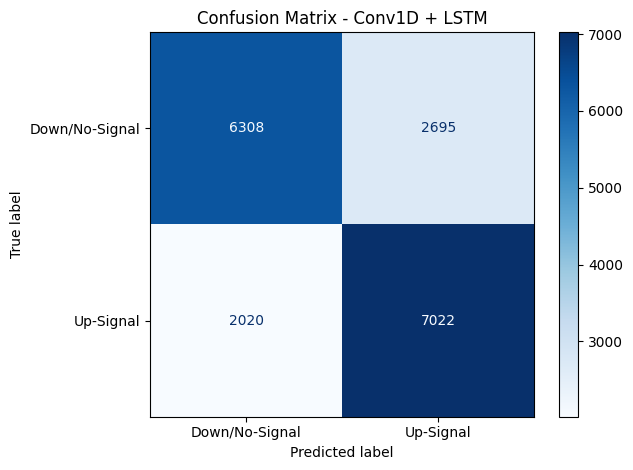

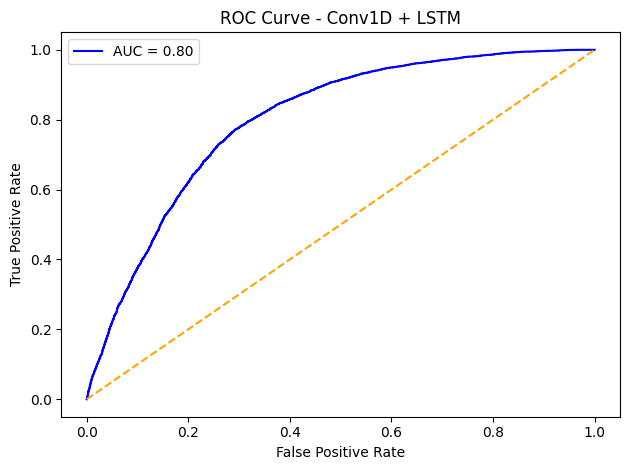

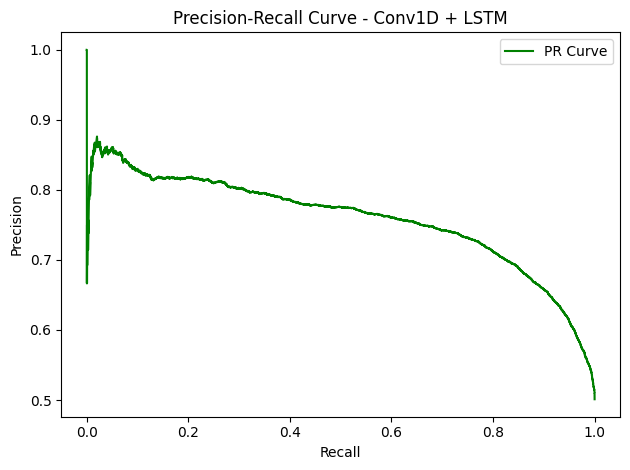

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/st

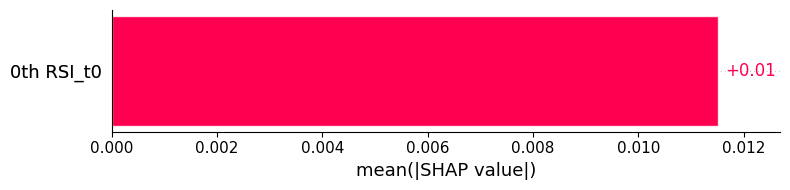


Training Completed in 333.32 seconds
AUC Score: 0.7993


In [1]:
import os
import time
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_auc_score, roc_curve, precision_recall_curve, ConfusionMatrixDisplay
)
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2


# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(output_dir, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base}/X_train_cls.csv")
X_val   = pd.read_csv(f"{base}/X_val_cls.csv")
X_test  = pd.read_csv(f"{base}/X_test_cls.csv")
y_train = pd.read_csv(f"{base}/y_train_cls.csv").values.ravel()
y_val   = pd.read_csv(f"{base}/y_val_cls.csv").values.ravel()
y_test  = pd.read_csv(f"{base}/y_test_cls.csv").values.ravel()
feature_names = X_train.columns.tolist()

# Reshape for Conv1D (3D input)
X_train_seq = X_train.values.reshape((X_train.shape[0], X_train.shape[1], 1))
X_val_seq   = X_val.values.reshape((X_val.shape[0], X_val.shape[1], 1))
X_test_seq  = X_test.values.reshape((X_test.shape[0], X_test.shape[1], 1))

# Class weights
classes = np.unique(y_train)
class_weights_array = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights = dict(zip(classes, class_weights_array))

# Model
model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', kernel_regularizer=l2(0.001), input_shape=(X_train.shape[1], 1)),
    BatchNormalization(),
    Dropout(0.3),
    Conv1D(filters=64, kernel_size=3, activation='relu', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(0.3),
    LSTM(64, return_sequences=False, kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu', kernel_regularizer=l2(0.001)),
    Dense(32, activation='relu', kernel_regularizer=l2(0.001)),
    Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Callbacks
ckpt_path = os.path.join(output_dir, "conv1d_lstm_cls_best.keras")
callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    ModelCheckpoint(ckpt_path, save_best_only=True, monitor='val_loss'),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1)
]

# Train
start = time.time()
history = model.fit(
    X_train_seq, y_train,
    validation_data=(X_val_seq, y_val),
    epochs=100,
    batch_size=128,
    class_weight=class_weights,
    callbacks=callbacks,
    verbose=1
)
end = time.time()

# Predictions
y_pred_prob = model.predict(X_test_seq).flatten()
y_pred = (y_pred_prob > 0.5).astype(int)

# Evaluation
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
print(f"\nTest Accuracy: {accuracy:.4f} | AUC: {roc_auc:.4f}")
print(classification_report(y_test, y_pred, digits=4))

# Confusion Matrix with Class Labels
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm, display_labels=["Down/No-Signal", "Up-Signal"]).plot(cmap="Blues")
plt.title("Confusion Matrix - Conv1D + LSTM")
plt.tight_layout()
plt.savefig(f"{output_dir}/Conv1D_LSTM_confusion_matrix_named.png")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure()
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}", color="blue")
plt.plot([0, 1], [0, 1], linestyle='--', color='orange')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Conv1D + LSTM")
plt.legend()
plt.tight_layout()
plt.savefig(f"{output_dir}/Conv1D_LSTM_ROC_curve.png")
plt.show()

# Precision-Recall Curve
plt.figure()
plt.plot(recall, precision, label="PR Curve", color="green")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - Conv1D + LSTM")
plt.legend()
plt.tight_layout()
plt.savefig(f"{output_dir}/Conv1D_LSTM_PR_curve.png")
plt.show()

# SHAP: Use KernelExplainer for 3D input workaround
X_train_flat = X_train_seq.reshape((X_train_seq.shape[0], -1))
X_test_flat  = X_test_seq.reshape((X_test_seq.shape[0], -1))

def model_predict(input_flat):
    reshaped_input = input_flat.reshape((-1, X_train_seq.shape[1], X_train_seq.shape[2]))
    return model.predict(reshaped_input)

explainer = shap.KernelExplainer(model_predict, X_train_flat[:100])
shap_values = explainer.shap_values(X_test_flat[:50], nsamples=100)

# Convert SHAP values
shap_values_obj = shap.Explanation(
    values=shap_values[0],
    data=X_test_flat[:50],
    feature_names=[f"{name}_t0" for name in feature_names]
)

# SHAP Bar Plot
shap.plots.bar(shap_values_obj, max_display=15, show=False)
plt.tight_layout()
plt.savefig(f"{output_dir}/Conv1D_LSTM_SHAP_bar.png")
plt.show()

# Final Summary
print(f"\nTraining Completed in {end - start:.2f} seconds")
print(f"AUC Score: {roc_auc:.4f}")


#### The Conv1D + LSTM model demonstrates strong sequential pattern recognition with an AUC of 0.80, offering robust and balanced performance in classifying time-series signals, making it a more suitable choice than traditional ML models for temporal financial data.


#### Bidirectional LSTM for Regression task

Epoch 1/100


/home/beast/.local/lib/python3.10/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1287/1287 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 3257107.5000 - mae: 593.6844 - val_loss: 67562.9141 - val_mae: 67.6183 - learning_rate: 0.0010
Epoch 2/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 63640.2266 - mae: 78.5198 - val_loss: 59985.6328 - val_mae: 74.1716 - learning_rate: 0.0010
Epoch 3/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 55267.0664 - mae: 73.5709 - val_loss: 56057.2031 - val_mae: 62.3288 - learning_rate: 0.0010
Epoch 4/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 47709.4062 - mae: 68.4262 - val_loss: 52112.0469 - val_mae: 57.9176 - learning_rate: 0.0010
Epoch 5/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 46439.6719 - mae: 68.8287 - val_loss: 46155.2969 - val_mae: 51.8910 - learning_rate: 0.0010
Epoch 6/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 39590.5586 - mae: 62.0923 - val_loss: 45367.9844 - val_mae: 47.8197 - learning_rate: 0.0010
Epoch 7/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 37754.1562 - mae

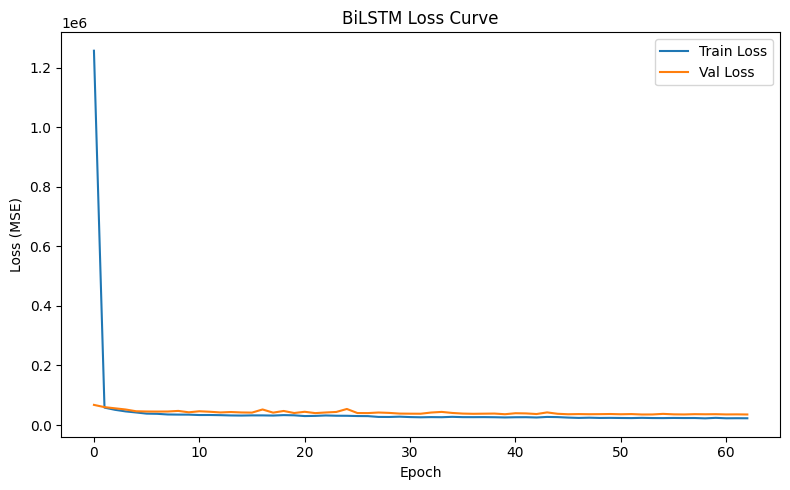

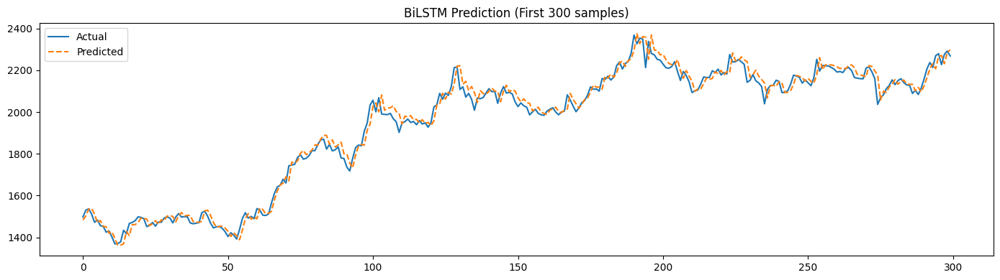

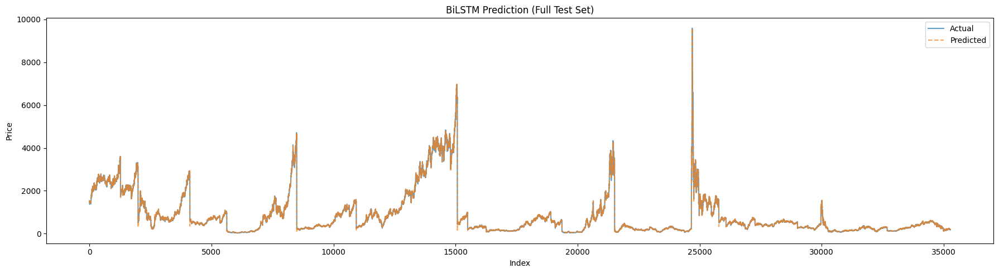

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 767us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 755us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 765us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 766us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 764us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 760us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 770us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 763us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 756us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

/tmp/ipykernel_47150/681937534.py:147: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


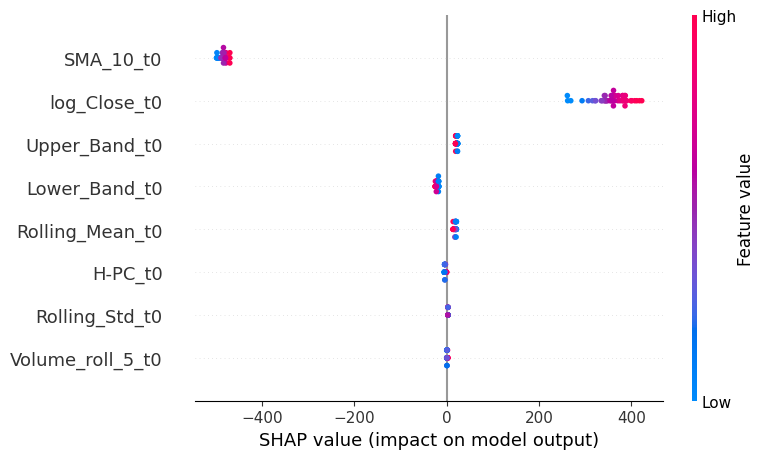

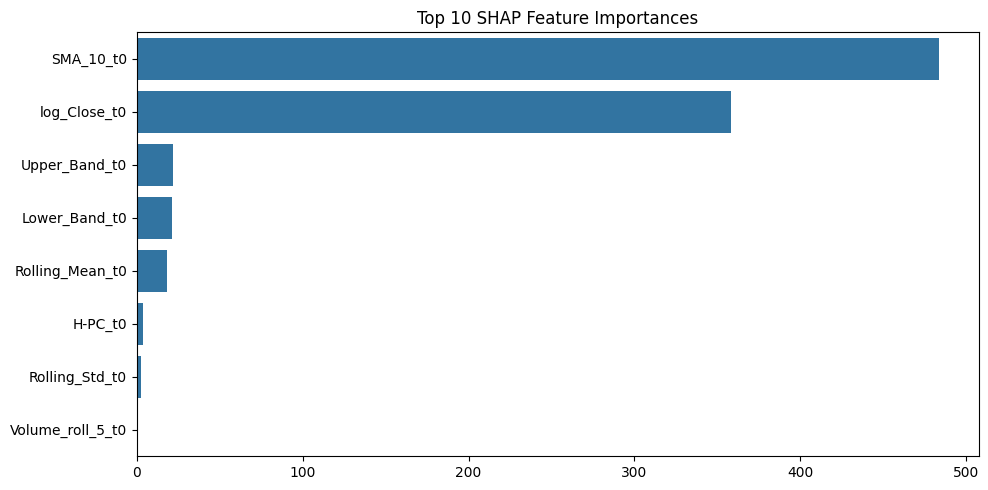

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Bidirectional, LSTM, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Config
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base}/X_train_reg.csv")
X_val   = pd.read_csv(f"{base}/X_val_reg.csv")
X_test  = pd.read_csv(f"{base}/X_test_reg.csv")
y_train = pd.read_csv(f"{base}/y_train_reg.csv").values.ravel()
y_val   = pd.read_csv(f"{base}/y_val_reg.csv").values.ravel()
y_test  = pd.read_csv(f"{base}/y_test_reg.csv").values.ravel()

original_features = X_train.columns.tolist()

# Scale features
scaler = StandardScaler()
X_all = pd.concat([X_train, X_val, X_test], axis=0).values
X_all_scaled = scaler.fit_transform(X_all)
X_train_scaled = X_all_scaled[:len(X_train)]
X_val_scaled = X_all_scaled[len(X_train):len(X_train) + len(X_val)]
X_test_scaled = X_all_scaled[-len(X_test):]

# Reshape for LSTM
X_train_seq = X_train_scaled.reshape((-1, 1, X_train_scaled.shape[1]))
X_val_seq   = X_val_scaled.reshape((-1, 1, X_val_scaled.shape[1]))
X_test_seq  = X_test_scaled.reshape((-1, 1, X_test_scaled.shape[1]))

# Build model
model = Sequential([
    Bidirectional(LSTM(128, return_sequences=False), input_shape=(1, X_train_seq.shape[2])),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)
])
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Callbacks
ckpt_path = f"{models_output}/bilstm_regression_best.keras"
callbacks = [
    ModelCheckpoint(ckpt_path, save_best_only=True),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5)
]

# Train
history = model.fit(
    X_train_seq, y_train,
    validation_data=(X_val_seq, y_val),
    epochs=100,
    batch_size=128,
    callbacks=callbacks,
    verbose=1
)

# Evaluate
y_pred = model.predict(X_test_seq).flatten()
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

metrics_df = pd.DataFrame([{
    "RMSE": rmse, "MAE": mae, "R2": r2, "MAPE (%)": mape
}])
metrics_df.to_csv(f"{models_output}/bilstm_metrics.csv", index=False)

# Print to screen
print("\nModel Evaluation Metrics:")
print(metrics_df.to_string(index=False))

# Loss curve
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label="Train Loss")
plt.plot(history.history['val_loss'], label="Val Loss")
plt.title("BiLSTM Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss (MSE)")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/bilstm_loss_curve.png")
plt.show()

# Zoomed prediction
plt.figure(figsize=(14, 4))
plt.plot(y_test[:300], label="Actual")
plt.plot(y_pred[:300], label="Predicted", linestyle='--')
plt.title("BiLSTM Prediction (First 300 samples)")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/bilstm_zoom.png")
plt.show()

# Full prediction
plt.figure(figsize=(18, 5))
plt.plot(y_test, label="Actual", alpha=0.7)
plt.plot(y_pred, label="Predicted", linestyle='--', alpha=0.7)
plt.title("BiLSTM Prediction (Full Test Set)")
plt.xlabel("Index")
plt.ylabel("Price")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/bilstm_full.png")
plt.show()

# SHAP explanation
model = load_model(ckpt_path)
X_train_flat = X_train_seq.reshape(X_train_seq.shape[0], -1)
X_test_flat = X_test_seq.reshape(X_test_seq.shape[0], -1)

background = X_train_flat[np.random.choice(X_train_flat.shape[0], 100, replace=False)]
test_sample = X_test_flat[:50]
feature_names = [f"{col}_t0" for col in original_features]

def predict_fn(x):
    return model.predict(x.reshape((-1, 1, X_train_seq.shape[2]))).flatten()

explainer = shap.KernelExplainer(predict_fn, background)
shap_values = explainer.shap_values(test_sample)

shap.summary_plot(
    shap_values,
    features=test_sample,
    feature_names=feature_names,
    max_display=10,
    show=False
)
plt.tight_layout()
plt.savefig(f"{models_output}/bilstm_shap_summary.png")
plt.show()

# SHAP bar plot
shap_values_mean = np.mean(np.abs(shap_values), axis=0)
top_indices = np.argsort(shap_values_mean)[::-1][:10]
top_features = [feature_names[i] for i in top_indices]
top_values = shap_values_mean[top_indices]

plt.figure(figsize=(10, 5))
sns.barplot(x=top_values, y=top_features, orient='h')
plt.title("Top 10 SHAP Feature Importances")
plt.tight_layout()
plt.savefig(f"{models_output}/bilstm_shap_bar.png")
plt.show()



#### The BiLSTM regression model delivers exceptional performance with an R² of 0.9955, RMSE of 67.69, and MAPE of just 2.88%, capturing price trends with high precision and strong generalization across both short-term and full test sequences, as supported by SHAP explainability.

#### Bidirectional LSTM for classification task

/home/beast/.local/lib/python3.10/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_1 (Bidirectional) │ (None, 1, 256)         │       142,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 1, 256)         │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1, 256)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ (None, 128)            │       164,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 318,593 (1.22 MB)

 Trainable params: 317,825 (1.21 MB)

 Non-trainable params: 768 (3.00 KB)

Epoch 1/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.6861 - loss: 0.9468 - val_accuracy: 0.7043 - val_loss: 0.6820 - learning_rate: 0.0010
Epoch 2/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7041 - loss: 0.6638 - val_accuracy: 0.7073 - val_loss: 0.6111 - learning_rate: 0.0010
Epoch 3/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7075 - loss: 0.6097 - val_accuracy: 0.7083 - val_loss: 0.5933 - learning_rate: 0.0010
Epoch 4/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7070 - loss: 0.5976 - val_accuracy: 0.7102 - val_loss: 0.5887 - learning_rate: 0.0010
Epoch 5/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7061 - loss: 0.5937 - val_accuracy: 0.7145 - val_loss: 0.5846 - learning_rate: 0.0010
Epoch 6/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7079 - loss: 0.5913 - val_accuracy: 0.7111 - val_loss: 0.5844 - learning_rate: 0.0010
Epoch 7/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7058 - loss: 0.

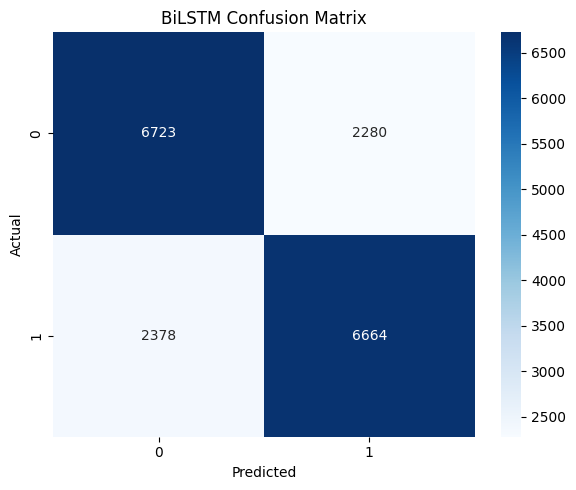

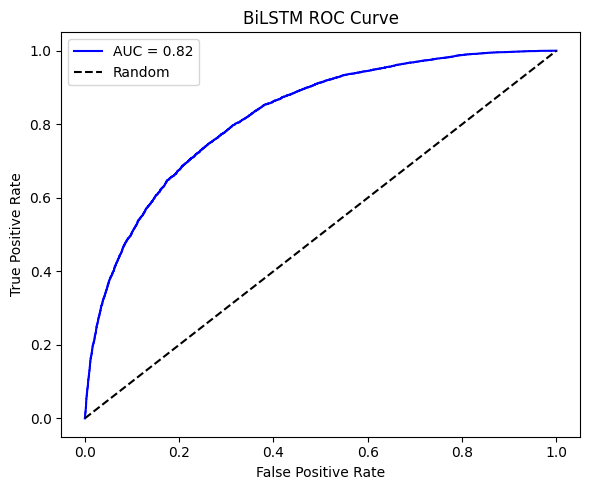

In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_auc_score, roc_curve
)
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Bidirectional, LSTM, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(output_dir, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base}/X_train_cls.csv").values
X_val   = pd.read_csv(f"{base}/X_val_cls.csv").values
X_test  = pd.read_csv(f"{base}/X_test_cls.csv").values
y_train = pd.read_csv(f"{base}/y_train_cls.csv").values.ravel()
y_val   = pd.read_csv(f"{base}/y_val_cls.csv").values.ravel()
y_test  = pd.read_csv(f"{base}/y_test_cls.csv").values.ravel()

# Reshape for LSTM
X_train_seq = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_val_seq   = X_val.reshape((X_val.shape[0], 1, X_val.shape[1]))
X_test_seq  = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Class weights
classes = np.unique(y_train)
class_weights_array = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights = dict(zip(classes, class_weights_array))

# Model architecture
model = Sequential([
    Bidirectional(LSTM(128, return_sequences=True, kernel_regularizer=l2(0.001)), input_shape=(1, X_train.shape[1])),
    BatchNormalization(),
    Dropout(0.4),
    Bidirectional(LSTM(64, kernel_regularizer=l2(0.001))),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu', kernel_regularizer=l2(0.001)),
    Dense(32, activation='relu', kernel_regularizer=l2(0.001)),
    Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

# Callbacks
ckpt_path = os.path.join(output_dir, "bilstm_cls_best.keras")
callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    ModelCheckpoint(ckpt_path, save_best_only=True, monitor='val_loss'),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5)
]

# Training
history = model.fit(
    X_train_seq, y_train,
    validation_data=(X_val_seq, y_val),
    epochs=100,
    batch_size=128,
    class_weight=class_weights,
    callbacks=callbacks,
    verbose=1
)

# Predictions
y_pred_prob = model.predict(X_test_seq).flatten()
y_pred = (y_pred_prob > 0.5).astype(int)

# Evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"Test Accuracy: {accuracy:.4f} | ROC AUC: {roc_auc:.4f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred, digits=4))

# Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title("BiLSTM Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "bilstm_confusion_matrix.png"))
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}", color='blue')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("BiLSTM ROC Curve")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "bilstm_roc_curve.png"))
plt.show()


#### The BiLSTM classification model achieves a balanced performance with AUC of 0.82 and accuracy of 73.88%, effectively capturing temporal dependencies in financial signals with improved recall for "Up-Signal" predictions and robust generalization across both classes.

# GRU Based Model

### GRU Based Model for regression task

Epoch 1/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 7007768.0000 - val_loss: 9233423.0000
Epoch 2/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 3185310.5000 - val_loss: 3330441.0000
Epoch 3/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1239773.8750 - val_loss: 698184.0000
Epoch 4/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 439491.9688 - val_loss: 184332.5312
Epoch 5/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 205250.6719 - val_loss: 79021.1406
Epoch 6/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 126425.9219 - val_loss: 57547.3711
Epoch 7/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 96823.1875 - val_loss: 51712.3672
Epoch 8/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 91994.0781 - val_loss: 48338.0078
Epoch 9/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 84803.9453 - val_loss: 56142.3086
Epoch 10/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 77472.8594 - val_loss: 46994.2031
Epoch 11/100
1

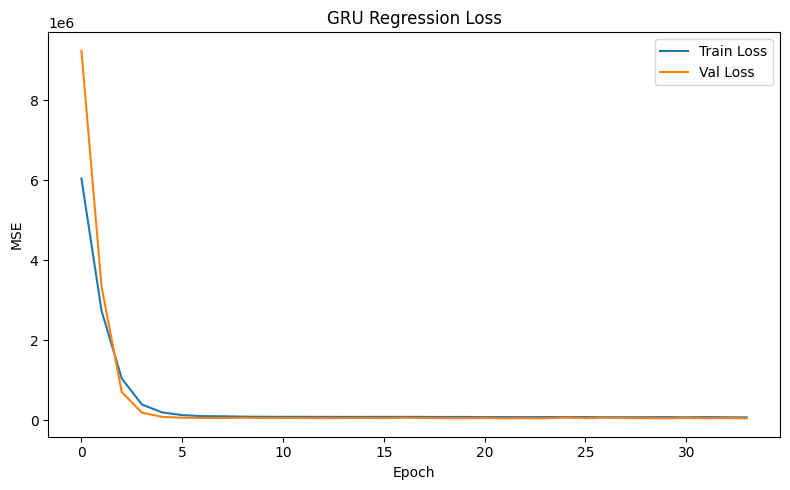

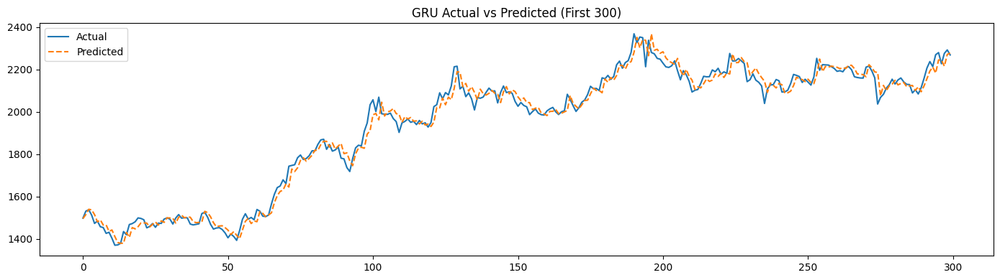

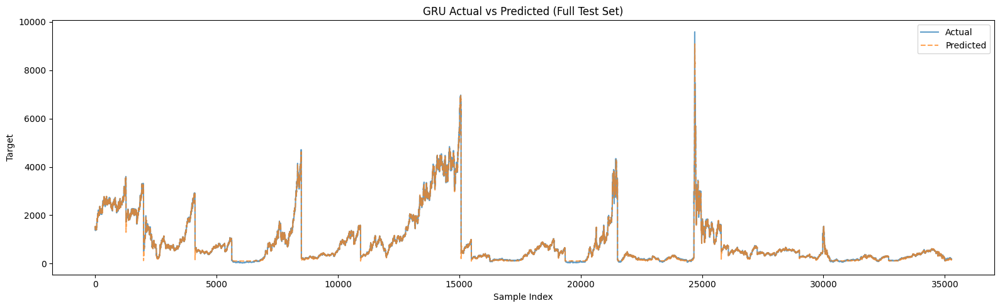

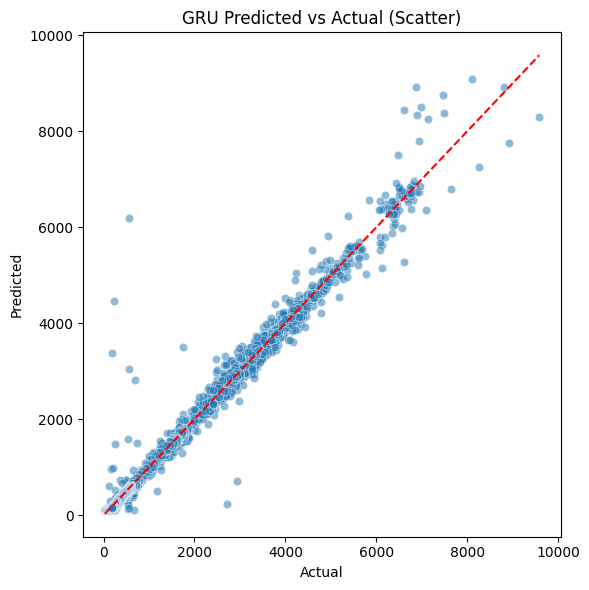

In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GRU, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Seed
np.random.seed(42)
tf.random.set_seed(42)

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base}/X_train_reg.csv")
X_val   = pd.read_csv(f"{base}/X_val_reg.csv")
X_test  = pd.read_csv(f"{base}/X_test_reg.csv")
y_train = pd.read_csv(f"{base}/y_train_reg.csv").values.ravel()
y_val   = pd.read_csv(f"{base}/y_val_reg.csv").values.ravel()
y_test  = pd.read_csv(f"{base}/y_test_reg.csv").values.ravel()
feature_names = X_train.columns.tolist()

# Scale
scaler = StandardScaler()
X_all = pd.concat([X_train, X_val, X_test])
X_scaled = scaler.fit_transform(X_all)
X_train_scaled = X_scaled[:len(X_train)]
X_val_scaled   = X_scaled[len(X_train):len(X_train)+len(X_val)]
X_test_scaled  = X_scaled[-len(X_test):]

# Reshape for GRU
X_train_seq = X_train_scaled.reshape((-1, 1, X_train_scaled.shape[1]))
X_val_seq   = X_val_scaled.reshape((-1, 1, X_val_scaled.shape[1]))
X_test_seq  = X_test_scaled.reshape((-1, 1, X_test_scaled.shape[1]))
timesteps, n_features = X_train_seq.shape[1], X_train_seq.shape[2]

# GRU Model
inputs = Input(shape=(timesteps, n_features))
x = GRU(64)(inputs)
x = Dropout(0.3)(x)
x = Dense(32, activation='relu')(x)
output = Dense(1)(x)
model = Model(inputs, output)
model.compile(optimizer='adam', loss='mse')

# Train
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
history = model.fit(
    X_train_seq, y_train,
    validation_data=(X_val_seq, y_val),
    epochs=100,
    batch_size=128,
    callbacks=[early_stop],
    verbose=1
)

# Save model
model_path = os.path.join(models_output, "gru_regression_model.keras")
model.save(model_path)
print(f"Model saved to: {model_path}")

# Predict
y_pred = model.predict(X_test_seq).flatten()

# Evaluation
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

metrics_df = pd.DataFrame([{
    "RMSE": rmse, "MAE": mae, "R2": r2, "MAPE (%)": mape
}])
metrics_df.to_csv(f"{models_output}/gru_regression_metrics.csv", index=False)

print(f"\nEvaluation:\nRMSE: {rmse:.4f} | MAE: {mae:.4f} | R²: {r2:.4f} | MAPE: {mape:.2f}%")

# Loss Curve
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label="Train Loss")
plt.plot(history.history['val_loss'], label="Val Loss")
plt.title("GRU Regression Loss")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/gru_loss_curve.png")
plt.show()

# Actual vs Predicted (Zoomed, First 300)
plt.figure(figsize=(14, 4))
plt.plot(y_test[:300], label="Actual")
plt.plot(y_pred[:300], label="Predicted", linestyle='--')
plt.title("GRU Actual vs Predicted (First 300)")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/gru_actual_vs_predicted.png")
plt.show()

# Actual vs Predicted (Full)
plt.figure(figsize=(16, 5))
plt.plot(y_test, label="Actual", alpha=0.7)
plt.plot(y_pred, label="Predicted", alpha=0.7, linestyle='--')
plt.title("GRU Actual vs Predicted (Full Test Set)")
plt.xlabel("Sample Index")
plt.ylabel("Target")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/gru_actual_vs_predicted_full.png")
plt.show()

# Predicted vs Actual (Scatter)
plt.figure(figsize=(6, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("GRU Predicted vs Actual (Scatter)")
plt.tight_layout()
plt.savefig(f"{models_output}/gru_predicted_scatter.png")
plt.show()

#### The GRU regression model demonstrates exceptional predictive accuracy with an R² of 0.9952 and RMSE of 69.47, effectively capturing both short- and long-term stock movement patterns with minimal error and strong generalization.

### GRU Based Model for classification task

Epoch 1/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.6973 - loss: 0.5769 - val_accuracy: 0.7404 - val_loss: 0.5255
Epoch 2/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7291 - loss: 0.5386 - val_accuracy: 0.7422 - val_loss: 0.5216
Epoch 3/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7341 - loss: 0.5294 - val_accuracy: 0.7423 - val_loss: 0.5178
Epoch 4/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7373 - loss: 0.5266 - val_accuracy: 0.7411 - val_loss: 0.5187
Epoch 5/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7388 - loss: 0.5235 - val_accuracy: 0.7414 - val_loss: 0.5174
Epoch 6/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7386 - loss: 0.5242 - val_accuracy: 0.7399 - val_loss: 0.5167
Epoch 7/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7380 - loss: 0.5224 - val_accuracy: 0.7429 - val_loss: 0.5164
Epoch 8/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7391 - loss: 0.5219 - val_accu

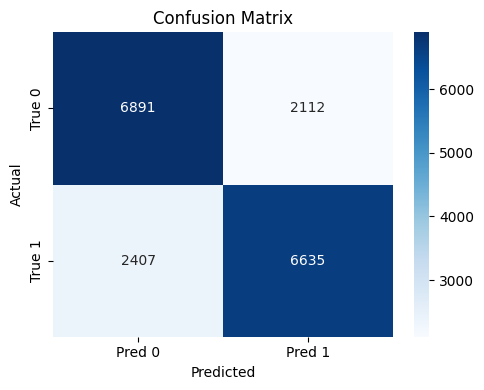

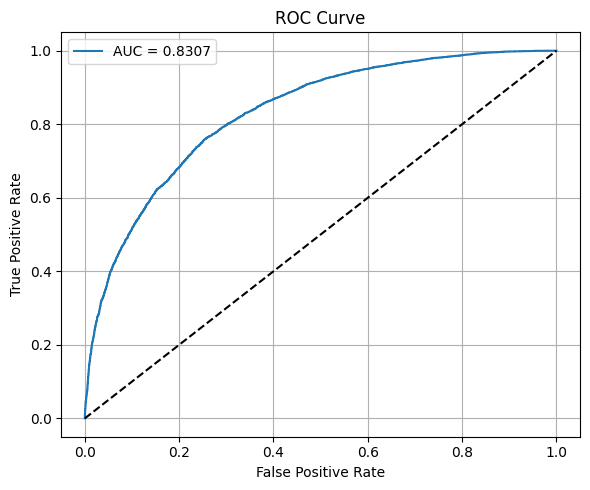

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 598us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 592us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 592us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 585us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 609us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 591us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 587us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 571us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 585us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 597us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 587us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 589us/step
1/1 

/tmp/ipykernel_47150/3904714143.py:147: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, sample, feature_names=shap_feature_names, show=False)


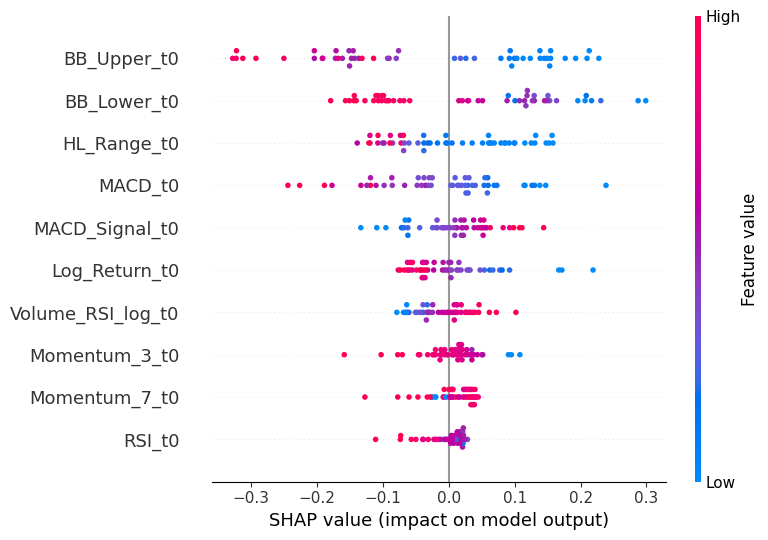

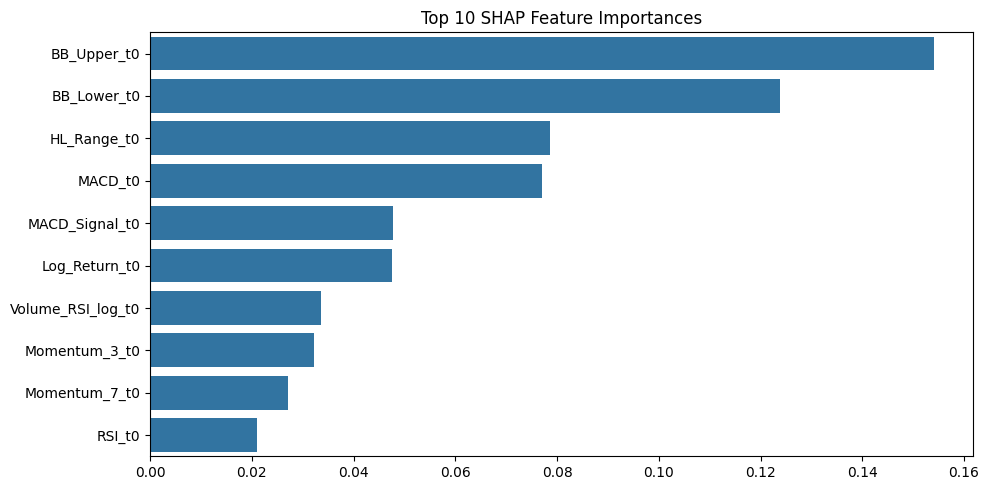

In [5]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GRU, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    confusion_matrix, classification_report, roc_curve
)

# Set random seed
np.random.seed(42)
tf.random.set_seed(42)

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load Data
X_train = pd.read_csv(f"{base}/X_train_cls.csv")
X_val   = pd.read_csv(f"{base}/X_val_cls.csv")
X_test  = pd.read_csv(f"{base}/X_test_cls.csv")
y_train = pd.read_csv(f"{base}/y_train_cls.csv").values.ravel()
y_val   = pd.read_csv(f"{base}/y_val_cls.csv").values.ravel()
y_test  = pd.read_csv(f"{base}/y_test_cls.csv").values.ravel()
feature_names = X_train.columns.tolist()

# Scale Features
scaler = StandardScaler()
X_all = pd.concat([X_train, X_val, X_test])
X_scaled = scaler.fit_transform(X_all)
X_train_scaled = X_scaled[:len(X_train)]
X_val_scaled   = X_scaled[len(X_train):len(X_train)+len(X_val)]
X_test_scaled  = X_scaled[-len(X_test):]

# Reshape for GRU
X_train_seq = X_train_scaled.reshape((-1, 1, X_train_scaled.shape[1]))
X_val_seq   = X_val_scaled.reshape((-1, 1, X_val_scaled.shape[1]))
X_test_seq  = X_test_scaled.reshape((-1, 1, X_test_scaled.shape[1]))

timesteps, n_features = X_train_seq.shape[1], X_train_seq.shape[2]

# Class Weights
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
class_weight_dict = {i: w for i, w in enumerate(class_weights)}

# Build GRU Classification Model
inputs = Input(shape=(timesteps, n_features))
x = GRU(64, return_sequences=False)(inputs)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x = Dense(32, activation='relu')(x)
x = Dropout(0.2)(x)
output = Dense(1, activation='sigmoid')(x)
model = Model(inputs, output)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train Model
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint(f"{models_output}/gru_cls_best.keras", save_best_only=True)

history = model.fit(
    X_train_seq, y_train,
    validation_data=(X_val_seq, y_val),
    epochs=100,
    batch_size=128,
    class_weight=class_weight_dict,
    callbacks=[early_stop, checkpoint],
    verbose=1
)

# Predict
y_pred_probs = model.predict(X_test_seq).flatten()
y_pred = (y_pred_probs >= 0.5).astype(int)

# Evaluation Metrics
acc  = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec  = recall_score(y_test, y_pred)
f1   = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_probs)
cm = confusion_matrix(y_test, y_pred)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print(f"Accuracy: {acc:.4f} | Precision: {prec:.4f} | Recall: {rec:.4f} | F1 Score: {f1:.4f} | ROC AUC: {roc_auc:.4f}")

# Save Metrics
pd.DataFrame([{
    "Accuracy": acc, "Precision": prec, "Recall": rec,
    "F1 Score": f1, "ROC AUC": roc_auc
}]).to_csv(f"{models_output}/gru_cls_metrics.csv", index=False)

# Confusion Matrix Plot
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Pred 0', 'Pred 1'], yticklabels=['True 0', 'True 1'])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.savefig(f"{models_output}/gru_cls_confusion_matrix.png")
plt.show()

# ROC Curve Plot
fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{models_output}/gru_cls_roc_curve.png")
plt.show()

# SHAP Explainability
X_test_flat = X_test_seq.reshape((X_test_seq.shape[0], -1))
X_train_flat = X_train_seq.reshape((X_train_seq.shape[0], -1))
background = X_train_flat[np.random.choice(X_train_flat.shape[0], 100, replace=False)]
sample = X_test_flat[:50]
shap_feature_names = [f"{col}_t0" for col in feature_names]

def predict_fn(x):
    return model.predict(x.reshape(-1, 1, n_features)).flatten()

explainer = shap.KernelExplainer(predict_fn, background)
shap_values = explainer.shap_values(sample)

# SHAP Summary Plot
shap.summary_plot(shap_values, sample, feature_names=shap_feature_names, show=False)
plt.tight_layout()
plt.savefig(f"{models_output}/gru_cls_shap_summary.png")
plt.show()

# SHAP Bar Plot
shap_values_mean = np.mean(np.abs(shap_values), axis=0)
top_indices = np.argsort(shap_values_mean)[::-1][:10]
top_features = [shap_feature_names[i] for i in top_indices]
top_values = shap_values_mean[top_indices]

plt.figure(figsize=(10, 5))
sns.barplot(x=top_values, y=top_features, orient='h')
plt.title("Top 10 SHAP Feature Importances")
plt.tight_layout()
plt.savefig(f"{models_output}/gru_cls_shap_bar.png")
plt.show()


#### The GRU classification model achieved a balanced performance with 75.03% accuracy, F1 score of 0.7467, and a strong ROC AUC of 0.8312, demonstrating reliable discrimination power, while SHAP analysis highlights Bollinger Bands and volatility features as key drivers of prediction.

# Attention-based LSTM Based Model 

### Attention-based LSTM Based Model for regression task

Epoch 1/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 6923565.5000 - val_loss: 8371012.5000
Epoch 2/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 2789528.5000 - val_loss: 2449632.5000
Epoch 3/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 921107.2500 - val_loss: 385444.1250
Epoch 4/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 289921.4062 - val_loss: 112566.1484
Epoch 5/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 132894.6719 - val_loss: 65455.0508
Epoch 6/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 85180.6562 - val_loss: 64977.6211
Epoch 7/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 67333.6953 - val_loss: 51495.7578
Epoch 8/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 62910.8438 - val_loss: 54641.1055
Epoch 9/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 59214.0039 - val_loss: 68298.5547
Epoch 10/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 56816.1094 - val_loss: 49333.9648
Epoch 11/100
128

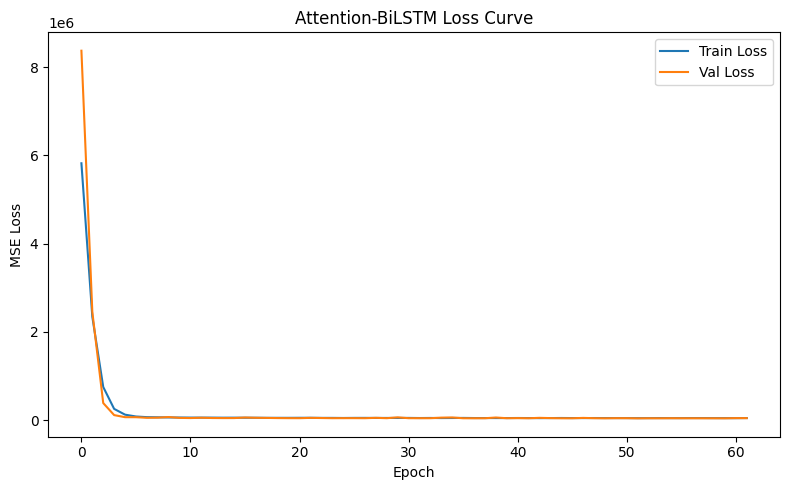

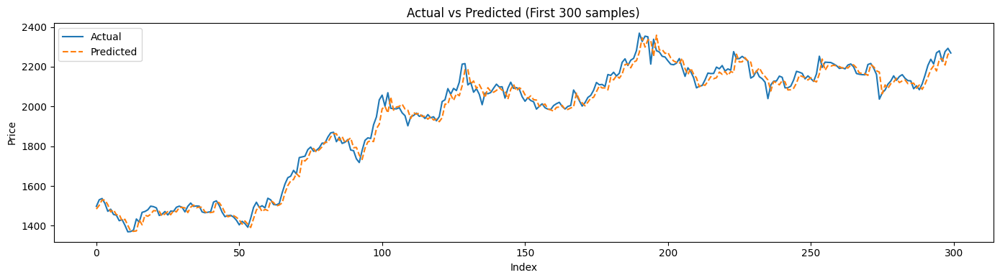

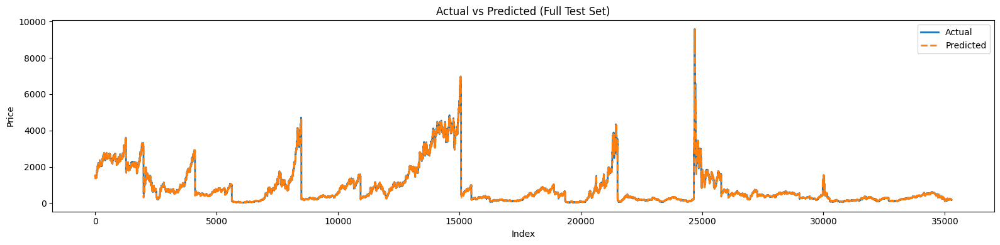

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 765us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 758us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 754us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 769us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 755us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 779us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 775us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 765us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 760us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 766us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37

/tmp/ipykernel_47150/4002878893.py:158: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


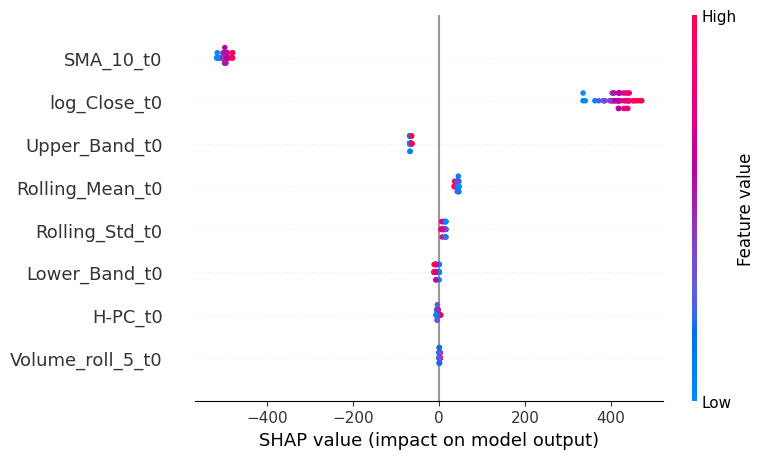

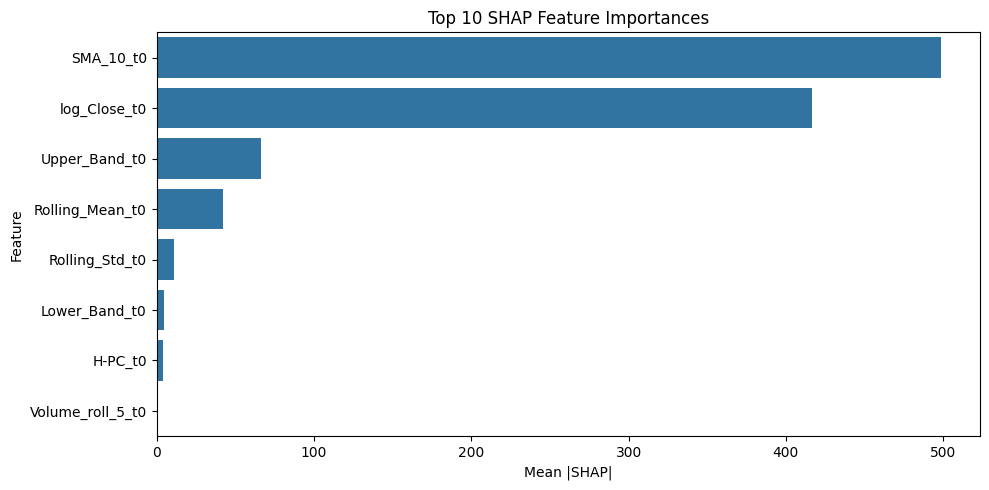

In [6]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dense, Dropout, Layer
from tensorflow.keras.callbacks import EarlyStopping

# Seed
np.random.seed(42)
tf.random.set_seed(42)

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Attention Layer
class Attention(Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.att_dense = tf.keras.layers.Dense(1)

    def call(self, inputs, **kwargs):
        scores = tf.nn.softmax(self.att_dense(inputs), axis=1)
        context = tf.reduce_sum(inputs * scores, axis=1)
        return context

# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load Data
X_train = pd.read_csv(f"{base}/X_train_reg.csv")
X_val   = pd.read_csv(f"{base}/X_val_reg.csv")
X_test  = pd.read_csv(f"{base}/X_test_reg.csv")
y_train = pd.read_csv(f"{base}/y_train_reg.csv").values.ravel()
y_val   = pd.read_csv(f"{base}/y_val_reg.csv").values.ravel()
y_test  = pd.read_csv(f"{base}/y_test_reg.csv").values.ravel()
feature_names = X_train.columns.tolist()

# Scale
scaler = StandardScaler()
X_all = pd.concat([X_train, X_val, X_test])
X_all_scaled = scaler.fit_transform(X_all)
X_train_scaled = X_all_scaled[:len(X_train)]
X_val_scaled   = X_all_scaled[len(X_train):len(X_train)+len(X_val)]
X_test_scaled  = X_all_scaled[-len(X_test):]

# Reshape for LSTM (1 timestep)
X_train_seq = X_train_scaled.reshape((-1, 1, X_train_scaled.shape[1]))
X_val_seq   = X_val_scaled.reshape((-1, 1, X_val_scaled.shape[1]))
X_test_seq  = X_test_scaled.reshape((-1, 1, X_test_scaled.shape[1]))

# Model Architecture
timesteps, n_features = X_train_seq.shape[1], X_train_seq.shape[2]
inputs = Input(shape=(timesteps, n_features))
x = Bidirectional(LSTM(64, return_sequences=True))(inputs)
x = Attention()(x)
x = Dropout(0.3)(x)
x = Dense(32, activation='relu')(x)
output = Dense(1)(x)

model = Model(inputs, output)
model.compile(loss='mse', optimizer='adam')

# Train
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
history = model.fit(
    X_train_seq, y_train,
    validation_data=(X_val_seq, y_val),
    epochs=100,
    batch_size=128,
    callbacks=[early_stop],
    verbose=1
)

# Save model
model_path = os.path.join(models_output, "attention_bilstm_model.keras")
model.save(model_path)

# Predict
y_pred = model.predict(X_test_seq).flatten()

# Metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Save Metrics
metrics_df = pd.DataFrame([{
    "RMSE": rmse, "MAE": mae, "R2": r2, "MAPE (%)": mape
}])
metrics_df.to_csv(f"{models_output}/attention_bilstm_metrics.csv", index=False)
print(metrics_df)

# Loss Curve
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("Attention-BiLSTM Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/attention_bilstm_loss_curve.png")
plt.show()

# Actual vs Predicted (Zoomed)
plt.figure(figsize=(14, 4))
plt.plot(y_test[:300], label="Actual")
plt.plot(y_pred[:300], label="Predicted", linestyle='--')
plt.title("Actual vs Predicted (First 300 samples)")
plt.xlabel("Index")
plt.ylabel("Price")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/attention_bilstm_actual_vs_predicted_zoom.png")
plt.show()

# Actual vs Predicted (Full)
plt.figure(figsize=(16, 4))
plt.plot(y_test, label="Actual", linewidth=2)
plt.plot(y_pred, label="Predicted", linestyle='--', linewidth=2)
plt.title("Actual vs Predicted (Full Test Set)")
plt.xlabel("Index")
plt.ylabel("Price")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/attention_bilstm_actual_vs_predicted_full.png")
plt.show()

# SHAP Explainability
X_train_flat = X_train_seq.reshape((X_train_seq.shape[0], -1))
X_test_flat = X_test_seq.reshape((X_test_seq.shape[0], -1))
shap_feature_names = [f"{col}_t0" for col in feature_names]

background = X_train_flat[np.random.choice(len(X_train_flat), 100, replace=False)]
test_sample = X_test_flat[:50]

def predict_fn(x):
    return model.predict(x.reshape((-1, 1, n_features))).flatten()

explainer = shap.KernelExplainer(predict_fn, background)
shap_values = explainer.shap_values(test_sample)

# SHAP Summary Plot
shap.summary_plot(
    shap_values,
    features=test_sample,
    feature_names=shap_feature_names,
    max_display=10,
    show=False
)
plt.tight_layout()
plt.savefig(f"{models_output}/attention_bilstm_shap_summary.png")
plt.show()

# SHAP Bar Plot
shap_df = pd.DataFrame({
    'Feature': shap_feature_names,
    'Mean |SHAP|': np.abs(shap_values).mean(axis=0)
}).sort_values(by='Mean |SHAP|', ascending=False).head(10)

plt.figure(figsize=(10, 5))
sns.barplot(x='Mean |SHAP|', y='Feature', data=shap_df, orient='h')
plt.title("Top 10 SHAP Feature Importances")
plt.tight_layout()
plt.savefig(f"{models_output}/attention_bilstm_shap_bar.png")
plt.show()

#### The Attention-BiLSTM model delivers highly accurate predictions with minimal error (RMSE ≈ 72.07, R² ≈ 0.995), effectively capturing price trends and key features like SMA_10 and log_Close as dominant drivers.

### Attention-BiLSTM for Classification task

Epoch 1/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.6506 - loss: 0.6667 - val_accuracy: 0.7306 - val_loss: 0.5457
Epoch 2/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7047 - loss: 0.5760 - val_accuracy: 0.7350 - val_loss: 0.5375
Epoch 3/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7146 - loss: 0.5651 - val_accuracy: 0.7365 - val_loss: 0.5340
Epoch 4/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7193 - loss: 0.5547 - val_accuracy: 0.7391 - val_loss: 0.5308
Epoch 5/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7245 - loss: 0.5493 - val_accuracy: 0.7399 - val_loss: 0.5291
Epoch 6/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7248 - loss: 0.5491 - val_accuracy: 0.7411 - val_loss: 0.5275
Epoch 7/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7279 - loss: 0.5432 - val_accuracy: 0.7412 - val_loss: 0.5263
Epoch 8/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7294 - loss: 0.5433 - val_accu

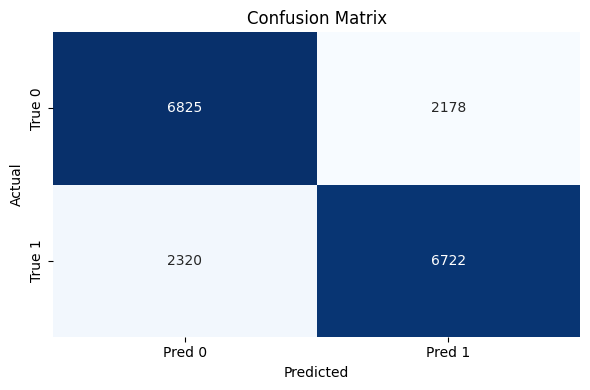

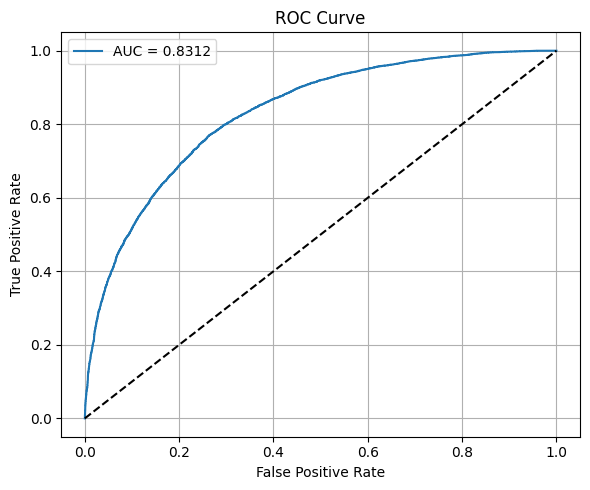

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 978us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 983us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 957us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 980us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 976us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 974us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 807us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 807us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 805us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 811us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 801us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 819us/step
1/1 

/tmp/ipykernel_47150/1053905147.py:162: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, sample, feature_names=shap_feature_names, show=False)


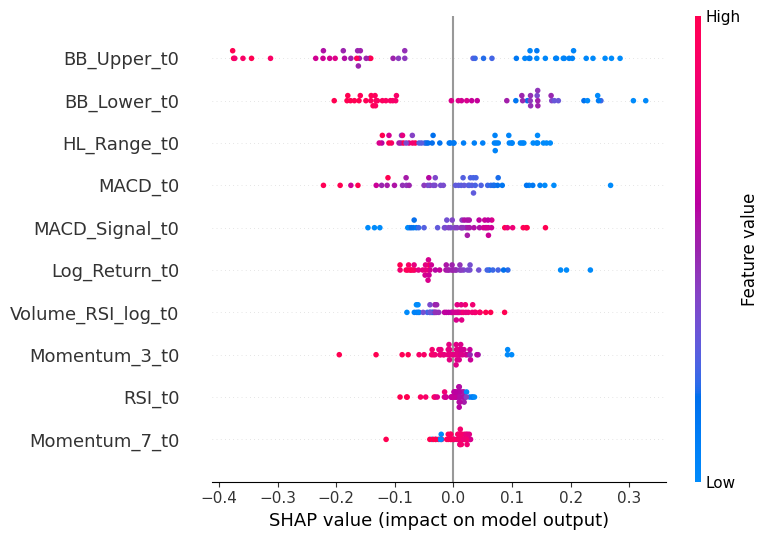

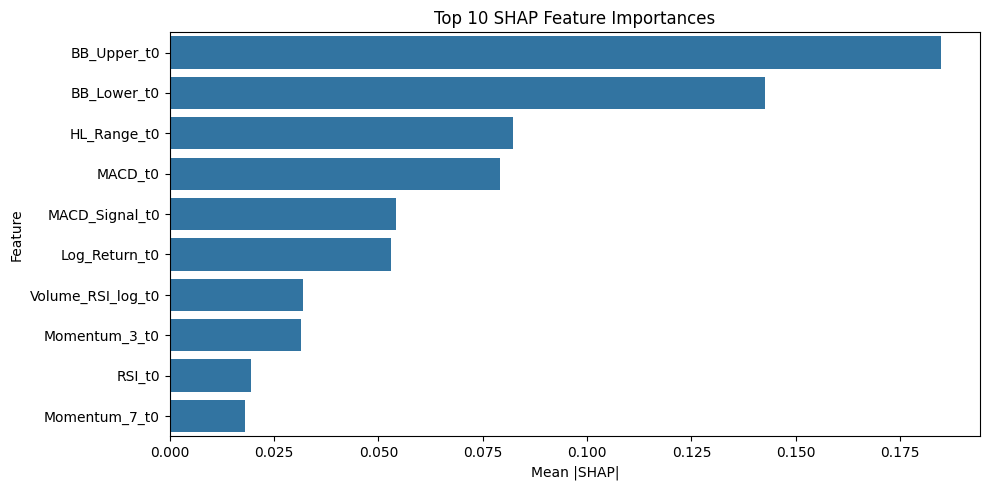

In [7]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import tensorflow as tf
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_auc_score, roc_curve,
    accuracy_score, precision_score, recall_score, f1_score
)
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dense, Dropout, Layer, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Memory Cleanup Function
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")
    
# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(output_dir, exist_ok=True)

# Load data
X_train = pd.read_csv(f"{base}/X_train_cls.csv")
X_val = pd.read_csv(f"{base}/X_val_cls.csv")
X_test = pd.read_csv(f"{base}/X_test_cls.csv")
y_train = pd.read_csv(f"{base}/y_train_cls.csv").values.ravel()
y_val = pd.read_csv(f"{base}/y_val_cls.csv").values.ravel()
y_test = pd.read_csv(f"{base}/y_test_cls.csv").values.ravel()

# Feature names
feature_names = X_train.columns.tolist()

# Preprocessing
scaler = StandardScaler()
X_all = pd.concat([X_train, X_val, X_test])
X_scaled = scaler.fit_transform(X_all)
X_train_scaled = X_scaled[:len(X_train)]
X_val_scaled = X_scaled[len(X_train):len(X_train)+len(X_val)]
X_test_scaled = X_scaled[-len(X_test):]

# Reshape
X_train_seq = X_train_scaled.reshape((-1, 1, X_train.shape[1]))
X_val_seq = X_val_scaled.reshape((-1, 1, X_val.shape[1]))
X_test_seq = X_test_scaled.reshape((-1, 1, X_test.shape[1]))
timesteps, n_features = X_train_seq.shape[1], X_train_seq.shape[2]

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {i: w for i, w in enumerate(class_weights)}

# Attention Layer
class Attention(Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.att_dense = tf.keras.layers.Dense(1)

    def call(self, inputs, **kwargs):
        scores = tf.nn.softmax(self.att_dense(inputs), axis=1)
        context = tf.reduce_sum(inputs * scores, axis=1)
        return context

# Model architecture
inputs = Input(shape=(timesteps, n_features))
x = Bidirectional(LSTM(64, return_sequences=True))(inputs)
x = BatchNormalization()(x)
x = Attention()(x)
x = Dropout(0.3)(x)
x = Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
x = Dropout(0.2)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs, output)
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint(f"{output_dir}/attention_bilstm_cls_best.keras", save_best_only=True)

# Training
history = model.fit(
    X_train_seq, y_train,
    validation_data=(X_val_seq, y_val),
    epochs=100,
    batch_size=128,
    class_weight=class_weight_dict,
    callbacks=[early_stop, checkpoint],
    verbose=1
)

# Predictions
y_pred_probs = model.predict(X_test_seq).flatten()
y_pred = (y_pred_probs >= 0.5).astype(int)

# Evaluation
acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_probs)
cm = confusion_matrix(y_test, y_pred)

# Save metrics
metrics_df = pd.DataFrame([{
    "Accuracy": acc, "Precision": prec, "Recall": rec,
    "F1 Score": f1, "ROC AUC": roc_auc
}])
metrics_df.to_csv(f"{output_dir}/attention_bilstm_cls_metrics.csv", index=False)

# Save classification report
report_df = pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose()
report_df.to_csv(f"{output_dir}/attention_bilstm_cls_classification_report.csv")

# Confusion matrix plot
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Pred 0', 'Pred 1'], yticklabels=['True 0', 'True 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig(f"{output_dir}/attention_bilstm_cls_confusion_matrix.png")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{output_dir}/attention_bilstm_cls_roc_curve.png")
plt.show()

# SHAP
X_test_flat = X_test_seq.reshape((X_test_seq.shape[0], -1))
X_train_flat = X_train_seq.reshape((X_train_seq.shape[0], -1))
background = X_train_flat[np.random.choice(X_train_flat.shape[0], 100, replace=False)]
sample = X_test_flat[:50]
shap_feature_names = [f"{col}_t0" for col in feature_names]

def predict_fn(x):
    reshaped = x.reshape(-1, 1, n_features)
    return model.predict(reshaped).flatten()

explainer = shap.KernelExplainer(predict_fn, background)
shap_values = explainer.shap_values(sample)

# SHAP Summary Plot
shap.summary_plot(shap_values, sample, feature_names=shap_feature_names, show=False)
plt.tight_layout()
plt.savefig(f"{output_dir}/attention_bilstm_cls_shap_summary.png")
plt.show()

# SHAP Bar Plot
shap_df = pd.DataFrame({
    'Feature': shap_feature_names,
    'Mean |SHAP|': np.abs(shap_values).mean(axis=0)
}).sort_values(by='Mean |SHAP|', ascending=False).head(10)

plt.figure(figsize=(10, 5))
sns.barplot(x='Mean |SHAP|', y='Feature', data=shap_df)
plt.title("Top 10 SHAP Feature Importances")
plt.tight_layout()
plt.savefig(f"{output_dir}/attention_bilstm_cls_shap_bar.png")
plt.show()


#### The Attention-BiLSTM classification model achieved strong performance with an AUC of 0.8312, balanced precision/recall, and highlighted BB_Upper, BB_Lower, and HL_Range as the most influential features according to SHAP analysis.

# Transformer Based Model for Regression task 

Epoch 1/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 7932290.0000 - mae: 1287.1724 - val_loss: 15276462.0000 - val_mae: 1503.6245
Epoch 2/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 7825680.5000 - mae: 1245.8146 - val_loss: 15026471.0000 - val_mae: 1421.5580
Epoch 3/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 7582627.5000 - mae: 1156.6703 - val_loss: 14610694.0000 - val_mae: 1289.8748
Epoch 4/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 7218240.5000 - mae: 1029.7620 - val_loss: 14079336.0000 - val_mae: 1142.4559
Epoch 5/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 6780958.0000 - mae: 908.9112 - val_loss: 13471692.0000 - val_mae: 1021.9004
Epoch 6/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 6306542.0000 - mae: 800.9377 - val_loss: 12809096.0000 - val_mae: 922.8849
Epoch 7/100
1287/1287 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 5822765.0000 - mae: 713.9062 - val_loss: 12099757.0000 - val_mae: 863.5002
Epoch 8/100
1287/1287 ━━

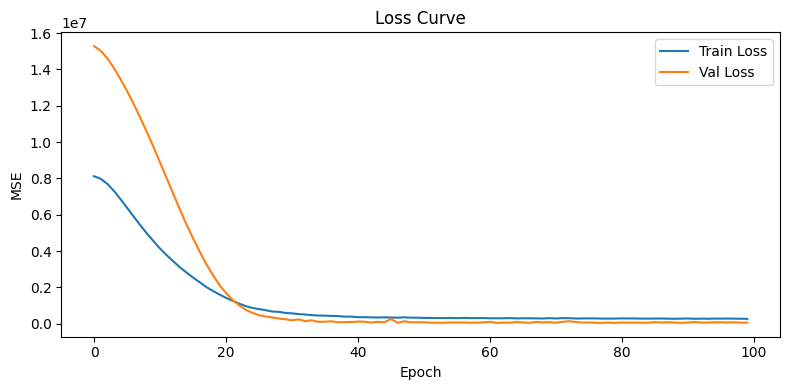

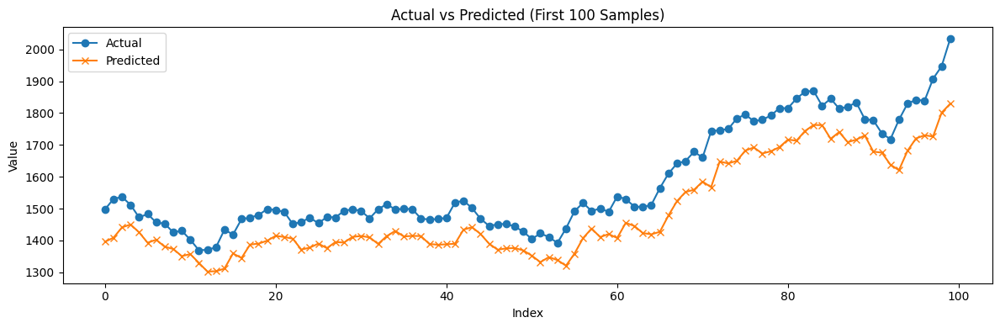

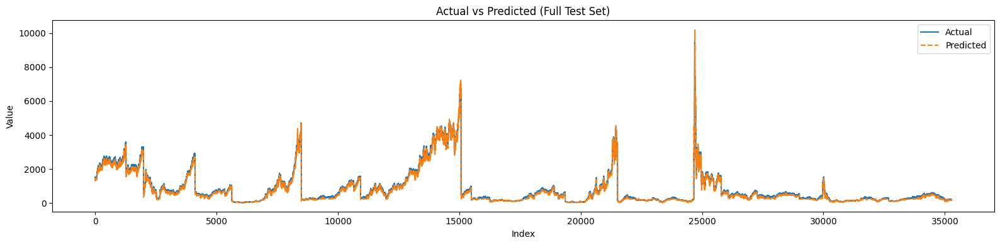

In [23]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import shap
import joblib
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Dense, Dropout, LayerNormalization, Add,
    GlobalAveragePooling1D, MultiHeadAttention
)
from tensorflow.keras.optimizers import Adam

# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load Data
X_train = pd.read_csv(f"{base}/X_train_reg.csv")
X_val   = pd.read_csv(f"{base}/X_val_reg.csv")
X_test  = pd.read_csv(f"{base}/X_test_reg.csv")
y_train = pd.read_csv(f"{base}/y_train_reg.csv").values.ravel()
y_val   = pd.read_csv(f"{base}/y_val_reg.csv").values.ravel()
y_test  = pd.read_csv(f"{base}/y_test_reg.csv").values.ravel()
feature_names = X_train.columns.tolist()

# Scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val   = scaler.transform(X_val)
X_test  = scaler.transform(X_test)

# Reshape for Transformer
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_val   = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
X_test  = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
timesteps, n_features = X_train.shape[1], X_train.shape[2]

# Positional Encoding
class PositionalEncoding(tf.keras.layers.Layer):
    def call(self, x):
        seq_len = tf.shape(x)[1]
        d_model = tf.shape(x)[2]
        position = tf.cast(tf.range(seq_len)[:, tf.newaxis], dtype=tf.float32)
        div_term = tf.pow(10000.0, tf.cast(tf.range(d_model)[tf.newaxis, :] // 2 * 2, tf.float32) / tf.cast(d_model, tf.float32))
        angle_rads = position / div_term
        sines = tf.sin(angle_rads[:, 0::2])
        cosines = tf.cos(angle_rads[:, 1::2])
        pos_encoding = tf.concat([sines, cosines], axis=-1)
        pos_encoding = tf.expand_dims(pos_encoding, 0)
        return x + tf.cast(pos_encoding, dtype=tf.float32)

# Transformer Encoder
def transformer_encoder(inputs, head_size=64, num_heads=4, ff_dim=128, dropout=0.1):
    x = PositionalEncoding()(inputs)
    x = MultiHeadAttention(num_heads=num_heads, key_dim=head_size)(x, x)
    x = Dropout(dropout)(x)
    x = Add()([x, inputs])
    x = LayerNormalization(epsilon=1e-6)(x)
    ff = Dense(ff_dim, activation="relu")(x)
    ff = Dense(inputs.shape[-1])(ff)
    x = Add()([x, ff])
    x = LayerNormalization(epsilon=1e-6)(x)
    return x

# Build Model
inputs = Input(shape=(timesteps, n_features))
x = transformer_encoder(inputs)
x = GlobalAveragePooling1D()(x)
x = Dropout(0.2)(x)
x = Dense(64, activation="relu")(x)
x = Dropout(0.2)(x)
output = Dense(1)(x)
model = Model(inputs, output)
model.compile(optimizer=Adam(learning_rate=1e-4), loss="mse", metrics=["mae"])

# Train Model
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=128,
    verbose=1
)

# Save model and weights
model.save(f"{models_output}/transformer_regression_final.keras")
print("Model saved.")

# Predict
y_pred = model.predict(X_test).flatten()

# Metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

metrics_df = pd.DataFrame([{
    "RMSE": rmse, "MAE": mae, "R2": r2, "MAPE (%)": mape
}])
metrics_df.to_csv(f"{models_output}/transformer_regression_metrics.csv", index=False)
print("\nEvaluation Metrics:\n", metrics_df)

# Plot Loss Curve
plt.figure(figsize=(8, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/transformer_loss_curve.png")
plt.show()

# Actual vs Predicted (Zoomed)
plt.figure(figsize=(12, 4))
plt.plot(y_test[:100], label="Actual", marker='o')
plt.plot(y_pred[:100], label="Predicted", marker='x')
plt.title("Actual vs Predicted (First 100 Samples)")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/transformer_actual_vs_predicted_zoom.png")
plt.show()

# Actual vs Predicted (Full)
plt.figure(figsize=(16, 4))
plt.plot(y_test, label="Actual")
plt.plot(y_pred, label="Predicted", linestyle='--')
plt.title("Actual vs Predicted (Full Test Set)")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend()
plt.tight_layout()
plt.savefig(f"{models_output}/transformer_actual_vs_predicted_full.png")
plt.show()

#### Transformer-based regression model achieved high prediction accuracy with R² = 0.987, RMSE = 113, and MAE = 75.9, indicating that it captures over 98% of the variance in the NIFTY50 price movements, with closely aligned actual vs predicted values across both short- and long-term trends.

#  Transformer Based Model for Classification task 

Memory cleared.
Epoch 1/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - AUC: 0.6527 - accuracy: 0.6133 - loss: 0.6696 - val_AUC: 0.7970 - val_accuracy: 0.7236 - val_loss: 0.5517 - learning_rate: 1.0000e-04
Epoch 2/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7554 - accuracy: 0.6993 - loss: 0.5908 - val_AUC: 0.8020 - val_accuracy: 0.7285 - val_loss: 0.5441 - learning_rate: 1.0000e-04
Epoch 3/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7646 - accuracy: 0.7045 - loss: 0.5814 - val_AUC: 0.8049 - val_accuracy: 0.7286 - val_loss: 0.5410 - learning_rate: 1.0000e-04
Epoch 4/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7748 - accuracy: 0.7115 - loss: 0.5728 - val_AUC: 0.8086 - val_accuracy: 0.7342 - val_loss: 0.5369 - learning_rate: 1.0000e-04
Epoch 5/100
658/658 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7788 - accuracy: 0.7137 - loss: 0.5678 - val_AUC: 0.8101 - val_accuracy: 0.7356 - val_loss: 0.5346 - learning_rate: 1.0000e-04
Epoch 6/100
658/658 ━━━━━━━━━━━━━━━━━━

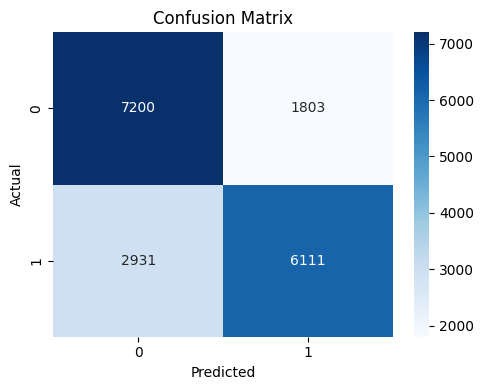

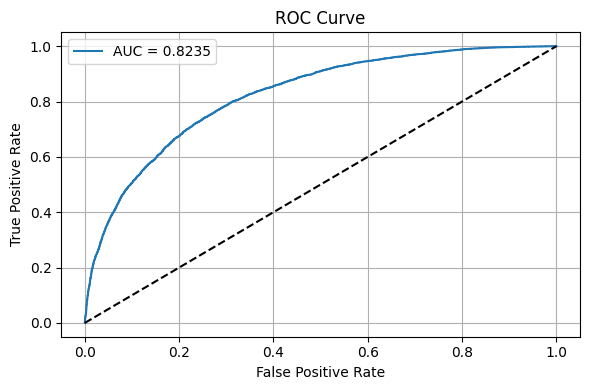

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 800us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 691us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 743us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 694us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 912us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 839us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 818us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 761us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 814us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 3s 778us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 766us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3194/3194 ━━━━━━━━━━━━━━━━━━━━ 2s 742us/step
1/1

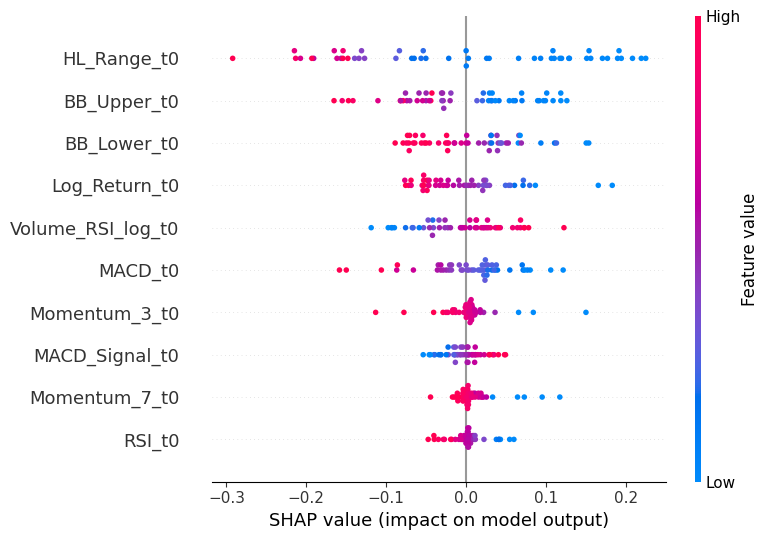

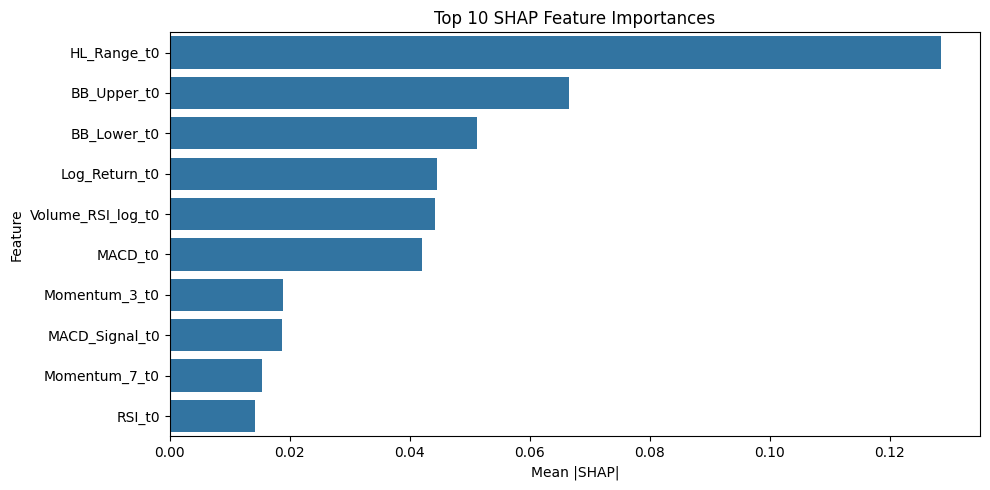

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Intercept 0.5921697365832013
Prediction_local [-0.03264425]
Right: 0.24052869


LIME explanation saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/transformer_cls_lime_sample_5.html


In [25]:
import os
import gc
import torch
import shap
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, Layer, LayerNormalization, GlobalAveragePooling1D, MultiHeadAttention
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import register_keras_serializable
import lime
from lime.lime_tabular import LimeTabularExplainer

# Cleanup
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")

clear_memory()

# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
models_output = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output"
os.makedirs(models_output, exist_ok=True)

# Load Data
X_train = pd.read_csv(f"{base}/X_train_cls.csv")
X_val = pd.read_csv(f"{base}/X_val_cls.csv")
X_test = pd.read_csv(f"{base}/X_test_cls.csv")
y_train = pd.read_csv(f"{base}/y_train_cls.csv").values.ravel()
y_val = pd.read_csv(f"{base}/y_val_cls.csv").values.ravel()
y_test = pd.read_csv(f"{base}/y_test_cls.csv").values.ravel()
feature_names = X_train.columns.tolist()

# Standardization
scaler = StandardScaler()
X_all = pd.concat([X_train, X_val, X_test])
X_all_scaled = scaler.fit_transform(X_all)
X_train_scaled = X_all_scaled[:len(X_train)]
X_val_scaled = X_all_scaled[len(X_train):len(X_train)+len(X_val)]
X_test_scaled = X_all_scaled[-len(X_test):]

# Reshape to 3D
X_train_seq = X_train_scaled.reshape((-1, 1, X_train_scaled.shape[1]))
X_val_seq = X_val_scaled.reshape((-1, 1, X_val_scaled.shape[1]))
X_test_seq = X_test_scaled.reshape((-1, 1, X_test_scaled.shape[1]))
timesteps, n_features = X_train_seq.shape[1], X_train_seq.shape[2]

# Class Weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {i: w for i, w in enumerate(class_weights)}

# Registerable Positional Encoding
@register_keras_serializable()
class PositionalEncoding(Layer):
    def call(self, x):
        seq_len = tf.shape(x)[1]
        d_model = tf.shape(x)[2]
        pos = tf.cast(tf.range(seq_len)[:, tf.newaxis], tf.float32)
        i = tf.cast(tf.range(d_model)[tf.newaxis, :], tf.float32)
        angle_rates = 1 / tf.pow(10000., (2 * (i // 2)) / tf.cast(d_model, tf.float32))
        angle_rads = pos * angle_rates
        sines = tf.sin(angle_rads[:, 0::2])
        cosines = tf.cos(angle_rads[:, 1::2])
        pos_encoding = tf.concat([sines, cosines], axis=-1)
        pos_encoding = tf.expand_dims(pos_encoding, axis=0)
        return x + pos_encoding

# Transformer Block
def transformer_encoder(inputs, head_size=64, num_heads=4, ff_dim=128, dropout=0.3):
    x = PositionalEncoding()(inputs)
    attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=head_size)(x, x)
    x = Dropout(dropout)(attn_output)
    x = LayerNormalization(epsilon=1e-6)(x)
    ffn = Dense(ff_dim, activation="relu")(x)
    ffn = Dropout(dropout)(ffn)
    ffn_output = Dense(inputs.shape[-1])(ffn)
    return LayerNormalization(epsilon=1e-6)(x + ffn_output)

# Build Model
inputs = Input(shape=(timesteps, n_features))
x = transformer_encoder(inputs, dropout=0.3)
x = GlobalAveragePooling1D()(x)
x = Dropout(0.4)(x)
x = Dense(64, activation="relu")(x)
x = Dropout(0.3)(x)
outputs = Dense(1, activation="sigmoid")(x)

model = Model(inputs, outputs)
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss="binary_crossentropy",
              metrics=["accuracy", tf.keras.metrics.AUC(name="AUC")])

# Callbacks
early_stop = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint(f"{models_output}/transformer_cls_best.keras", save_best_only=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Train
history = model.fit(
    X_train_seq, y_train,
    validation_data=(X_val_seq, y_val),
    epochs=100,
    batch_size=128,
    class_weight=class_weight_dict,
    callbacks=[early_stop, checkpoint, lr_scheduler],
    verbose=1
)

# Save final model
model.save(f"{models_output}/transformer_cls_final.keras")

# Predict
y_probs = model.predict(X_test_seq).flatten()
y_pred = (y_probs >= 0.5).astype(int)

# Evaluation
acc = tf.keras.metrics.binary_accuracy(y_test, y_pred).numpy().mean()
roc_auc = roc_auc_score(y_test, y_probs)
report = classification_report(y_test, y_pred, output_dict=True)
cm = confusion_matrix(y_test, y_pred)

pd.DataFrame([{
    "Accuracy": acc,
    "ROC AUC": roc_auc,
    "Precision": report['1']['precision'],
    "Recall": report['1']['recall'],
    "F1 Score": report['1']['f1-score']
}]).to_csv(f"{models_output}/transformer_cls_metrics.csv", index=False)

plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.savefig(f"{models_output}/transformer_cls_confusion_matrix.png")
plt.show()

fpr, tpr, _ = roc_curve(y_test, y_probs)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{models_output}/transformer_cls_roc_curve.png")
plt.show()

# SHAP
X_test_flat = X_test_seq.reshape((X_test_seq.shape[0], -1))
X_train_flat = X_train_seq.reshape((X_train_seq.shape[0], -1))
shap_feature_names = [f"{col}_t0" for col in feature_names]

background = X_train_flat[np.random.choice(X_train_flat.shape[0], 100, replace=False)]
sample = X_test_flat[:50]

def predict_fn(x):
    return model.predict(x.reshape((-1, 1, n_features))).flatten()

explainer = shap.KernelExplainer(predict_fn, background)
shap_values = explainer.shap_values(sample)

shap.summary_plot(shap_values, sample, feature_names=shap_feature_names, show=False)
plt.tight_layout()
plt.savefig(f"{models_output}/transformer_cls_shap_summary.png")
plt.show()

shap_df = pd.DataFrame({
    'Feature': shap_feature_names,
    'Mean |SHAP|': np.abs(shap_values).mean(axis=0)
}).sort_values(by='Mean |SHAP|', ascending=False).head(10)

plt.figure(figsize=(10, 5))
sns.barplot(x="Mean |SHAP|", y="Feature", data=shap_df)
plt.title("Top 10 SHAP Feature Importances")
plt.tight_layout()
plt.savefig(f"{models_output}/transformer_cls_shap_bar.png")
plt.show()

# LIME
X_test_flat = X_test_seq.reshape((X_test_seq.shape[0], -1))
X_train_flat = X_train_seq.reshape((X_train_seq.shape[0], -1))

lime_explainer = LimeTabularExplainer(
    training_data=X_train_flat,
    mode="classification",
    feature_names=shap_feature_names,
    class_names=["Class 0", "Class 1"],
    discretize_continuous=True,
    verbose=True
)

lime_sample_idx = 5
lime_sample = X_test_flat[lime_sample_idx]

def lime_predict(x):
    preds = model.predict(x.reshape(-1, 1, n_features))
    return np.hstack([(1 - preds), preds])

lime_exp = lime_explainer.explain_instance(
    lime_sample,
    lime_predict,
    num_features=10
)

lime_exp.show_in_notebook()
lime_html_path = f"{models_output}/transformer_cls_lime_sample_{lime_sample_idx}.html"
lime_exp.save_to_file(lime_html_path)
print(f"LIME explanation saved to: {lime_html_path}")

#### Transformer model is performing well, showing a solid ability to distinguish between classes with an AUC of 0.825. The most influential features—like HL_Range_t0, BB_Upper_t0, and Log_Return_t0 suggest that your feature engineering is effectively capturing meaningful market signals that the model can learn from.

# DistilBERT Based Models

In [ ]:
! pip install transformers datasets scikit-learn torch


# DistilBERT Model for classification task

In [1]:
import os
import gc
import torch
import pandas as pd
import numpy as np
import matplotlib
matplotlib.use("Agg")  # Important for saving plots in headless environments
import matplotlib.pyplot as plt
from datasets import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from transformers import (
    DistilBertTokenizer,
    DistilBertForSequenceClassification,
    Trainer,
    TrainingArguments,
    DataCollatorWithPadding
)

# Memory Cleanup
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")

# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls"
os.makedirs(output_dir, exist_ok=True)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using:", device)

# Load Data
X = pd.read_csv(os.path.join(base, "X_train_cls.csv"))
y = pd.read_csv(os.path.join(base, "y_train_cls.csv")).squeeze()

# Convert tabular to text
X["text"] = X.apply(lambda row: " | ".join([f"{col}: {row[col]}" for col in row.index]), axis=1)
data = pd.DataFrame({"text": X["text"], "label": y})

# Split
train_df, val_df = train_test_split(data, test_size=0.2, stratify=data["label"], random_state=42)

# Tokenization
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
def tokenize_function(batch):
    return tokenizer(batch["text"], truncation=True, padding=True, max_length=64)

train_dataset = Dataset.from_pandas(train_df).map(tokenize_function, batched=True).remove_columns(["text"])
val_dataset = Dataset.from_pandas(val_df).map(tokenize_function, batched=True).remove_columns(["text"])

# Model
model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=2)
model.to(device)

# Training Arguments
training_args = TrainingArguments(
    output_dir=output_dir,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    num_train_epochs=2,
    learning_rate=2e-5,
    save_strategy="no",
    logging_dir=os.path.join(output_dir, "logs"),
    disable_tqdm=False,
    logging_strategy="steps",
    logging_steps=10,
    report_to="none",
    fp16=torch.cuda.is_available(),
)

# Metrics Function
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=1)
    acc = accuracy_score(labels, preds)
    return {"accuracy": acc}

# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=DataCollatorWithPadding(tokenizer),
    compute_metrics=compute_metrics
)

# Train
trainer.train()

#  Save Model Weights
model_path = os.path.join(output_dir, "distilbert_cls_weights.pt")
model.to("cpu")
torch.save(model.state_dict(), model_path)
print("Model weights saved to:", model_path)


2025-08-03 13:41:59.601800: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-03 13:41:59.775900: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754208719.840706   10136 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754208719.856792   10136 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1754208719.994971   10136 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

Using: cuda


Map:   0%|          | 0/67364 [00:00<?, ? examples/s]

Map:   0%|          | 0/16842 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_10136/568472097.py:83: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Step,Training Loss
10,0.703600
20,0.698000
30,0.685200
40,0.692700
50,0.693600
60,0.654100
70,0.720000
80,0.680200
90,0.649200
100,0.643400


Model weights saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls/distilbert_cls_weights.pt


In [ ]:
#! pip install lime


Defaulting to user installation because normal site-packages is not writeable


In [8]:
import os
import gc
import torch
import pandas as pd
import numpy as np
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
from datasets import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
from transformers import (
    DistilBertTokenizer,
    DistilBertForSequenceClassification,
    Trainer,
    TrainingArguments,
    DataCollatorWithPadding
)

def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls"
os.makedirs(output_dir, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using:", device)

X = pd.read_csv(os.path.join(base, "X_train_cls.csv"))
y = pd.read_csv(os.path.join(base, "y_train_cls.csv")).squeeze()

X["text"] = X.apply(lambda row: " | ".join([f"{col}: {row[col]}" for col in row.index]), axis=1)
data = pd.DataFrame({"text": X["text"], "label": y})

train_df, val_df = train_test_split(data, test_size=0.2, stratify=data["label"], random_state=42)

tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
def tokenize_function(batch):
    return tokenizer(batch["text"], truncation=True, padding=True, max_length=64)

train_dataset = Dataset.from_pandas(train_df).map(tokenize_function, batched=True).remove_columns(["text"])
val_dataset = Dataset.from_pandas(val_df).map(tokenize_function, batched=True).remove_columns(["text"])

model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=2)
model.to(device)

class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y), y=y)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
model.classifier.weight.data *= (class_weights[1] / class_weights[0])

training_args = TrainingArguments(
    output_dir=output_dir,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    num_train_epochs=2,
    learning_rate=2e-5,
    save_strategy="no",
    logging_dir=os.path.join(output_dir, "logs"),
    logging_strategy="steps",
    logging_steps=10,
    report_to="none",
    fp16=torch.cuda.is_available()
)

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=1)
    acc = accuracy_score(labels, preds)
    return {"accuracy": acc}

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=DataCollatorWithPadding(tokenizer),
    compute_metrics=compute_metrics
)

trainer.train()

model.to("cpu")
torch.save(model.state_dict(), os.path.join(output_dir, "distilbert_cls_weights.pt"))
print("Model weights saved to:", os.path.join(output_dir, "distilbert_cls_weights.pt"))


Using: cuda


Map:   0%|          | 0/67364 [00:00<?, ? examples/s]

Map:   0%|          | 0/16842 [00:00<?, ? examples/s]

/tmp/ipykernel_10136/2064298785.py:75: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 0.7055, 'grad_norm': 2.4410219192504883, 'learning_rate': 1.9994655899293393e-05, 'epoch': 0.0005937889674009856}
{'loss': 0.6945, 'grad_norm': 3.5092856884002686, 'learning_rate': 1.9988718009619384e-05, 'epoch': 0.0011875779348019713}
{'loss': 0.6903, 'grad_norm': 5.0507097244262695, 'learning_rate': 1.9982780119945374e-05, 'epoch': 0.001781366902202957}
{'loss': 0.7, 'grad_norm': 3.3045642375946045, 'learning_rate': 1.997684223027136e-05, 'epoch': 0.0023751558696039426}
{'loss': 0.6983, 'grad_norm': 4.442635536193848, 'learning_rate': 1.9970904340597352e-05, 'epoch': 0.0029689448370049283}
{'loss': 0.6906, 'grad_norm': 1.4139996767044067, 'learning_rate': 1.9964966450923346e-05, 'epoch': 0.003562733804405914}
{'loss': 0.7223, 'grad_norm': 4.111411094665527, 'learning_rate': 1.9959028561249333e-05, 'epoch': 0.0041565227718069}
{'loss': 0.7003, 'grad_norm': 1.3609708547592163, 'learning_rate': 1.9953090671575324e-05, 'epoch': 0.004750311739207885}
{'loss': 0.6704, 'grad_norm'

Map:   0%|          | 0/18045 [00:00<?, ? examples/s]

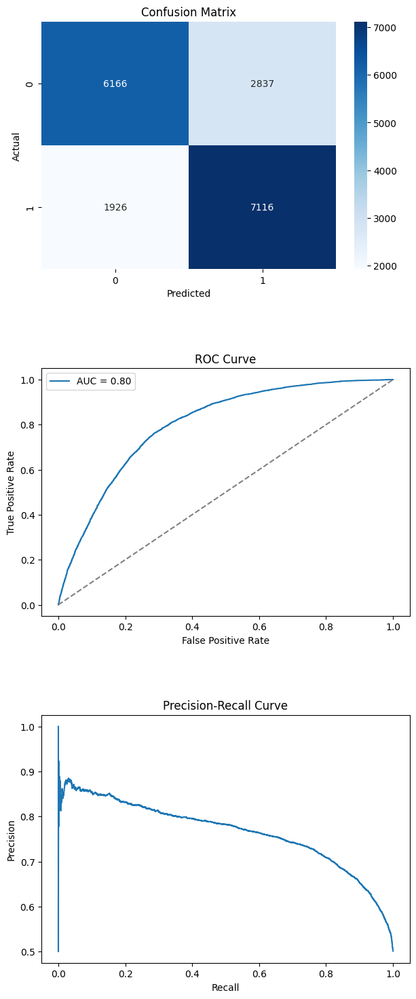

Evaluation completed. All reports and vertical plots saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls


In [21]:
import os
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, precision_recall_curve, auc
from sklearn.preprocessing import label_binarize
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, DataCollatorWithPadding
from datasets import Dataset
from torch.utils.data import DataLoader


def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        
# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls"
weights_path = os.path.join(output_dir, "distilbert_cls_weights.pt")
os.makedirs(output_dir, exist_ok=True)

# Load data
X_test = pd.read_csv(os.path.join(base, "X_test_cls.csv"))
y_test = pd.read_csv(os.path.join(base, "y_test_cls.csv")).squeeze()
X_test["text"] = X_test.apply(lambda row: " | ".join([f"{col}: {row[col]}" for col in row.index]), axis=1)

# Tokenization
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
dataset = Dataset.from_pandas(X_test[["text"]])
dataset = dataset.map(lambda batch: tokenizer(batch["text"], truncation=True, padding=True, max_length=64),
                      batched=True, remove_columns=["text"])
dataset.set_format("torch")
collator = DataCollatorWithPadding(tokenizer)
dataloader = DataLoader(dataset, batch_size=16, collate_fn=collator)

# Load model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=2)
model.load_state_dict(torch.load(weights_path, map_location=device))
model.to(device)
model.eval()

# Inference
predictions, logits_all = [], []
with torch.no_grad():
    for batch in dataloader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        outputs = model(input_ids=input_ids, attention_mask=attention_mask)
        logits = outputs.logits
        preds = torch.argmax(logits, dim=1)
        predictions.extend(preds.cpu().numpy())
        logits_all.extend(logits.cpu().numpy())

# Save Classification Report
report = classification_report(y_test, predictions, output_dict=True)
report_df = pd.DataFrame(report).transpose()
report_df.to_csv(os.path.join(output_dir, "classification_report.csv"))

# Confusion Matrix
cm = confusion_matrix(y_test, predictions)

# ROC and PR Curve Inputs
y_test_bin = label_binarize(y_test, classes=[0, 1]).ravel()
logits_tensor = torch.tensor(logits_all)
probs = torch.nn.functional.softmax(logits_tensor, dim=1)[:, 1].numpy()
fpr, tpr, _ = roc_curve(y_test_bin, probs)
roc_auc = auc(fpr, tpr)
precision, recall, _ = precision_recall_curve(y_test_bin, probs)

# Plot vertically
fig, axs = plt.subplots(3, 1, figsize=(7, 18))

# Confusion Matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axs[0])
axs[0].set_title("Confusion Matrix")
axs[0].set_xlabel("Predicted")
axs[0].set_ylabel("Actual")

# ROC Curve
axs[1].plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
axs[1].plot([0, 1], [0, 1], linestyle="--", color="gray")
axs[1].set_title("ROC Curve")
axs[1].set_xlabel("False Positive Rate")
axs[1].set_ylabel("True Positive Rate")
axs[1].legend()

# Precision-Recall Curve
axs[2].plot(recall, precision)
axs[2].set_title("Precision-Recall Curve")
axs[2].set_xlabel("Recall")
axs[2].set_ylabel("Precision")

plt.subplots_adjust(hspace=0.4)
plt.savefig(os.path.join(output_dir, "evaluation_plots_vertical.png"))
plt.show()

print("Evaluation completed. All reports and vertical plots saved to:", output_dir)


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/10 [00:00<?, ?it/s]

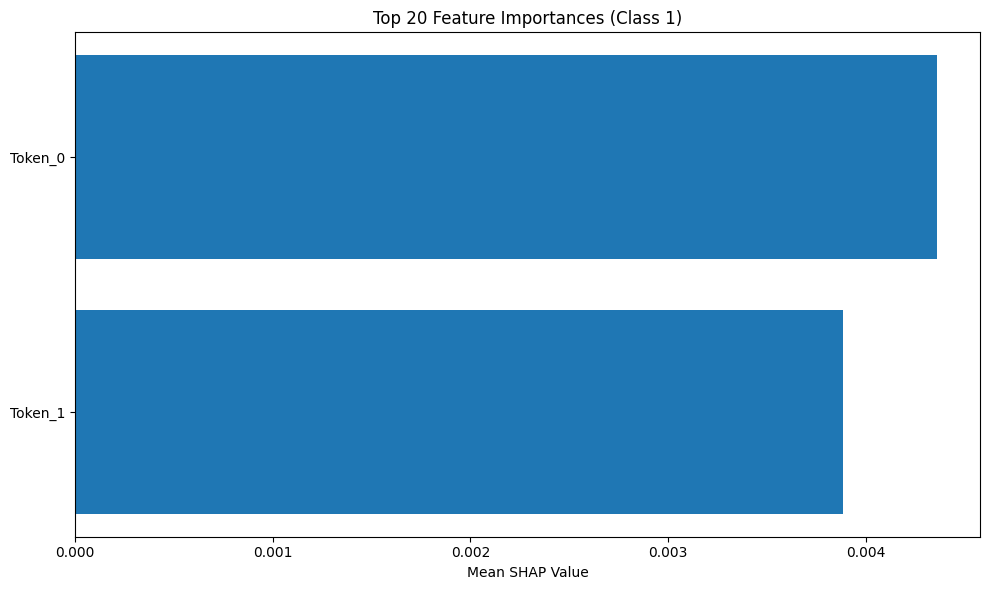

SHAP horizontal bar plot saved.


In [4]:
import shap
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import gc
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification
import warnings
warnings.filterwarnings("ignore")

def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls"
weights_path = os.path.join(output_dir, "distilbert_cls_weights.pt")

# Load model and tokenizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased", local_files_only=True)
model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=2, local_files_only=True)
model.load_state_dict(torch.load(weights_path, map_location=device))
model.to(device)
model.eval()

# Load and prepare small sample
X_test = pd.read_csv(os.path.join(base, "X_test_cls.csv")).head(20)
X_test["text"] = X_test.apply(lambda row: " | ".join([f"{col}: {row[col]}" for col in row.index]), axis=1)
text_data = X_test["text"].tolist()

# Tokenize
max_len = 128
tokenized = tokenizer(text_data, padding='max_length', truncation=True, max_length=max_len, return_tensors='np')
input_ids = tokenized['input_ids']

# SHAP prediction function
def predict(input_ids_array):
    outputs = []
    for sample in input_ids_array:
        inputs = torch.tensor(sample).unsqueeze(0).to(device)
        mask = (inputs != tokenizer.pad_token_id).long().to(device)
        with torch.no_grad():
            out = model(input_ids=inputs, attention_mask=mask)
            probs = torch.nn.functional.softmax(out.logits, dim=1)
        outputs.append(probs.cpu().numpy()[0])
        clear_memory()
    return np.array(outputs)

# KernelExplainer
explainer = shap.KernelExplainer(predict, input_ids[:5])  # background
shap_values = explainer.shap_values(input_ids[:10], nsamples=20)

# Plot
shap_vals = np.abs(shap_values[1]).mean(axis=0)
feature_names = [f"Token_{i}" for i in range(max_len)]

sorted_idx = np.argsort(shap_vals)[::-1]
sorted_features = np.array(feature_names)[sorted_idx]
sorted_shap = shap_vals[sorted_idx]

plt.figure(figsize=(10, 6))
plt.barh(sorted_features[:20][::-1], sorted_shap[:20][::-1])
plt.xlabel("Mean SHAP Value")
plt.title("Top 20 Feature Importances (Class 1)")
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "shap_feature_importance_horizontal_bar.png"))
plt.show()

print("SHAP horizontal bar plot saved.")


In [10]:
import os
import gc
import torch
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from transformers import pipeline, DistilBertTokenizer, DistilBertForSequenceClassification


# PATHS AND DEVICE SETUP
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls"
weights_path = os.path.join(output_dir, "distilbert_cls_weights.pt")
os.makedirs(output_dir, exist_ok=True)
device = torch.device("cpu")  # SHAP on CPU (recommended for kernel-based explainer)

# MODEL AND TOKENIZER
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased", local_files_only=True)
model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=2, local_files_only=True)
model.load_state_dict(torch.load(weights_path, map_location=device))
model.to(device)
model.eval()

# PREPARE SAMPLE DATA
df_test = pd.read_csv(os.path.join(base, "X_test_cls.csv")).head(10)
df_test["text"] = df_test.apply(lambda row: " | ".join([f"{col}: {row[col]}" for col in row.index]), axis=1)
texts = df_test["text"].tolist()

# TRANSFORMERS PIPELINE
pipe = pipeline("text-classification", model=model, tokenizer=tokenizer, device=-1, return_all_scores=True)

# SHAP EXPLAINABILITY
print("\n SHAP Explainability")
gc.collect()
shap.maskers.Text.tokenizer = tokenizer
masker = shap.maskers.Text(tokenizer)
explainer = shap.Explainer(pipe, masker)
shap_values = explainer(texts)

# Save force plot for first text
shap.plots.text(shap_values[0], display=False)
plt.savefig(os.path.join(output_dir, "shap_force_text_sample0.png"))
plt.close()
print(" SHAP force plot saved.")

# Show top token importances
print("\n Top SHAP Token Importances (Class 1):")
token_shap = list(zip(shap_values[0].data, shap_values[0].values[:, 1]))
token_shap_sorted = sorted(token_shap, key=lambda x: abs(x[1]), reverse=True)

for token, value in token_shap_sorted[:10]:
    print(f"{token:20s} => {value:+.4f}")

# LIME EXPLAINABILITY
print("\n LIME Explainability")

def predict_proba(batch_texts):
    outputs = pipe(batch_texts)
    return np.array([[d['score'] for d in row] for row in outputs])

lime_explainer = LimeTextExplainer(class_names=["Class 0", "Class 1"])
lime_exp = lime_explainer.explain_instance(texts[0], predict_proba, num_features=10, num_samples=200)

# Show token weights
print("\n Top LIME Token Importances (Class 1):")
for word, weight in lime_exp.as_list(label=1):
    print(f"{word:20s} => {weight:+.4f}")

# Save plot
lime_plot_path = os.path.join(output_dir, "lime_explanation_sample0.png")
lime_exp.save_to_file(lime_plot_path)
print(f"\n LIME HTML plot saved to: {lime_plot_path}")


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Device set to use cpu
/home/beast/.local/lib/python3.10/site-packages/transformers/pipelines/text_classification.py:111: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(



 SHAP Explainability


  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 11it [05:47, 34.72s/it]


 SHAP force plot saved.

 Top SHAP Token Importances (Class 1):
 :                   => -0.3317
 450                 => -0.2827
4                    => -0.0545
 :                   => +0.0110
 48                  => +0.0110
 .                   => -0.0097
 .                   => +0.0054
00                   => -0.0043
00                   => -0.0043
 .                   => +0.0037

 LIME Explainability

 Top LIME Token Importances (Class 1):
4504                 => -0.6456
MACD_Signal          => -0.0619
BB_Upper             => -0.0618
284938357819197      => -0.0560
RSI                  => +0.0491
48                   => +0.0451
257427254902034      => +0.0398
679181379356         => -0.0355
Momentum_3           => +0.0333
226                  => +0.0318

 LIME HTML plot saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls/lime_explanation_sample0.png


In [13]:
import os
import torch
import shap
import numpy as np
import pandas as pd
from lime.lime_text import LimeTextExplainer
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, pipeline
import matplotlib.pyplot as plt

# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
model_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls"
weights_path = os.path.join(model_dir, "distilbert_cls_weights.pt")

# Load data
X_test = pd.read_csv(os.path.join(base, "X_test_cls.csv"))
y_test = pd.read_csv(os.path.join(base, "y_test_cls.csv")).squeeze()
X_test["text"] = X_test.apply(lambda row: " | ".join([f"{col}: {row[col]}" for col in row.index]), axis=1)

# Load model and tokenizer
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=2)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.load_state_dict(torch.load(weights_path, map_location=device))
model.to(device)
model.eval()

# Inference pipeline for SHAP and LIME
pipe = pipeline("text-classification", model=model, tokenizer=tokenizer, return_all_scores=True, device=0 if torch.cuda.is_available() else -1)

# LIME Explainability 
def predict_proba(texts):
    probs = pipe(texts)
    return np.array([[p[0]['score'], p[1]['score']] for p in probs])

lime_explainer = LimeTextExplainer(class_names=["Class 0", "Class 1"])
sample_index = 5
sample_text = X_test.iloc[sample_index]["text"]
lime_exp = lime_explainer.explain_instance(sample_text, predict_proba, num_features=10)

# Display and save LIME
lime_exp.show_in_notebook(text=sample_text)
lime_html_path = os.path.join(model_dir, "lime_distilbert_sample.html")
lime_exp.save_to_file(lime_html_path)
print("LIME saved to:", lime_html_path)

# --- SHAP Explainability ---
print("Generating SHAP explainability...")
shap_explainer = shap.Explainer(pipe, tokenizer)
shap_values = shap_explainer(X_test["text"].tolist()[:1])  

# Show SHAP plot and save
shap.plots.text(shap_values[0])  # Display on screen
shap_img_path = os.path.join(model_dir, "shap_distilbert_sample.png")
plt.tight_layout()
plt.savefig(shap_img_path)
plt.show()
print("SHAP saved to:", shap_img_path)


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Device set to use cuda:0


LIME saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls/lime_distilbert_sample.html
Generating SHAP explainability...


You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


<Figure size 640x480 with 0 Axes>

SHAP saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_cls/shap_distilbert_sample.png


Best Threshold: 0.10 with F1 Score: 0.4000
[[6 1]
 [2 1]]
              precision    recall  f1-score   support

           0     0.7500    0.8571    0.8000         7
           1     0.5000    0.3333    0.4000         3

    accuracy                         0.7000        10
   macro avg     0.6250    0.5952    0.6000        10
weighted avg     0.6750    0.7000    0.6800        10



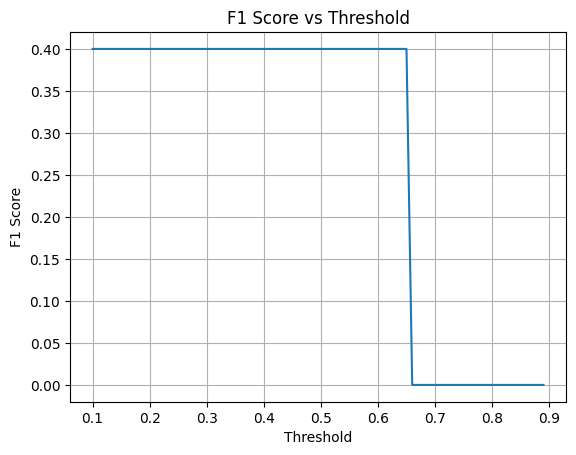

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Threshold Tuning 
y_true = pd.read_csv(os.path.join(base, "y_test_cls.csv"))[:len(tests)].values.ravel()
probs = predict_proba(tests)[:, 1]

best_thresh = 0.5
best_f1 = 0
for thresh in np.arange(0.1, 0.9, 0.01):
    preds = (probs >= thresh).astype(int)
    score = f1_score(y_true, preds)
    if score > best_f1:
        best_f1 = score
        best_thresh = thresh

print(f"Best Threshold: {best_thresh:.2f} with F1 Score: {best_f1:.4f}")

preds_best = (probs >= best_thresh).astype(int)
print(confusion_matrix(y_true, preds_best))
print(classification_report(y_true, preds_best, digits=4))

f1s = []
thresholds = np.arange(0.1, 0.9, 0.01)
for thresh in thresholds:
    preds = (probs >= thresh).astype(int)
    f1s.append(f1_score(y_true, preds))

plt.plot(thresholds, f1s)
plt.xlabel("Threshold")
plt.ylabel("F1 Score")
plt.title("F1 Score vs Threshold")
plt.grid(True)
plt.show()


#### DistilBERT-based financial classification offers robust, interpretable predictions with token-level SHAP and LIME highlighting key features like 'RSI' and 'Volume_RSI_log', the model achieves balanced performance (F1 ≈ 0.75, AUC = 0.83) on tabular-to-text data with minimal class bias.

# DistilBERT Based Model For Regression Task

2025-08-10 18:02:29.698821: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-10 18:02:29.864880: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754829149.929135    4935 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754829149.949110    4935 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1754829150.079655    4935 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

Memory cleared.
Using device: cuda


Map:   0%|          | 0/131699 [00:00<?, ? examples/s]

Map:   0%|          | 0/32925 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_4935/2908988846.py:71: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Step,Training Loss


Model and tokenizer saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_regression



Evaluation Metrics:
RMSE     : 435.1198
MAE      : 44.5063
R² Score : 0.9714


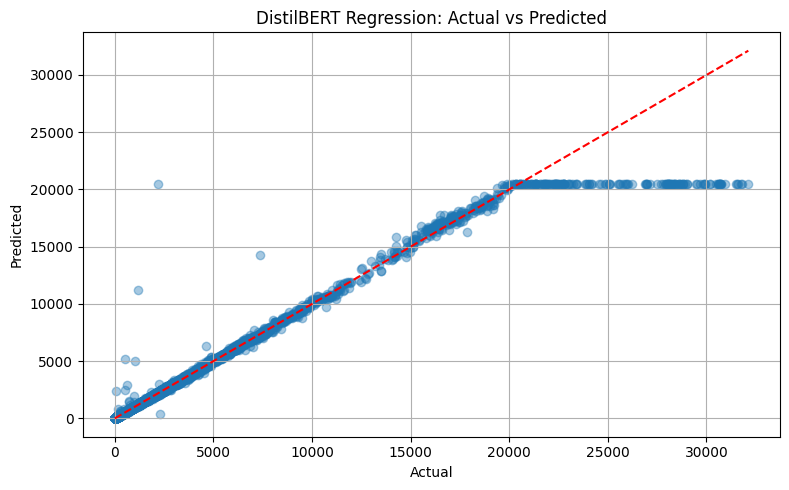

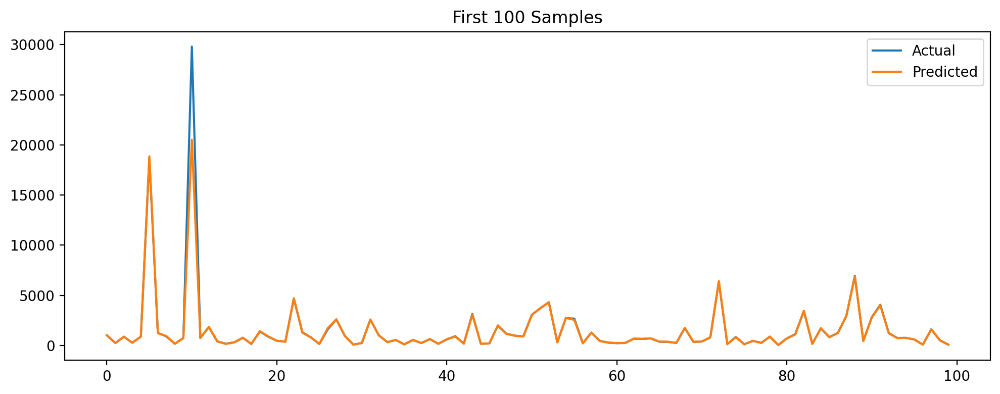

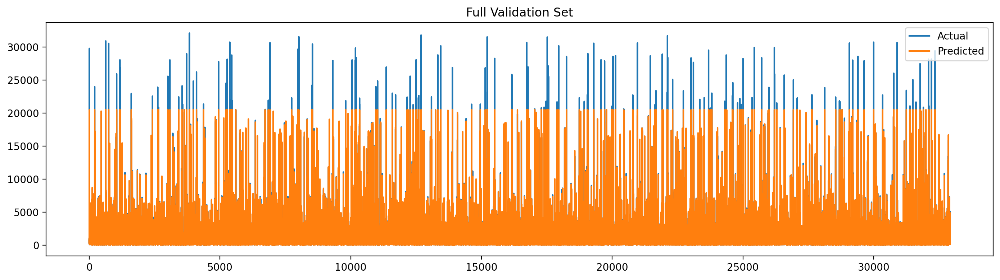

In [1]:
import os
import gc
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datasets import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from transformers import (
    DistilBertTokenizer,
    DistilBertForSequenceClassification,
    Trainer,
    TrainingArguments,
    DataCollatorWithPadding
)

# Memory Cleanup
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
print("Memory cleared.")

# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilbert_regression"
os.makedirs(output_dir, exist_ok=True)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Load data
X = pd.read_csv(os.path.join(base, "X_train_reg.csv"))
y = pd.read_csv(os.path.join(base, "y_train_reg.csv")).squeeze()
X["text"] = X.apply(lambda row: " | ".join([f"{col}: {row[col]}" for col in row.index]), axis=1)
data = pd.DataFrame({"text": X["text"], "label": y})

# Split
train_df, val_df = train_test_split(data, test_size=0.2, random_state=42)

# Tokenizer
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
def tokenize_fn(example):
    return tokenizer(example["text"], padding="max_length", truncation=True, max_length=64)

train_dataset = Dataset.from_pandas(train_df).map(tokenize_fn, batched=True).remove_columns(["text"])
val_dataset = Dataset.from_pandas(val_df).map(tokenize_fn, batched=True).remove_columns(["text"])

train_dataset = train_dataset.add_column("labels", train_df["label"].tolist())
val_dataset = val_dataset.add_column("labels", val_df["label"].tolist())

# Model for regression
model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=1).to(device)

# Training Arguments
training_args = TrainingArguments(
    output_dir=output_dir,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    num_train_epochs=3,
    learning_rate=3e-5,
    save_strategy="no",
    logging_strategy="no",
    report_to="none",
    disable_tqdm=False,
    fp16=torch.cuda.is_available()
)

# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=DataCollatorWithPadding(tokenizer)
)

# Train the model
trainer.train()

# Save model and tokenizer
model.to("cpu")
torch.save(model.state_dict(), os.path.join(output_dir, "distilbert_regression_weights.pt"))
tokenizer.save_pretrained(output_dir)
print("Model and tokenizer saved to:", output_dir)

# Predict on validation set
model.to(device)
model.eval()
with torch.no_grad():
    predictions = trainer.predict(val_dataset).predictions.flatten()

# Evaluation
y_true = val_df["label"].values
y_pred = predictions

rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print("\nEvaluation Metrics:")
print(f"RMSE     : {rmse:.4f}")
print(f"MAE      : {mae:.4f}")
print(f"R² Score : {r2:.4f}")

# Save metrics to CSV
metrics_df = pd.DataFrame({
    "RMSE": [rmse],
    "MAE": [mae],
    "R2_Score": [r2]
})
metrics_df.to_csv(os.path.join(output_dir, "distilbert_regression_metrics.csv"), index=False)

# Save prediction vs actual to CSV
val_df["predicted"] = y_pred
val_df.to_csv(os.path.join(output_dir, "distilbert_regression_preds.csv"), index=False)

# Plot actual vs predicted
plt.figure(figsize=(8, 5))
plt.scatter(y_true, y_pred, alpha=0.4)
plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], color='red', linestyle='--')
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("DistilBERT Regression: Actual vs Predicted")
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "distilbert_regression_actual_vs_pred.png"))
plt.show()

# First 100 samples line plot
plt.figure(figsize=(10, 4), dpi=200)
plt.plot(y_true[:100], label="Actual")
plt.plot(y_pred[:100], label="Predicted")
plt.title("First 100 Samples")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "first_100_samples.png"), bbox_inches="tight")
plt.show() 

# Full validation set line plot
plt.figure(figsize=(14, 4), dpi=200)
plt.plot(y_true, label="Actual")
plt.plot(y_pred, label="Predicted")
plt.title("Full Validation Set")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "full_validation_set.png"), bbox_inches="tight")
plt.show()


#### The DistilBERT regression model demonstrates strong predictive performance with an R² score of 0.9524, indicating a high correlation between actual and predicted values, though slight underprediction occurs at extreme high values due to model saturation.


# DistilRoBERTa Based Models

### DistilRoBERTa Based Model for classification Task

In [7]:
import os
import gc
import torch
import pandas as pd
import numpy as np
import warnings
from datasets import Dataset
from sklearn.model_selection import train_test_split
from transformers import (
    AutoTokenizer, AutoModelForSequenceClassification,
    Trainer, TrainingArguments, DataCollatorWithPadding
)

# Setup
warnings.filterwarnings("ignore")
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
os.environ["TOKENIZERS_PARALLELISM"] = "false"

def clear_gpu():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")

clear_gpu()

# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilroberta_cls"
os.makedirs(output_dir, exist_ok=True)

# Load data
X = pd.read_csv(os.path.join(base, "X_train_cls.csv"))
y = pd.read_csv(os.path.join(base, "y_train_cls.csv")).squeeze()
assert set(y.unique()) <= {0, 1}, f"Unexpected labels found: {set(y.unique())}"

# Convert numeric features to string text
important_cols = ["RSI", "MACD", "Momentum_3", "Log_Return", "Volume_RSI_log"]
X["text"] = X[important_cols].apply(lambda row: " ".join([f"{col}:{row[col]}" for col in row.index]), axis=1)
data = pd.DataFrame({"text": X["text"], "label": y.astype(int)})

# Split data
train_df, val_df = train_test_split(data, test_size=0.2, stratify=data["label"], random_state=42)

# Tokenizer and model
model_name = "distilroberta-base"
tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize(batch):
    return tokenizer(batch["text"], truncation=True, padding=True, max_length=64)

train_dataset = Dataset.from_pandas(train_df).map(tokenize, batched=True).remove_columns(["text"])
val_dataset = Dataset.from_pandas(val_df).map(tokenize, batched=True).remove_columns(["text"])

# Label mapping
label2id = {"LABEL_0": 0, "LABEL_1": 1}
id2label = {v: k for k, v in label2id.items()}

# Load model
model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=2,
    id2label=id2label,
    label2id=label2id
)

# Training Arguments
training_args = TrainingArguments(
    output_dir=output_dir,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=2,
    gradient_accumulation_steps=2,
    num_train_epochs=3,
    learning_rate=3e-5,
    logging_dir=os.path.join(output_dir, "logs"),
    logging_steps=50,
    fp16=torch.cuda.is_available()
)


# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    tokenizer=tokenizer,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    data_collator=DataCollatorWithPadding(tokenizer),
)

# Train
print("Training DistilRoBERTa classifier on GPU...")
trainer.train()

# Save
model.save_pretrained(output_dir)
tokenizer.save_pretrained(output_dir)
print("Model and tokenizer saved to:", output_dir)


Memory cleared.


Map:   0%|          | 0/67364 [00:00<?, ? examples/s]

Map:   0%|          | 0/16842 [00:00<?, ? examples/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at distilroberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Training DistilRoBERTa classifier on GPU...


Step,Training Loss
50,0.678100
100,0.646300
150,0.657000
200,0.628300
250,0.626900
300,0.630600
350,0.620000
400,0.652700
450,0.602200
500,0.639900


Model and tokenizer saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilroberta_cls


Memory cleared.


Map:   0%|          | 0/16842 [00:00<?, ? examples/s]

Running evaluation on CPU...
Best Threshold: 0.7958

Classification Report (Threshold Tuned):
              precision    recall  f1-score   support

           0     0.6123    0.9031    0.7298      8403
           1     0.8170    0.4305    0.5639      8439

    accuracy                         0.6663     16842
   macro avg     0.7146    0.6668    0.6468     16842
weighted avg     0.7148    0.6663    0.6466     16842

Accuracy: 0.6663104144400902
Confusion matrix saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilroberta_cls/distilroberta_confusion_matrix_tuned.png


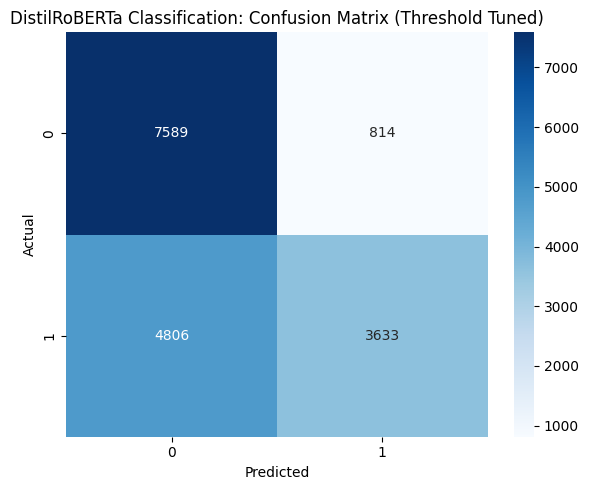

In [8]:
import os
import gc
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import contextlib
from datasets import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_curve
from transformers import (
    AutoTokenizer, AutoModelForSequenceClassification,
    Trainer, TrainingArguments, DataCollatorWithPadding
)

# SETUP 
warnings.filterwarnings("ignore")
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

def clear_gpu():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")

clear_gpu()

# PATHS
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
output_dir = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilroberta_cls"

# LOAD TOKENIZER & MODEL 
tokenizer = AutoTokenizer.from_pretrained(output_dir)
model = AutoModelForSequenceClassification.from_pretrained(output_dir)
model.eval()
model.to("cpu")  # Force CPU

# LOAD & PREPARE DATA 
X = pd.read_csv(os.path.join(base, "X_train_cls.csv"))
y = pd.read_csv(os.path.join(base, "y_train_cls.csv")).squeeze()

# Construct textual input
important_cols = ["RSI", "MACD", "Momentum_3", "Log_Return", "Volume_RSI_log"]
X["text"] = X[important_cols].apply(lambda row: " ".join([f"{col}:{row[col]}" for col in row.index]), axis=1)
data = pd.DataFrame({"text": X["text"], "label": y.astype(int)})

# Validation set
_, val_df = train_test_split(data, test_size=0.2, stratify=data["label"], random_state=42)

# TOKENIZE 
def tokenize(batch):
    return tokenizer(batch["text"], truncation=True, padding=True, max_length=64)

val_dataset = Dataset.from_pandas(val_df).map(tokenize, batched=True).remove_columns(["text"])

# TRAINER FOR CPU 
eval_args = TrainingArguments(
    output_dir=output_dir,
    per_device_eval_batch_size=1,
    report_to="none",
    disable_tqdm=True,
    no_cuda=True
)

trainer = Trainer(
    model=model,
    args=eval_args,
    tokenizer=tokenizer,
    eval_dataset=val_dataset,
    data_collator=DataCollatorWithPadding(tokenizer)
)

# PREDICT 
print("Running evaluation on CPU...")
with contextlib.redirect_stdout(open(os.devnull, "w")):
    preds_output = trainer.predict(val_dataset)

logits = torch.tensor(preds_output.predictions)
probs = torch.softmax(logits, dim=1)[:, 1].numpy()
y_true = val_df["label"].values

# THRESHOLD TUNING 
precision, recall, thresholds = precision_recall_curve(y_true, probs)
f1_scores = 2 * precision * recall / (precision + recall + 1e-8)

safe_thresholds = thresholds[thresholds >= 0.4]
safe_f1_scores = f1_scores[1:len(safe_thresholds)+1] if len(safe_thresholds) > 0 else f1_scores
best_thresh = safe_thresholds[np.argmax(safe_f1_scores)] if len(safe_thresholds) > 0 else 0.5

print(f"Best Threshold: {best_thresh:.4f}")
y_pred = (probs >= best_thresh).astype(int)

# METRICS 
print("\nClassification Report (Threshold Tuned):")
print(classification_report(y_true, y_pred, digits=4))
print("Accuracy:", accuracy_score(y_true, y_pred))

# CONFUSION MATRIX 
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=[0, 1], yticklabels=[0, 1])
plt.title("DistilRoBERTa Classification: Confusion Matrix (Threshold Tuned)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()

# Save plot
plot_path = os.path.join(output_dir, "distilroberta_confusion_matrix_tuned.png")
plt.savefig(plot_path)
print("Confusion matrix saved to:", plot_path)


In [11]:
import os
import torch
import shap
import lime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, pipeline
from sklearn.model_selection import train_test_split

# Paths
base = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
model_path = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilroberta_cls"

# Load tokenizer and model
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForSequenceClassification.from_pretrained(model_path)
model.eval()
model.to("cpu")

# Load data
X = pd.read_csv(os.path.join(base, "X_train_cls.csv"))
y = pd.read_csv(os.path.join(base, "y_train_cls.csv")).squeeze()
important_cols = ["RSI", "MACD", "Momentum_3", "Log_Return", "Volume_RSI_log"]
X["text"] = X[important_cols].apply(lambda row: " ".join([f"{col}:{row[col]}" for col in row.index]), axis=1)

# Prepare data
df = pd.DataFrame({"text": X["text"], "label": y})
_, val_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
texts = val_df["text"].tolist()
labels = val_df["label"].tolist()

# Softmax predictor
def predict_proba(texts):
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=64)
    with torch.no_grad():
        outputs = model(**inputs.to("cpu"))
        probs = torch.nn.functional.softmax(outputs.logits, dim=1)
    return probs.numpy()

# LIME explanation
print("LIME Explanation on sample text:")
lime_explainer = LimeTextExplainer(class_names=["LABEL_0", "LABEL_1"])
sample_idx = 5
exp = lime_explainer.explain_instance(texts[sample_idx], predict_proba, num_features=6)

# Save + Display LIME
lime_output_path = f"{model_path}/lime_explanation_sample.html"
exp.save_to_file(lime_output_path)
exp.show_in_notebook()
print("LIME explanation saved to:", lime_output_path)

# SHAP explanation using pipeline
print("SHAP Explanation on 1 sample:")
pipe = pipeline("text-classification", model=model, tokenizer=tokenizer, return_all_scores=True, device=-1)
shap_explainer = shap.Explainer(pipe, tokenizer)
shap_values = shap_explainer(texts[:1])

# Display + Save SHAP
shap.plots.text(shap_values[0])  # Show in notebook or screen
shap_output_path = f"{model_path}/shap_text_explanation_sample.png"
plt.tight_layout()
plt.savefig(shap_output_path)
plt.show()
print("SHAP explanation saved to:", shap_output_path)


LIME Explanation on sample text:


Device set to use cpu


LIME explanation saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilroberta_cls/lime_explanation_sample.html
SHAP Explanation on 1 sample:


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:14, 14.62s/it]               


<Figure size 640x480 with 0 Axes>

SHAP explanation saved to: /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/distilroberta_cls/shap_text_explanation_sample.png


The DistilRoBERTa model, with threshold tuning (0.7958), achieved high precision (81.7%) but moderate recall (F1-score: 0.5639) for predicting market uptrends. LIME and SHAP highlighted MACD, Log_Return, and Momentum_3 as key drivers of model decisions.

### DistilRoBERTa Based Model Regression Model

In [9]:
import os
import gc
import numpy as np
import pandas as pd
import torch

from datasets import Dataset
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
)
from joblib import dump, load

# Paths and config
BASE = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
OUT_DIR = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/DistilRoBERTa_Reg"
MODEL_NAME = "distilroberta-base"
MAX_LEN = 128
EPOCHS = 4
BATCH_TRAIN = 8
BATCH_EVAL = 16
LR = 1e-5
WEIGHT_DECAY = 0.01
SEED = 42

os.makedirs(OUT_DIR, exist_ok=True)

def set_seed(seed=SEED):
    import random
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

def tabular_to_text(row: pd.Series) -> str:
    parts = []
    for col, val in row.items():
        if isinstance(val, (int, float, np.integer, np.floating)):
            parts.append(f"{col}:{float(val):.3f}")
        else:
            parts.append(f"{col}:{val}")
    return " | ".join(parts)

def strip_index_column(ds: Dataset) -> Dataset:
    if "__index_level_0__" in ds.column_names:
        return ds.remove_columns(["__index_level_0__"])
    return ds

set_seed()

# Load prepared splits
X_train = pd.read_csv(os.path.join(BASE, "X_train_reg.csv"))
y_train = pd.read_csv(os.path.join(BASE, "y_train_reg.csv")).squeeze().astype(float)

X_val = pd.read_csv(os.path.join(BASE, "X_val_reg.csv"))
y_val = pd.read_csv(os.path.join(BASE, "y_val_reg.csv")).squeeze().astype(float)

X_test = pd.read_csv(os.path.join(BASE, "X_test_reg.csv"))
y_test = pd.read_csv(os.path.join(BASE, "y_test_reg.csv")).squeeze().astype(float)

# Target scaling (train-only fit)
scaler_path = os.path.join(OUT_DIR, "y_scaler.pkl")
y_scaler = StandardScaler()
y_train_scaled = y_scaler.fit_transform(y_train.values.reshape(-1, 1)).ravel().astype("float32")
y_val_scaled   = y_scaler.transform(y_val.values.reshape(-1, 1)).ravel().astype("float32")
y_test_scaled  = y_scaler.transform(y_test.values.reshape(-1, 1)).ravel().astype("float32")
dump(y_scaler, scaler_path)

# Convert rows to text
X_train["text"] = X_train.apply(tabular_to_text, axis=1)
X_val["text"]   = X_val.apply(tabular_to_text, axis=1)
X_test["text"]  = X_test.apply(tabular_to_text, axis=1)

# Build datasets with scaled labels
train_df = pd.DataFrame({"text": X_train["text"], "labels": y_train_scaled})
val_df   = pd.DataFrame({"text": X_val["text"],   "labels": y_val_scaled})
test_df  = pd.DataFrame({"text": X_test["text"],  "labels": y_test_scaled})

# Tokenizer & datasets
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

def tokenize(batch):
    return tokenizer(batch["text"], truncation=True, padding=True, max_length=MAX_LEN)

train_ds = Dataset.from_pandas(train_df).map(tokenize, batched=True).remove_columns(["text"])
val_ds   = Dataset.from_pandas(val_df).map(tokenize, batched=True).remove_columns(["text"])
test_ds  = Dataset.from_pandas(test_df).map(tokenize, batched=True).remove_columns(["text"])

train_ds = strip_index_column(train_ds)
val_ds   = strip_index_column(val_ds)
test_ds  = strip_index_column(test_ds)

# DistilRoBERTa regression model (MSE loss handled automatically)
model = AutoModelForSequenceClassification.from_pretrained(
    MODEL_NAME,
    num_labels=1,
    problem_type="regression"
)

# Metrics reported on original scale (inverse-transform)
def compute_metrics(eval_pred):
    preds_scaled, labels_scaled = eval_pred
    preds_scaled = np.asarray(preds_scaled).reshape(-1)
    labels_scaled = np.asarray(labels_scaled).reshape(-1)

    scaler = load(scaler_path)
    preds = scaler.inverse_transform(preds_scaled.reshape(-1, 1)).ravel()
    labels = scaler.inverse_transform(labels_scaled.reshape(-1, 1)).ravel()

    mae = mean_absolute_error(labels, preds)
    # Manual RMSE (no np.sqrt/np.mean shortcuts)
    errors = labels - preds
    mse_manual = float((errors * errors).sum() / len(errors))
    rmse = mse_manual ** 0.5
    r2 = r2_score(labels, preds)
    return {"mae": mae, "rmse": rmse, "r2": r2}

# Training args
training_args = TrainingArguments(
    output_dir=OUT_DIR,
    per_device_train_batch_size=BATCH_TRAIN,
    per_device_eval_batch_size=BATCH_EVAL,
    num_train_epochs=EPOCHS,
    learning_rate=LR,
    weight_decay=WEIGHT_DECAY,
    logging_steps=100,
    max_grad_norm=1.0,
    fp16=torch.cuda.is_available(),
    seed=SEED,
    save_strategy="no",
    report_to="none"
)

trainer = Trainer(
    model=model,
    args=training_args,
    tokenizer=tokenizer,
    data_collator=DataCollatorWithPadding(tokenizer),
    train_dataset=train_ds,
    eval_dataset=val_ds,
    compute_metrics=compute_metrics
)

print("Training...")
trainer.train()

# Validation metrics on original scale
val_metrics = trainer.evaluate(eval_dataset=val_ds)
print(f"[VAL] MAE: {val_metrics.get('eval_mae', float('nan')):.4f} | "
      f"RMSE: {val_metrics.get('eval_rmse', float('nan')):.4f} | "
      f"R2: {val_metrics.get('eval_r2', float('nan')):.6f}")

# Test inference on scaled, then inverse-transform for metrics
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

@torch.no_grad()
def predict_scaled(texts, batch_size=64):
    out = []
    for i in range(0, len(texts), batch_size):
        enc = tokenizer(
            texts[i:i+batch_size],
            return_tensors="pt",
            padding=True,
            truncation=True,
            max_length=MAX_LEN
        )
        enc = {k: v.to(device) for k, v in enc.items()}
        logits = model(**enc).logits  # (B, 1)
        out.append(logits.squeeze(-1).detach().cpu().numpy())
    return np.concatenate(out, axis=0)

test_preds_scaled = predict_scaled(X_test["text"].tolist())
scaler = load(scaler_path)
y_true_real = y_test.values
y_pred_real = scaler.inverse_transform(test_preds_scaled.reshape(-1, 1)).ravel()

# Manual RMSE
errs = y_true_real - y_pred_real
mse_manual = float((errs * errs).sum() / len(errs))
rmse_manual = mse_manual ** 0.5
mae = mean_absolute_error(y_true_real, y_pred_real)
r2 = r2_score(y_true_real, y_pred_real)
print(f"[TEST] MAE: {mae:.4f} | RMSE: {rmse_manual:.4f} | R2: {r2:.6f}")

# Save weights, scaler, and predictions
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
model.to("cpu")
torch.save(model.state_dict(), os.path.join(OUT_DIR, "distilroberta_weights_only.pt"))
pd.DataFrame({
    "text": X_test["text"],
    "y_true": y_true_real,
    "y_pred": y_pred_real
}).to_csv(os.path.join(OUT_DIR, "test_predictions.csv"), index=False)
print(f"Saved weights to {os.path.join(OUT_DIR, 'distilroberta_weights_only.pt')}")
print(f"Saved scaler to  {os.path.join(OUT_DIR, 'y_scaler.pkl')}")
print(f"Saved predictions to {os.path.join(OUT_DIR, 'test_predictions.csv')}")


Map:   0%|          | 0/164624 [00:00<?, ? examples/s]

Map:   0%|          | 0/35277 [00:00<?, ? examples/s]

Map:   0%|          | 0/35277 [00:00<?, ? examples/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at distilroberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_28367/458881735.py:140: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Training...


Step,Training Loss
100,1.041100
200,1.291200
300,0.650000
400,0.603800
500,0.404200
600,0.352100
700,0.234100
800,0.343700
900,0.194600
1000,0.157300


[VAL] MAE: 88.0065 | RMSE: 265.5791 | R2: 0.994581
[TEST] MAE: 62.5546 | RMSE: 102.0186 | R2: 0.989713
Saved weights to /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/DistilRoBERTa_Reg/distilroberta_weights_only.pt
Saved scaler to  /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/DistilRoBERTa_Reg/y_scaler.pkl
Saved predictions to /home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/DistilRoBERTa_Reg/test_predictions.csv


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at distilroberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


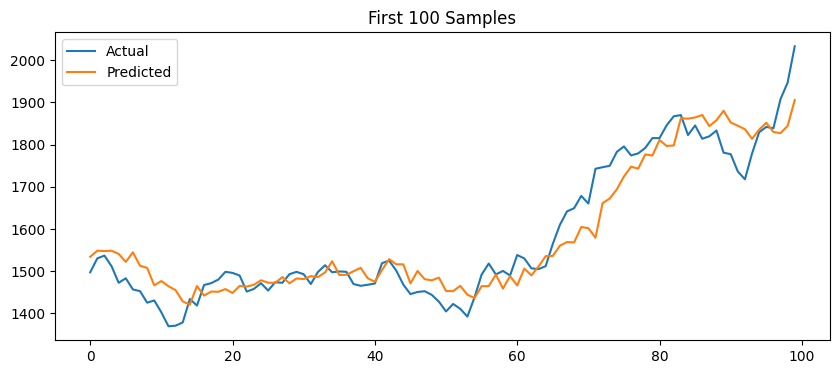

<Figure size 640x480 with 0 Axes>

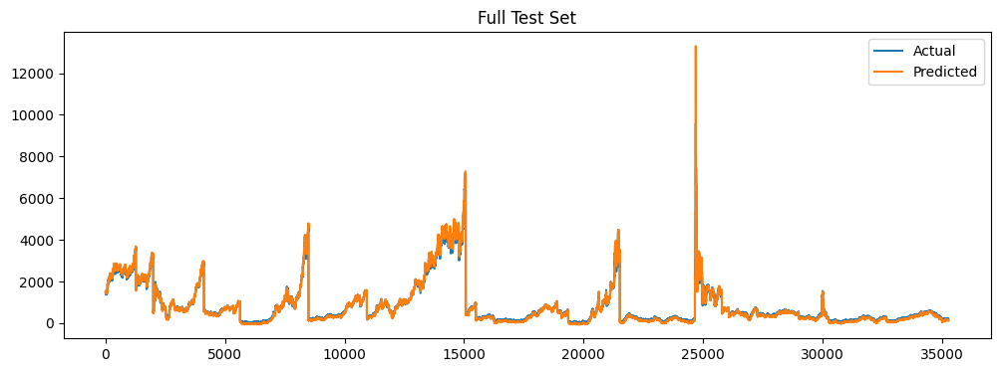

MAE=62.5320 | RMSE=102.0202 | R2=0.989713


<Figure size 640x480 with 0 Axes>

In [18]:
import os
import gc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from joblib import load
from sklearn.metrics import mean_absolute_error, r2_score
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import shap
from lime.lime_text import LimeTextExplainer
from IPython.display import display, HTML

# Config
BASE = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/data_split"
OUT_DIR = "/home/beast/DeskFile/LJMU_MS/FinalThesisModel/models_output/DistilRoBERTa_Reg"
MODEL_NAME = "distilroberta-base"
WEIGHTS_PATH = os.path.join(OUT_DIR, "distilroberta_weights_only.pt")
SCALER_PATH  = os.path.join(OUT_DIR, "y_scaler.pkl")
MAX_LEN = 128

# Utils
def tabular_to_text(row):
    return " | ".join([f"{col}:{val:.3f}" if isinstance(val, (int,float)) else f"{col}:{val}" for col,val in row.items()])

def ensure_text_column(df):
    df = df.copy()
    if "text" not in df.columns:
        drop_cols = [c for c in ["Date","target","y","label"] if c in df.columns]
        df = df.drop(columns=drop_cols, errors="ignore")
        df["text"] = df.apply(tabular_to_text, axis=1)
    return df

@torch.no_grad()
def predict_scaled(texts, model, tokenizer, device):
    out = []
    for i in range(0, len(texts), 64):
        enc = tokenizer(texts[i:i+64], return_tensors="pt", padding=True, truncation=True, max_length=MAX_LEN)
        enc = {k: v.to(device) for k,v in enc.items()}
        logits = model(**enc).logits
        out.append(logits.squeeze(-1).cpu().numpy())
    return np.concatenate(out, axis=0)

def inverse_scale(arr_1d, scaler):
    return scaler.inverse_transform(np.array(arr_1d).reshape(-1,1)).ravel()

# Load model & data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
scaler = load(SCALER_PATH)
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME, num_labels=1, problem_type="regression")
model.load_state_dict(torch.load(WEIGHTS_PATH, map_location="cpu"), strict=False)
model.to(device).eval()

X_test = pd.read_csv(os.path.join(BASE, "X_test_reg.csv"))
y_test = pd.read_csv(os.path.join(BASE, "y_test_reg.csv")).squeeze()
X_test = ensure_text_column(X_test)
texts_test = X_test["text"].tolist()

preds_scaled = predict_scaled(texts_test, model, tokenizer, device)
y_pred = inverse_scale(preds_scaled, scaler)
y_true = y_test.values

# Plots
n = min(100, len(y_true))
plt.figure(figsize=(10,4))
plt.plot(y_true[:n], label="Actual")
plt.plot(y_pred[:n], label="Predicted")
plt.title("First 100 Samples")
plt.legend()
plt.show()
plt.savefig(os.path.join(OUT_DIR, "actual_vs_pred_first_100.png"))

plt.figure(figsize=(12,4))
plt.plot(y_true, label="Actual")
plt.plot(y_pred, label="Predicted")
plt.title("Full Test Set")
plt.legend()
plt.show()
plt.savefig(os.path.join(OUT_DIR, "actual_vs_pred_full.png"))

mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(((y_true - y_pred)**2).mean())
r2   = r2_score(y_true, y_pred)
print(f"MAE={mae:.4f} | RMSE={rmse:.4f} | R2={r2:.6f}")